# PLOTTED Post-Processing Analysis: Figures 3-6

[![DOI](https://img.shields.io/badge/DOI-10.1038%2Fs41467--026--68460--x-blue)](https://doi.org/10.1038/s41467-026-68460-x)

## Overview

This notebook reproduces the analysis for **Figures 3-6** from:

> Le MT, McGehee J, Dunipace L, Rumph D, Stathopoulos A. (2026) *Inferring chromatin architecture at a single locus through probabilistic in situ DNA localization.* Nature Communications. DOI: [10.1038/s41467-026-68460-x](https://doi.org/10.1038/s41467-026-68460-x)

---

## Table of Contents

| Section | Description | Figure Reference |
|---------|-------------|------------------|
| [I. Configuration and Setup](#section-i-configuration-and-setup) | Paths, imports, core functions | - |
| [II. Load Data](#section-ii-load-data) | Load distance measurements for all genotypes | - |
| [III. Wild-type Time-Course](#section-iii-figure-3---wild-type-time-course-analysis) | WT PDFs and KS tests over developmental stages | **Figure 3A-B** |
| [IV. Δ800PPE Time-Course](#section-iv-figure-4---δ800ppe-mutant-time-course-analysis) | PPE mutant PDFs and KS tests | **Figure 4A** |
| [V. MiMIC Time-Course](#section-v-figure-5---mimic-mutant-time-course-analysis) | MiMIC mutant PDFs and KS tests | **Figure 5A** |
| [VI. Genotype Comparisons](#section-vi-figure-6---direct-genotype-comparisons) | WT vs mutant heatmaps | **Figure 6** |
| [VII. Joint Distribution Contours](#section-vii-joint-distribution-contours) | 2D contour/triangle plots | **Figures 3C-F, 4B-E, 5B-E** |
| [VIII. Anchor PPE Visualization](#section-viii-anchor-ppe-visualization) | PPE-centered contour plots | **Supplemental data** |
| [IX. Subtraction Contours](#section-ix-comprehensive-subtraction-contour-plots) | Difference contours between conditions | **Figures 3-6 panels** |
| [X. Anterior vs Posterior](#section-x-anterior-vs-posterior-regional-comparison) | A vs P regional comparison | **Figure 7 and Supplemental data** |
| [XI. Power Analysis](#section-xi-power-analysis) | Statistical power validation | **Methods** |
| [XII. Random Split Control](#section-xii-random-split-bias-control) | Sampling bias control | **Supplementary** |
| [XIII. Summary](#section-xiii-summary-and-outputs) | Output files and key findings | - |

---

## Scientific Background

### PLOTTED Method
**PLOTTED** (Probabilistic Localization of Oligopaint Tagged Target Element Distances) is an integrated imaging and computational framework that infers chromatin architecture from targeted high-resolution imaging of cis-regulatory modules (CRMs). The method generates spatial distance distributions between DNA loci, enabling quantitative modeling of chromatin configurations.

### The *brk* Locus
The *brinker* (*brk*) locus spans ~25 kB and contains three key regulatory elements:
- **E1**: Enhancer 1 (labeled with Alexa 550, pseudo-colored blue)
- **PPE**: Primary Promoter Element (labeled with Alexa 647, pseudo-colored green)
- **E2**: Enhancer 2 (labeled with Alexa 488, pseudo-colored red)

The genomic order is: E1 --- PPE --- E2 (5' to 3')

### Imaging Parameters
- **Microscope**: Zeiss LSM 980 with Fast Airyscan
- **Objective**: 63X with 1.5X digital zoom
- **Resolution limit**: 120 nm lateral (XY), 350 nm axial (Z)

### Genotypes Analyzed

| Genotype | Description | Expected Phenotype |
|----------|-------------|-------------------|
| **Wild-type (YW)** | Yellow-white background | Normal *brk* expression and chromatin dynamics |
| **Δ800PPE** | 800 bp deletion of proximal promoter | Reduced/delayed *brk* activation |
| **MiMIC** | MiMIC transposon insertion | Disrupted promoter-enhancer communication |

### Developmental Stages

| Stage | Nuclear Cycle | Time (min AEL) | Biological Context |
|-------|---------------|----------------|-------------------|
| Pre-nc13 | nc12 or earlier | ~95-110 | Before major zygotic activation |
| nc13 | nc13 | ~110-125 | Onset of *brk* expression |
| nc14-early | nc14A-B| ~130-150 | Active *brk* transcription |
| nc14-late | nc14C-D | ~150-170 | Peak *brk* expression |

---

## Figure Map

| Figure | Panel | Content | Notebook Section |
|--------|-------|---------|------------------|
| **Figure 3** | A-B | WT distance PDFs over time | Section III |
| **Figure 3** | C-F | WT joint distribution contours | Section VII |
| **Figure 4** | A-B | Δ800PPE distance PDFs over time | Section IV |
| **Figure 4** | C-F | Δ800PPE joint distribution contours | Section VII |
| **Figure 5** | A-B | MiMIC distance PDFs over time | Section V |
| **Figure 5** | C-F | MiMIC joint distribution contours | Section VII |
| **Figure 6** | A | WT vs Δ800PPE heatmap | Section VI |
| **Figure 6** | B | WT vs MiMIC heatmap | Section VI |
| **Figure 6** | C-D | Subtraction contours | Section IX |

---

## Statistical Methods

### Kolmogorov-Smirnov (KS) Test
Non-parametric test comparing two distributions without assuming normality. Quantifies the maximum distance between cumulative distribution functions (CDFs).

### False Discovery Rate (FDR) Correction
Multiple comparisons corrected using **Benjamini-Hochberg** procedure (α=0.05).

### Simes Global P-value
For joint hypothesis testing across multiple distance types (E1-PPE, E2-PPE, E1-E2), we compute a global p-value using the Simes method.

### Kernel Density Estimation (KDE)
PDFs constructed using Gaussian KDE with 95% confidence intervals via bootstrap (n=1000 resamples).

### Power Analysis
Simulation-based power analysis validates 80% statistical power for observed differences.

---


# Section I: Configuration and Setup

This section contains:
1. **Configuration**: Data paths and analysis parameters
2. **Imports**: Required Python packages
3. **Core Functions**: Reusable functions for data loading, analysis, and visualization

> **Note**: Update the `ROOTS` dictionary below if your data folder locations differ.


## 1.1 Configuration

**❗ Update the paths below if your data folder locations change.**

Expected folder structure:
```
ROOTS['YW']/
    Nc12/Male/*.csv
    Nc13/Male/*.csv
    Nc14_early/Male/*.csv
    Nc14_late/Male/*.csv
```

In [1]:
# =============================================================================             
# CONFIGURATION - Update paths here if data locations change                                
# =============================================================================             
                                                                                              
# Base path to data (absolute path for reliability)                                         
DATA_ROOT = '/Volumes/stathopouloslab/nina/Spots_troubleshooting/'                          
                                                                                              
ROOTS = {                                                                                   
    'YW': DATA_ROOT + '10_03_SR_T3_2_doublets_2_thres/YW_distances/',                       
    'PPE': DATA_ROOT + '10_03_SR_T3_2_doublets_2_thres/PPE_distances/',                     
    'MiMIC': DATA_ROOT + '02-11-25_MiMiC/Distances/',
}

# Developmental stages to analyze
STAGES = ['Nc12', 'Nc13', 'Nc14_early', 'Nc14_late']
STAGES_WITH_SEX = ['Nc12/Male', 'Nc13/Male', 'Nc14_early/Male', 'Nc14_late/Male']

# Labels for plots and tables
STAGE_LABELS = ['Pre-nc13', 'nc13', 'nc14-early', 'nc14-late']
GENOTYPE_LABELS = {
    'YW': 'Wild-type',
    'PPE': 'Δ800PPE',
    'MiMIC': 'MiMIC',
}

# Distance column mappings
DISTANCE_COLUMNS = {
    'E1-PPE': 'E1-PPE distance (um)',
    'E2-PPE': 'E2-PPE distance (um)',
    'E1-E2': 'E1-E2 distance (um)',
}

# Imaging resolution limits (Zeiss LSM 980 Airyscan)
# XY: 120 nm, Z: 350 nm
RESOLUTION_LIMITS = {
    'xy': 0.12,  # micrometers
    'z': 0.35,   # micrometers
}

# Color palette for developmental stages
STAGE_COLORS = ['red', '#FF00FF', '#3F7FFF', '#00008B']

## 1.2 Imports

In [2]:
# =============================================================================
# IMPORTS
# =============================================================================

# Standard library
import os
import glob
import warnings
warnings.filterwarnings('ignore')

# Data handling
import numpy as np
import pandas as pd

# Statistical analysis
from scipy.stats import gaussian_kde, ks_2samp
from scipy.interpolate import NearestNDInterpolator, LinearNDInterpolator
from scipy.spatial import ConvexHull
from statsmodels.stats.multitest import multipletests

# Visualization - Matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.patches import Polygon
from matplotlib.colors import LinearSegmentedColormap, BoundaryNorm
from matplotlib.collections import LineCollection
from matplotlib.lines import Line2D
from mpl_toolkits.axes_grid1 import make_axes_locatable
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import seaborn as sns

# Visualization - Bokeh (interactive plots)
import bokeh.io
import bokeh.layouts as bl
from bokeh.plotting import figure, show
from bokeh.models import ColumnDataSource, HoverTool, Range1d, Legend, LegendItem
import iqplot

# Enable Bokeh notebook output
bokeh.io.output_notebook()

print("✅ All packages imported successfully")

Loading BokehJS ...

✅ All packages imported successfully


## 1.3 Core Functions

The following functions are used throughout the analysis:

### Data Loading Functions
- `extract_distances_from_folders()`: Load distance CSVs from stage-organized folders
- `load_and_rename_distance_data()`: Load and rename distance columns
- `export_data_stages_to_excel()`: Export data to Excel with stage-specific sheets

### Resolution Filtering
- `below_resolution_limit()`: Check if distance is below imaging resolution
- `apply_resolution_filtering()`: Set sub-resolution distances to zero

### PDF/KDE Analysis
- `generate_plots()`: Create strip-box and KDE plots with bootstrap CI

### Statistical Analysis
- `perform_ks_tests_full_table()`: Pairwise KS tests with FDR correction
- `generate_pvalue_heatmap_strict_individual_side()`: FDR-corrected p-value heatmap
- `plot_single_row_pvalue_heatmap()`: Stage-matched comparison heatmap

### Contour/Triangle Analysis
- `compute_triangle_vertices_from_PDF()`: Compute triangle coordinates from distances
- `compute_weighted_Z()`: Compute weighted 2D PDF surface
- `plot_contour_stage()`: Plot contour visualization

In [3]:
# =============================================================================
# DATA LOADING FUNCTIONS
# =============================================================================

def extract_distances_from_folders(base_path, stages):
    """
    Extract distances (E1-PPE, E2-PPE, E1-E2) from CSV files across developmental stages.
    
    The find_spots GUI outputs distance measurements in columns:
    - leftDist: Distance from left spot to middle spot (E2-PPE in our labeling)
    - rightDist: Distance from right spot to middle spot (E1-PPE in our labeling)
    - leftRightDist: Distance between left and right spots (E1-E2)
    
    Note: The left/right assignment depends on the fluorophore assignment in the GUI.
    In this study: 488 (E2) = Left, 550 (E1) = Right, 647 (PPE) = Middle.
    
    Parameters
    ----------
    base_path : str
        Base directory containing stage folders
    stages : list
        Stage folder names (e.g., ['Nc12/Male', 'Nc13/Male'])
    
    Returns
    -------
    dict
        Dictionary with keys like 'Nc12/Male_E1-PPE' containing DataFrames
    """
    result = {}
    
    for stage in stages:
        folder_path = os.path.join(base_path, stage)
        csv_files = sorted(glob.glob(os.path.join(folder_path, "*.csv")))
        
        if not csv_files:
            print(f"⚠️ No CSV files found in {folder_path}")
            continue
        
        # Concatenate all CSV files for this stage
        dfs = [pd.read_csv(f) for f in csv_files]
        stage_df = pd.concat(dfs, axis=0, ignore_index=True)
        
        # Coordinate columns to keep
        coord_cols = ['Xleft', 'Yleft', 'Zleft', 
                      'Xmiddle', 'Ymiddle', 'Zmiddle',
                      'Xright', 'Yright', 'Zright']
        
        # Extract E2-PPE distances (leftDist)
        left_dist = stage_df.dropna(subset=['leftDist'])[coord_cols + ['leftDist']].copy()
        left_dist = left_dist.rename(columns={'leftDist': 'E2-PPE distance (um)'})
        result[f'{stage}_E2-PPE'] = left_dist
        
        # Extract E1-PPE distances (rightDist)
        right_dist = stage_df.dropna(subset=['rightDist'])[coord_cols + ['rightDist']].copy()
        right_dist = right_dist.rename(columns={'rightDist': 'E1-PPE distance (um)'})
        result[f'{stage}_E1-PPE'] = right_dist
        
        # Extract E1-E2 distances (leftRightDist)
        lr_dist = stage_df.dropna(subset=['leftRightDist'])[coord_cols + ['leftRightDist']].copy()
        lr_dist = lr_dist.rename(columns={'leftRightDist': 'E1-E2 distance (um)'})
        result[f'{stage}_E1-E2'] = lr_dist
        
        print(f"✅ {stage}: loaded {len(csv_files)} files, {len(stage_df)} total spots")
    
    return result


def load_and_rename_distance_data(base_path, prefix="YW"):
    """
    Load CSVs from stage folders and return combined DataFrames.
    
    Parameters
    ----------
    base_path : str
        Base directory containing Nc12, Nc13, etc. folders
    prefix : str
        Prefix for output dictionary keys (e.g., 'YW', 'PPE')
    
    Returns
    -------
    dict
        Dictionary with keys like 'YW_nc12', 'YW_nc13', etc.
    """
    base_path = os.path.abspath(base_path)
    if not os.path.isdir(base_path):
        raise FileNotFoundError(f"Base path does not exist: {base_path}")
    
    stage_candidates = {
        f"{prefix}_nc12": ["Nc12"],
        f"{prefix}_nc13": ["Nc13"],
        f"{prefix}_nc14_early": ["Nc14_early", "Nc14_Early"],
        f"{prefix}_nc14_late": ["Nc14_late", "Nc14_Late"],
    }
    
    results = {}
    
    for out_key, stage_names in stage_candidates.items():
        csv_files = []
        chosen_dir = None
        
        for stage in stage_names:
            stage_dir = os.path.join(base_path, stage)
            if os.path.isdir(stage_dir):
                chosen_dir = stage_dir
                csv_files = glob.glob(os.path.join(stage_dir, "*.csv"))
                if not csv_files:
                    csv_files = glob.glob(os.path.join(stage_dir, "**", "*.csv"), recursive=True)
                break
        
        if not csv_files:
            print(f"⚠️ {out_key}: no CSVs found")
            results[out_key] = pd.DataFrame()
            continue
        
        dfs = []
        for f in csv_files:
            df = pd.read_csv(f)
            df = df.rename(columns={
                "leftDist": "E2-PPE",
                "rightDist": "E1-PPE",
                "leftRightDist": "E1-E2"
            })
            dfs.append(df)
        
        results[out_key] = pd.concat(dfs, ignore_index=True)
        print(f"✅ {out_key}: {len(csv_files)} files, {results[out_key].shape[0]} rows")
    
    return results


def export_data_stages_to_excel(data, output_path):
    """
    Export distance data to Excel with one sheet per stage.
    
    Parameters
    ----------
    data : dict
        Dictionary of DataFrames keyed by stage
    output_path : str
        Output Excel file path
    """
    with pd.ExcelWriter(output_path, engine="openpyxl") as writer:
        for sheet_name, df in data.items():
            df.to_excel(writer, sheet_name=sheet_name, index=False)
    print(f"✅ Excel file created: '{output_path}'")

In [4]:
# =============================================================================
# RESOLUTION FILTERING FUNCTIONS
# =============================================================================

def below_resolution_limit(p1, p2, res_squared):
    """
    Check if distance between two 3D points is below imaging resolution.
    
    Uses an ellipsoidal distance metric to account for different XY and Z
    resolution limits of the Airyscan microscope.
    
    Parameters
    ----------
    p1, p2 : list
        [x, y, z] coordinates of two points
    res_squared : list
        [res_x^2, res_y^2, res_z^2] squared resolution limits
    
    Returns
    -------
    bool
        True if ellipsoidal distance < 1 (below resolution)
    """
    try:
        ellip_dist = (
            ((p1[0] - p2[0]) ** 2) / res_squared[0] +
            ((p1[1] - p2[1]) ** 2) / res_squared[1] +
            ((p1[2] - p2[2]) ** 2) / res_squared[2]
        )
        return ellip_dist < 1.0
    except:
        return False  # Missing coordinates


def apply_resolution_filtering(distance_data, res_xy=0.12, res_z=0.35):
    """
    Apply resolution filtering to distance measurements.
    
    Spots closer than the resolution limit are set to distance=0.
    
    Parameters
    ----------
    distance_data : dict
        Dictionary of DataFrames from extract_distances_from_folders()
    res_xy : float
        XY resolution in micrometers (default: 0.12 for Airyscan)
    res_z : float
        Z resolution in micrometers (default: 0.35 for Airyscan)
    
    Returns
    -------
    dict
        Filtered distance data
    """
    res_squared = [res_xy**2, res_xy**2, res_z**2]
    
    for key, df in distance_data.items():
        if "E2-PPE" in key:
            p1_cols = ['Xleft', 'Yleft', 'Zleft']
            p2_cols = ['Xmiddle', 'Ymiddle', 'Zmiddle']
            dist_col = 'E2-PPE distance (um)'
        elif "E1-PPE" in key:
            p1_cols = ['Xright', 'Yright', 'Zright']
            p2_cols = ['Xmiddle', 'Ymiddle', 'Zmiddle']
            dist_col = 'E1-PPE distance (um)'
        elif "E1-E2" in key:
            p1_cols = ['Xleft', 'Yleft', 'Zleft']
            p2_cols = ['Xright', 'Yright', 'Zright']
            dist_col = 'E1-E2 distance (um)'
        else:
            continue
        
        for idx, row in df.iterrows():
            if row[p1_cols + p2_cols].notna().all():
                p1 = row[p1_cols].tolist()
                p2 = row[p2_cols].tolist()
                if below_resolution_limit(p1, p2, res_squared):
                    df.at[idx, dist_col] = 0.0
    
    return distance_data

In [5]:
# =============================================================================
# PDF/KDE VISUALIZATION FUNCTIONS
# =============================================================================

def generate_plots(dataframes, distance_column, phenotype_label, x_axis_label=None):
    """
    Generate strip-box plot and PDF/KDE plot with bootstrap confidence intervals.
    
    Creates two side-by-side visualizations:
    1. Strip-box plot showing individual data points with swarm layout
    2. KDE/PDF plot with 95% CI from bootstrap resampling
    
    Parameters
    ----------
    dataframes : list
        List of 4 DataFrames (one per stage)
    distance_column : str
        Column name containing distance values
    phenotype_label : str
        Label for plot title (e.g., 'Wild-type')
    x_axis_label : str, optional
        Custom x-axis label
    
    Returns
    -------
    pdf_peaks : dict
        Peak x-values for each stage
    kde_results : dict
        KDE x and y arrays for each stage
    """
    arrays = [df[distance_column].dropna().to_numpy() for df in dataframes]
    label_to_use = x_axis_label if x_axis_label else distance_column
    
    # Combined DataFrame for strip-box
    df_combined = pd.DataFrame({
        "phenotype": [phenotype_label] * sum(len(arr) for arr in arrays),
        distance_column: np.concatenate(arrays),
        "stages": np.concatenate([[STAGE_LABELS[i]] * len(arr) for i, arr in enumerate(arrays)])
    })
    
    # Strip-box plot
    strip_box_plot = iqplot.stripbox(
        df_combined,
        q=distance_column,
        cats="stages",
        title=f"{phenotype_label}\nDistance: {label_to_use} over time",
        x_axis_label=label_to_use,
        y_axis_label="Developmental Stages",
        frame_height=500,
        spread='swarm',
        palette=STAGE_COLORS
    )
    
    # PDF plot
    pdf_plot = figure(
        title=f"{phenotype_label}\nDistance: {label_to_use} over time",
        x_axis_label=label_to_use,
        y_axis_label="Probability Density",
        height=600, width=1000
    )
    
    # Format axes
    pdf_plot.title.text_font_size = "13pt"
    pdf_plot.title.align = "center"
    pdf_plot.axis.axis_label_text_font_size = "25pt"
    pdf_plot.axis.axis_label_text_font_style = "bold"
    pdf_plot.axis.major_label_text_font_size = "18pt"
    pdf_plot.y_range = Range1d(start=0, end=2.2)
    pdf_plot.xgrid.visible = False
    pdf_plot.ygrid.visible = False
    
    pdf_peaks = {}
    kde_results = {}
    legend_items = []
    n_bootstraps = 1000
    
    for i, stage in enumerate(STAGE_LABELS):
        stage_data = arrays[i]
        stage_data = stage_data[~np.isnan(stage_data)]
        
        n_samples = len(stage_data)
        median_value = np.median(stage_data)
        
        # Compute KDE
        kde = gaussian_kde(stage_data)
        x_range = np.linspace(stage_data.min(), stage_data.max(), 2000)
        y_kde = kde(x_range)
        y_kde /= np.trapezoid(y_kde, x_range)  # Normalize
        
        kde_results[stage] = {"x": x_range, "y": y_kde}
        
        # Find peak
        peak_x = x_range[np.argmax(y_kde)]
        pdf_peaks[f"PDF_{stage.replace(' ', '_')}"] = peak_x
        
        # Bootstrap confidence intervals
        bootstrapped_y = np.zeros((n_bootstraps, len(x_range)))
        for b in range(n_bootstraps):
            boot_sample = np.random.choice(stage_data, size=len(stage_data), replace=True)
            boot_kde = gaussian_kde(boot_sample)
            boot_pdf = boot_kde(x_range)
            boot_pdf /= np.trapezoid(boot_pdf, x_range)
            bootstrapped_y[b] = boot_pdf
        
        ci_lower = np.percentile(bootstrapped_y, 2.5, axis=0)
        ci_upper = np.percentile(bootstrapped_y, 97.5, axis=0)
        
        # Plot
        source = ColumnDataSource(data={
            'x': x_range, 'y': y_kde, 
            'ci_upper': ci_upper, 'ci_lower': ci_lower
        })
        
        line = pdf_plot.line('x', 'y', source=source, line_width=4, color=STAGE_COLORS[i])
        ci = pdf_plot.varea('x', 'ci_lower', 'ci_upper', source=source, 
                           fill_alpha=0.2, fill_color=STAGE_COLORS[i])
        
        legend_items.append(LegendItem(
            label=f"{stage} (n={n_samples}, median={median_value:.2f})",
            renderers=[line, ci]
        ))
    
    # Add legend
    pdf_plot.legend.visible = False
    legend = Legend(items=legend_items, location="center")
    legend.label_text_font_size = "10pt"
    pdf_plot.add_layout(legend, 'right')
    pdf_plot.legend.click_policy = "hide"
    
    bokeh.io.show(bl.row(strip_box_plot, pdf_plot))
    
    return pdf_peaks, kde_results

In [6]:
# =============================================================================
# STATISTICAL ANALYSIS FUNCTIONS
# =============================================================================

def perform_ks_tests_full_table(dataframes, labels, distance_column, alpha=0.05):
    """
    Perform pairwise KS tests with FDR correction (Benjamini-Hochberg).
    
    The Kolmogorov-Smirnov test compares two distributions by measuring
    the maximum distance between their cumulative distribution functions.
    
    Parameters
    ----------
    dataframes : list
        List of DataFrames containing distance data
    labels : list
        Labels for each DataFrame
    distance_column : str
        Column name to compare
    alpha : float
        FDR threshold (default: 0.05)
    
    Returns
    -------
    pd.DataFrame
        Results table with KS statistics and FDR-corrected p-values
    """
    results = []
    p_values = []
    comparisons = []
    
    # Pairwise comparisons
    for i in range(len(dataframes)):
        for j in range(i + 1, len(dataframes)):
            data1 = dataframes[i][distance_column].dropna()
            data2 = dataframes[j][distance_column].dropna()
            D_stat, p_val = ks_2samp(data1, data2)
            
            comparison = f"{labels[i]} vs {labels[j]}"
            comparisons.append(comparison)
            p_values.append(p_val)
            results.append([comparison, D_stat, p_val])
    
    # FDR correction
    p_values = np.array(p_values)
    _, corrected_p, _, _ = multipletests(p_values, method='fdr_bh')
    
    # Build results DataFrame
    results_df = pd.DataFrame(results, columns=['Comparison', 'KS_Statistic', 'Raw_P_Value'])
    results_df['FDR_Corrected_P'] = corrected_p
    results_df['Significant'] = corrected_p < alpha
    
    return results_df


def generate_pvalue_heatmap_strict_individual_side(results_df, stages_labels, distance_column,
                                                   title="FDR-corrected KS Heatmap",
                                                   x_axis_label="Stage", y_axis_label="Stage"):
    """
    Generate a heatmap of FDR-corrected p-values for pairwise stage comparisons.
    
    Parameters
    ----------
    results_df : pd.DataFrame
        Output from perform_ks_tests_full_table()
    stages_labels : list
        Stage labels for axes
    distance_column : str
        Distance type for title
    title : str
        Plot title
    """
    n = len(stages_labels)
    pval_matrix = np.ones((n, n))
    
    # Fill matrix from results
    for _, row in results_df.iterrows():
        comp = row['Comparison']
        p = row['FDR_Corrected_P']
        
        # Parse comparison string
        parts = comp.split(' vs ')
        if len(parts) == 2:
            try:
                i = stages_labels.index(parts[0])
                j = stages_labels.index(parts[1])
                pval_matrix[i, j] = p
                pval_matrix[j, i] = p
            except ValueError:
                pass
    
    # Create heatmap
    fig, ax = plt.subplots(figsize=(8,6))
    
    levels = [0, 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.1, 1.0]
    cmap = plt.get_cmap("magma_r", len(levels) - 1)
    norm = BoundaryNorm(levels, ncolors=len(levels) - 1, clip=True)
    
    sns.heatmap(pval_matrix, cmap=cmap, norm=norm,
                annot=True, fmt=".1e", 
                xticklabels=stages_labels, yticklabels=stages_labels,
                linewidths=1, linecolor='gray',
                cbar_kws={"shrink": 0.8, "label": "p-value"},
                ax=ax)
    
    ax.set_title(f"{title} ({distance_column})", fontsize=12, fontweight='bold')
    ax.set_xlabel(x_axis_label, fontsize=10)
    ax.set_ylabel(y_axis_label, fontsize=10)
    
    plt.tight_layout()
    plt.show()


def plot_single_row_pvalue_heatmap(dataframes_1, dataframes_2, stages_labels, distance_column,
                                   title="WT vs Mutant"):
    """
    Plot a single-row heatmap comparing two genotypes at matched stages.
    
    Parameters
    ----------
    dataframes_1, dataframes_2 : list
        Lists of 4 DataFrames (one per stage) for each genotype
    stages_labels : list
        Stage labels for x-axis
    distance_column : str
        Column to compare
    title : str
        Plot title
    """
    # Compute stage-matched p-values
    p_values = []
    for df1, df2 in zip(dataframes_1, dataframes_2):
        _, p = ks_2samp(df1[distance_column].dropna(), df2[distance_column].dropna())
        p_values.append(p)
    
    # Create single-row DataFrame
    pval_df = pd.DataFrame([p_values], index=[title], columns=stages_labels)
    
    # Plot
    fig, ax = plt.subplots(figsize=(10, 1.5))
    
    levels = [0, 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.1, 1.0]
    cmap = plt.get_cmap("magma_r", len(levels) - 1)
    norm = BoundaryNorm(levels, ncolors=len(levels) - 1, clip=True)
    
    sns.heatmap(pval_df, cmap=cmap, norm=norm,
                annot=True, fmt=".1e",
                linewidths=1, linecolor='gray',
                cbar_kws={"shrink": 2, "aspect": 20, "label": "p-value"},
                ax=ax)
    
    ax.set_title(f"{title} ({distance_column})", fontsize=12, fontweight='bold')
    ax.set_xlabel("Developmental Stage", fontsize=10)
    ax.set_xticklabels(stages_labels, rotation=45, ha='right')
    
    plt.tight_layout()
    plt.show()

In [7]:
# =============================================================================
# POWER ANALYSIS FUNCTIONS
# =============================================================================
# Simulation-based power analysis using log-normal distributions.
# Log-normal was chosen because distance data is strictly positive, has a peak
# near zero, and is right-skewed with a long right tail.

import scipy.stats as stats

def perform_ks_test_lognormal(n, median1, sigma1, median2, sigma2, alpha=0.05):
    """
    Simulate two samples from log-normal distributions and perform KS test.
    
    Log-normal simulation uses median and standard deviation parameters.
    This model is appropriate for distance data which is strictly positive
    and typically right-skewed.
    
    Parameters
    ----------
    n : int
        Sample size for each group
    median1, median2 : float
        Medians of the two distributions
    sigma1, sigma2 : float
        Standard deviations of the two distributions
    alpha : float
        Significance level (default: 0.05)
    
    Returns
    -------
    bool
        True if KS test p-value < alpha (significant difference)
    """
    sample1 = np.random.lognormal(np.log(median1), sigma1, n)
    sample2 = np.random.lognormal(np.log(median2), sigma2, n)
    ks_stat, p_value = stats.ks_2samp(sample1, sample2)
    return p_value < alpha


def power_analysis(sample1_name, mu1, sigma1, sample2_name, mu2, sigma2, distance,
                   alpha=0.05, desired_power=0.8, max_n=1000, num_simulations=1000):
    """
    Simulation-based power analysis for KS test using log-normal distributions.
    
    Determines the minimum sample size needed to achieve desired statistical power
    for detecting a difference between two distributions.
    
    Parameters
    ----------
    sample1_name, sample2_name : str
        Names of the two samples for reporting
    mu1, mu2 : float
        Medians of the two distributions
    sigma1, sigma2 : float
        Standard deviations of the two distributions
    distance : str
        Distance type label for reporting
    alpha : float
        Significance level (default: 0.05)
    desired_power : float
        Target statistical power (default: 0.8)
    max_n : int
        Maximum sample size to test (default: 1000)
    num_simulations : int
        Number of Monte Carlo simulations per sample size (default: 1000)
    
    Returns
    -------
    int or None
        Minimum sample size achieving desired power, or None if not achieved
    """
    sample_sizes = np.arange(10, max_n, 10)
    power = []

    for n in sample_sizes:
        successes = sum(
            perform_ks_test_lognormal(n, mu1, sigma1, mu2, sigma2, alpha)
            for _ in range(num_simulations)
        )
        power_value = successes / num_simulations
        power.append(power_value)

        if power_value >= desired_power:
            print(
                f"Desired power of {desired_power} between {sample1_name} and {sample2_name}"
                f" for {distance} achieved at sample size n={n}."
            )
            return n
    
    print(f"Power {desired_power} not achieved for {sample1_name} vs {sample2_name} ({distance}) "
          f"within max_n={max_n}")
    return None


def combined_power_analysis(analyses):
    """
    Wrapper function to run multiple power analyses.
    
    Parameters
    ----------
    analyses : list of tuples
        Each tuple contains:
        (sample1_name, mu1, sigma1, sample2_name, mu2, sigma2, distance,
         alpha, desired_power, max_n, num_simulations)
    
    Returns
    -------
    list
        Minimum sample sizes for each comparison
    """
    results = []
    for analysis in analyses:
        (sample1_name, mu1, sigma1, sample2_name, mu2, sigma2, distance,
         alpha, desired_power, max_n, num_simulations) = analysis
        result = power_analysis(
            sample1_name, mu1, sigma1, sample2_name, mu2, sigma2, distance,
            alpha, desired_power, max_n, num_simulations
        )
        results.append(result)
    return results


# =============================================================================
# SIMES GLOBAL P-VALUE AND KS-THREE FUNCTIONS
# =============================================================================
# These functions provide omnibus testing across all three pairwise distances
# (E1-PPE, E2-PPE, E1-E2) with proper multiple testing correction.

def simes_global_p(pvals):
    """
    Compute Simes global p-value for omnibus testing.
    
    The Simes method combines multiple p-values into a single global p-value.
    It is consonant with marginal tests under independence or PRDS 
    (positive regression dependency on each one from a subset).
    
    Formula: p_Simes = min_k (m/k) * p_(k)
    where p_(k) is the k-th smallest p-value and m is the total number of tests.
    
    Parameters
    ----------
    pvals : array-like
        Iterable of raw p-values
    
    Returns
    -------
    float
        Simes global p-value (omnibus)
    """
    p = np.sort(np.clip(np.asarray(pvals, float), 0, 1))
    m = len(p)
    scaled = (m / np.arange(1, m + 1)) * p
    return float(np.minimum.reduce(scaled))


def ks_three_with_correction(d1_A, d1_B, d2_A, d2_B, d3_A, d3_B,
                              alpha=0.05, method="BH"):
    """
    Run three two-sample KS tests (one per pairwise distance) with multiple testing correction.
    
    Tests:
    1. E2-PPE: d1_A vs d1_B
    2. E1-PPE: d2_A vs d2_B
    3. E1-E2: d3_A vs d3_B
    
    Parameters
    ----------
    d1_A, d1_B : array-like
        E2-PPE distances for groups A and B
    d2_A, d2_B : array-like
        E1-PPE distances for groups A and B
    d3_A, d3_B : array-like
        E1-E2 distances for groups A and B
    alpha : float
        Significance threshold (default: 0.05)
    method : str
        Multiple testing correction: "BH" (Benjamini-Hochberg FDR) or "Bonferroni"
    
    Returns
    -------
    dict
        Results including raw p-values, adjusted p-values, reject decisions,
        Simes global p-value, and Bonferroni global p-value
    """
    pvals = np.array([
        ks_2samp(np.asarray(d1_A), np.asarray(d1_B), alternative='two-sided').pvalue,
        ks_2samp(np.asarray(d2_A), np.asarray(d2_B), alternative='two-sided').pvalue,
        ks_2samp(np.asarray(d3_A), np.asarray(d3_B), alternative='two-sided').pvalue,
    ])
    names = np.array(["E2-PPE", "E1-PPE", "E1-E2"])
    m = len(pvals)

    if method.lower() == "bonferroni":
        padj = np.minimum(1.0, pvals * m)
        reject = padj < alpha
    else:  # BH (FDR)
        order = np.argsort(pvals)
        p_sorted = pvals[order]
        ranks = np.arange(1, m + 1)
        q = (m / ranks) * p_sorted
        q = np.minimum.accumulate(q[::-1])[::-1]
        padj = np.empty_like(pvals)
        padj[order] = np.minimum(1.0, q)
        reject = padj < alpha

    return {
        "names": names,
        "pvals": pvals,
        "padj": padj,
        "reject": reject,
        "reject_any": bool(np.any(reject)),
        "method": ("Bonferroni" if method.lower() == "bonferroni" else "BH (FDR)"),
        "alpha": alpha,
        "simes_p": simes_global_p(pvals),
        "bonf_global_p": float(min(1.0, m * float(np.min(pvals)))),
    }


def ks_three_from_frames(dfA_d1, dfA_d2, dfA_d3, dfB_d1, dfB_d2, dfB_d3,
                          col_d1="E2-PPE distance (um)",
                          col_d2="E1-PPE distance (um)",
                          col_d3="E1-E2 distance (um)",
                          alpha=0.05, method="BH"):
    """
    Convenience wrapper for ks_three_with_correction using DataFrames.
    """
    d1_A = dfA_d1[col_d1].dropna().to_numpy(float)
    d2_A = dfA_d2[col_d2].dropna().to_numpy(float)
    d3_A = dfA_d3[col_d3].dropna().to_numpy(float)
    d1_B = dfB_d1[col_d1].dropna().to_numpy(float)
    d2_B = dfB_d2[col_d2].dropna().to_numpy(float)
    d3_B = dfB_d3[col_d3].dropna().to_numpy(float)
    return ks_three_with_correction(d1_A, d1_B, d2_A, d2_B, d3_A, d3_B, alpha=alpha, method=method)


def print_ks_three_results(res, comparison_label=""):
    """Pretty-print results from ks_three_with_correction."""
    if comparison_label:
        print(f"\n{'='*60}")
        print(f"Comparison: {comparison_label}")
        print(f"{'='*60}")
    print(f"Method: {res['method']} (alpha = {res['alpha']})")
    print(f"\n{'Distance':<12} {'Raw p':>12} {'Adj. p':>12} {'Significant':>12}")
    print("-" * 50)
    for name, p, padj, rej in zip(res['names'], res['pvals'], res['padj'], res['reject']):
        sig = "Yes" if rej else "No"
        print(f"{name:<12} {p:>12.4e} {padj:>12.4e} {sig:>12}")
    print(f"\nSimes global p: {res['simes_p']:.4e}")
    print(f"Bonferroni global p: {res['bonf_global_p']:.4e}")
    print(f"Any significant? {res['reject_any']}")


# =============================================================================
# RANDOM SPLIT FUNCTIONS (Bias Control)
# =============================================================================

def split_dataframes_randomly(dataframes, base_seed=14):
    """
    Randomly split each DataFrame into two halves for bias control.
    
    This is used to verify that KS tests between arbitrary halves of the same
    condition show no significant differences (null hypothesis control).
    """
    split_1_list = []
    split_2_list = []
    for i, df in enumerate(dataframes):
        rng_seed = base_seed + i
        shuffled_df = df.sample(frac=1, random_state=rng_seed).reset_index(drop=True)
        mid_index = len(shuffled_df) // 2
        split_1_list.append(shuffled_df.iloc[:mid_index].copy())
        split_2_list.append(shuffled_df.iloc[mid_index:].copy())
    return split_1_list, split_2_list


def generate_pvalue_heatmap_split_comparison(dataframes_1, dataframes_2, stages_labels,
                                              distance_column, title="P-value Heatmap",
                                              x_axis_label="Group 1", y_axis_label="Group 2"):
    """
    Generate heatmap of p-values comparing two sets of data across stages.
    Used for random split bias control.
    """
    p_values = np.zeros((len(stages_labels), len(stages_labels)))
    for i in range(len(stages_labels)):
        for j in range(len(stages_labels)):
            data1 = dataframes_1[i][distance_column].dropna()
            data2 = dataframes_2[j][distance_column].dropna()
            _, p_value = ks_2samp(data1, data2)
            p_values[i, j] = p_value

    p_value_df = pd.DataFrame(p_values, index=stages_labels, columns=stages_labels)
    levels = [0, 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.1, 1.0]
    cmap = plt.get_cmap("magma_r", len(levels) - 1)
    norm = BoundaryNorm(levels, ncolors=len(levels) - 1, clip=True)

    fig, ax = plt.subplots(figsize=(8, 6))
    heatmap = sns.heatmap(p_value_df, annot=True, fmt=".2e", cmap=cmap, norm=norm,
                          linewidths=1.0, cbar=True, annot_kws={"fontsize": 9}, 
                          linecolor='#808080', ax=ax)
    
    for i in range(p_value_df.shape[0]):
        for j in range(p_value_df.shape[1]):
            if p_value_df.iloc[i, j] == 1:
                rect = patches.Rectangle((j, i), 1, 1, linewidth=2, edgecolor="#505050",
                                         linestyle="dashed", fill=False, hatch="////")
                ax.add_patch(rect)

    for _, spine in heatmap.spines.items():
        spine.set_visible(True)
        spine.set_color("black")
        spine.set_linewidth(2)

    cbar = heatmap.collections[0].colorbar
    cbar.ax.tick_params(labelsize=12)
    cbar.set_label("p-value", fontsize=12, fontweight="bold")
    plt.title(f"{title} ({distance_column})", fontsize=14, fontweight='bold', pad=20)
    plt.xlabel(x_axis_label, fontsize=11, fontweight='bold', labelpad=15)
    ax.xaxis.set_label_position('top')
    ax.xaxis.tick_top()
    plt.ylabel(y_axis_label, fontsize=11, fontweight='bold', labelpad=15)
    plt.xticks(rotation=45, fontsize=10, ha='left')
    plt.yticks(fontsize=10)
    plt.tight_layout()
    plt.show()


print("Power analysis, Simes global p-value, and random split functions loaded")

Power analysis, Simes global p-value, and random split functions loaded


In [8]:
# =============================================================================
# SUBTRACTION CONTOUR FUNCTION (with E1-E2 PDF strips)
# =============================================================================
# This function visualizes the difference between two joint probability surfaces,
# revealing regions where one condition has higher/lower probability density.
# Below the main contour, two horizontal strips show the E1-E2 marginal PDFs
# for each condition (S1 on top, S2 on bottom).

from matplotlib.cm import ScalarMappable
from matplotlib import cm

# ---- Helper: convert data x-coords to figure fraction ----
def _span_to_fig(ax, x_left, x_right):
    """Convert axis x-coordinates to figure-fraction coordinates."""
    x0, x1 = ax.get_xlim()
    bbox = ax.get_position()
    u0 = (x_left  - x0) / (x1 - x0)
    u1 = (x_right - x0) / (x1 - x0)
    left_u, right_u = (min(u0, u1), max(u0, u1))
    left_fig  = bbox.x0 + left_u  * bbox.width
    width_fig = (right_u - left_u) * bbox.width
    return left_fig, width_fig


def _draw_kde_strip_from_e1_positions(
    fig, ax_main, *,
    E1, E2, d, p,
    strip_bottom, strip_h,
    cb_bottom, cb_h,
    cmap, label, show_xlabel=False,
    unit_max=False, pdf_vmin=0.0, pdf_vmax=1.6
):
    """
    Draw a horizontal KDE strip below the main contour axis.

    Renders the E1-E2 marginal PDF as a 1D heatmap strip aligned with the
    main contour x-axis, plus a tiny horizontal colorbar below it.

    Parameters
    ----------
    fig : Figure
        Parent figure
    ax_main : Axes
        Main contour axes (for x-alignment)
    E1, E2 : array
        Vertex positions
    d, p : array
        E1-E2 distance array and PDF values
    strip_bottom, strip_h : float
        Figure-fraction y-position and height of strip
    cb_bottom, cb_h : float
        Figure-fraction y-position and height of colorbar
    cmap : colormap
        Colormap for the strip
    label : str
        Colorbar title
    show_xlabel : bool
        Whether to show x-axis label
    unit_max : bool
        If True, normalize to [0,1]; otherwise use absolute scale
    pdf_vmin, pdf_vmax : float
        Color scale bounds for absolute mode
    """
    d = np.asarray(d, float); p = np.asarray(p, float)
    order = np.argsort(d); d, p = d[order], p[order]

    E1x, E2x = float(E1[0]), float(E2[0])
    xlim0, xlim1 = ax_main.get_xlim()
    sign = 1.0 if E2x >= E1x else -1.0

    d_cap = (xlim1 - E1x) if sign > 0 else (E1x - xlim0)
    d_cap = max(0.0, float(d_cap))
    if d_cap == 0:
        return None, None

    keep = (d >= 0) & (d <= d_cap)
    if not np.any(keep):
        d_vis = np.array([0.0, d_cap])
        p_vis = np.interp(d_vis, d, p, left=p[0] if d.size else 0, right=p[-1] if d.size else 0)
    else:
        d_vis = d[keep]; p_vis = p[keep]
        if d_vis[0] > 0:
            p0 = np.interp(0.0, d, p); d_vis = np.insert(d_vis, 0, 0.0); p_vis = np.insert(p_vis, 0, p0)
        if d_vis[-1] < d_cap:
            pE = np.interp(d_cap, d, p); d_vis = np.append(d_vis, d_cap); p_vis = np.append(p_vis, pE)

    if unit_max:
        vmin, vmax = 0.0, 1.0
        p_draw = (p_vis / max(np.nanmax(p_vis), 1e-12))
        cb_norm = plt.Normalize(vmin, vmax)
        cb_title = f"{label} (unit-max)"
        cb_ticks = [0, 0.25, 0.5, 0.75, 1.0]
    else:
        vmin, vmax = pdf_vmin, pdf_vmax
        p_draw = p_vis
        cb_norm = plt.Normalize(vmin, vmax)
        cb_title = f"{label}"
        cb_ticks = np.linspace(vmin, vmax, 5)

    img = p_draw[np.newaxis, :]

    x_start = E1x; x_end = E1x + sign * d_cap
    left_fig, width_fig = _span_to_fig(ax_main, x_start, x_end)

    ax_strip = fig.add_axes([left_fig, strip_bottom, width_fig, strip_h])
    ax_strip.imshow(img, aspect='auto', origin='lower', cmap=cmap,
                    vmin=vmin, vmax=vmax, extent=[0, d_cap, 0, 1])
    ax_strip.set_yticks([]); ax_strip.set_xlim(0, d_cap)
    if show_xlabel:
        ax_strip.set_xlabel("distance from E1 (um)")
    else:
        ax_strip.set_xticklabels([]); ax_strip.set_xlabel("")

    sm = ScalarMappable(cmap=cmap, norm=cb_norm); sm.set_array([])
    ax_cb = fig.add_axes([left_fig, cb_bottom, width_fig, cb_h])
    cb = fig.colorbar(sm, cax=ax_cb, orientation="horizontal")
    cb.set_ticks(cb_ticks); cb.ax.set_title(cb_title, fontsize=10, pad=10, loc="left")
    cb.ax.tick_params(labelsize=9, pad=2)

    return ax_strip, cb


# ---- Main subtraction contour function ----
def plot_difference_contour_with_e1e2_pdf(
    Z_weight_s1, X_grid_s1, Y_grid_s1,
    Z_weight_s2, X_grid_s2, Y_grid_s2,
    E1_s1, E2_s1, PPE_s1,
    E1_s2, E2_s2, PPE_s2,
    d3_arr_s1, p_d3_arr_s1,
    d3_arr_s2, p_d3_arr_s2,
    title="Difference: Z1-Z2", vmin=-1.8, vmax=1.8
):
    """
    Plot the difference between two joint probability contour surfaces
    with E1-E2 marginal PDF strips underneath.

    Color interpretation:
    - Red/Orange: S1 has higher probability density (positive difference)
    - Blue: S2 has higher probability density (negative difference)
    - Gray/White: Similar probability between conditions

    Below the contour, two horizontal strips show the E1-E2 distance PDFs:
    - Top strip: S1 (first condition)
    - Bottom strip: S2 (second condition)

    Parameters
    ----------
    Z_weight_s1, Z_weight_s2 : array
        Weighted probability surfaces for conditions S1 and S2
    X_grid_s1, Y_grid_s1, X_grid_s2, Y_grid_s2 : array
        Coordinate grids (should be identical)
    E1_s1, E2_s1, PPE_s1 : array
        Vertex coordinates for S1 triangle
    E1_s2, E2_s2, PPE_s2 : array
        Vertex coordinates for S2 triangle
    d3_arr_s1, p_d3_arr_s1 : array
        E1-E2 distances and PDF for S1
    d3_arr_s2, p_d3_arr_s2 : array
        E1-E2 distances and PDF for S2
    title : str
        Plot title
    vmin, vmax : float
        Color scale bounds (symmetric around 0)
    """
    Z_diff = Z_weight_s1 - Z_weight_s2

    if vmin is None or vmax is None:
        vmax = np.max(np.abs(Z_diff))
        vmin = -vmax

    fig, ax = plt.subplots(figsize=(12, 10))

    # Custom diverging colormap: blue (negative) -> gray (zero) -> red (positive)
    colors = [
        (0.00, '#081d58'),
        (0.08, '#08306b'),
        (0.16, '#08519c'),
        (0.24, '#2171b5'),
        (0.32, '#4292c6'),
        (0.40, '#9ecae1'),
        (0.46, '#d0d0d0'),
        (0.50, '#e5e5e5'),
        (0.54, '#f0c8c8'),
        (0.60, '#e88f8f'),
        (0.68, '#de2d26'),
        (0.76, '#a50f15'),
        (0.84, '#7f0000'),
        (0.92, '#4a0000'),
        (1.00, '#2a0000')
    ]
    diff_cmap = LinearSegmentedColormap.from_list("gray_center_bwr", colors)

    levels = np.linspace(vmin, vmax, 20)
    contour = ax.contourf(X_grid_s1, Y_grid_s1, Z_diff, levels=levels,
                          cmap=diff_cmap, vmin=vmin, vmax=vmax)

    cbar = fig.colorbar(contour, ax=ax, shrink=0.7, label="Z1 - Z2")
    cbar.set_ticks(np.linspace(vmin, vmax, 9))
    cbar.ax.tick_params(labelsize=10)

    # S1 triangle (solid lines, filled markers)
    ax.plot([E1_s1[0], E2_s1[0]], [E1_s1[1], E2_s1[1]], color='black', linestyle='-', linewidth=3)
    ax.plot([E1_s1[0], PPE_s1[0]], [E1_s1[1], PPE_s1[1]], color='black', linestyle='-', linewidth=3)
    ax.plot([E2_s1[0], PPE_s1[0]], [E2_s1[1], PPE_s1[1]], color='black', linestyle='-', linewidth=3)
    ax.plot(*E1_s1, 'o', color='blue', markersize=18, alpha=0.7, label='S1: E1')
    ax.plot(*E2_s1, 'o', color='red', markersize=18, alpha=0.7, label='S1: E2')
    ax.plot(*PPE_s1, 'o', color='green', markersize=18, alpha=0.7, label='S1: PPE')

    # S2 triangle (dashed lines, hollow markers)
    ax.plot([E1_s2[0], E2_s2[0]], [E1_s2[1], E2_s2[1]], color='black', linestyle='--', linewidth=3)
    ax.plot([E1_s2[0], PPE_s2[0]], [E1_s2[1], PPE_s2[1]], color='black', linestyle='--', linewidth=3)
    ax.plot([E2_s2[0], PPE_s2[0]], [E2_s2[1], PPE_s2[1]], color='black', linestyle='--', linewidth=3)
    ax.plot(*E1_s2, 's', markerfacecolor='none', markeredgecolor='blue', markersize=18, markeredgewidth=3)
    ax.plot(*E2_s2, 's', markerfacecolor='none', markeredgecolor='red', markersize=18, markeredgewidth=3)
    ax.plot(*PPE_s2, 's', markerfacecolor='none', markeredgecolor='green', markersize=18, markeredgewidth=3)

    # Axis formatting
    ax.set_xlim(-0.8, 1.2)
    ax.set_ylim(-0.1, 1.05)
    ax.set_aspect("equal")
    ax.set_title(title, fontsize=16, fontweight="bold")
    ax.set_xlabel("X (um)", fontsize=14, labelpad=8)
    ax.set_ylabel("Y (um)", fontsize=14, labelpad=8)
    ax.set_xticks([-0.5, 0.0, 0.5, 1.0])
    ax.set_yticks([0.0, 0.5, 1.0])
    ax.tick_params(axis='both', labelsize=12)

    # Legend outside
    from matplotlib.lines import Line2D
    legend_elements = [
        Line2D([0], [0], marker='o', color='w', markerfacecolor='gray', markersize=10, label='S1 (solid)'),
        Line2D([0], [0], marker='s', color='w', markerfacecolor='none', markeredgecolor='gray',
               markersize=10, markeredgewidth=2, label='S2 (dashed)')
    ]
    ax.legend(handles=legend_elements, bbox_to_anchor=(1.25, 1.0), loc='upper left',
              fontsize=11, framealpha=0.9, borderaxespad=0)

    fig.canvas.draw()

    # --- E1-E2 PDF strips below the contour ---
    strip_h      = 0.012
    cb_h         = 0.012
    gap_strip_cb = 0.08
    gap_rows     = 0.08
    base         = 0.01

    need = base + (strip_h + gap_strip_cb + cb_h) * 2 + gap_rows
    fig.subplots_adjust(bottom=max(fig.subplotpars.bottom, need))
    fig.canvas.draw()

    # Vertical positions (figure coords)
    y2_cb    = base
    y2_strip = y2_cb + cb_h + gap_strip_cb
    y1_cb    = y2_strip + strip_h + gap_rows
    y1_strip = y1_cb + cb_h + gap_strip_cb

    # S1 strip (top)
    _draw_kde_strip_from_e1_positions(
        fig, ax,
        E1=E1_s1, E2=E2_s1, d=d3_arr_s1, p=p_d3_arr_s1,
        strip_bottom=y1_strip, strip_h=strip_h,
        cb_bottom=y1_cb, cb_h=cb_h,
        cmap=plt.get_cmap("Greys"), label="S1 - P(E1-E2)",
        show_xlabel=False,
        unit_max=False, pdf_vmax=1.6
    )

    # S2 strip (bottom)
    _draw_kde_strip_from_e1_positions(
        fig, ax,
        E1=E1_s2, E2=E2_s2, d=d3_arr_s2, p=p_d3_arr_s2,
        strip_bottom=y2_strip, strip_h=strip_h,
        cb_bottom=y2_cb, cb_h=cb_h,
        cmap=plt.get_cmap("Greys"), label="S2 - P(E1-E2)",
        show_xlabel=True,
        unit_max=False, pdf_vmax=1.6
    )

    plt.show()

    return Z_diff


# =============================================================================
# 3D SURFACE PLOT FUNCTION
# =============================================================================

def plot_3d_pdf_surface(X_grid, Y_grid, Z_weighted, title, vmin=None, vmax=None):
    """
    Create a 3D surface plot of the joint probability density.

    Parameters
    ----------
    X_grid, Y_grid : array
        Coordinate grids
    Z_weighted : array
        Probability density surface
    title : str
        Plot title
    vmin, vmax : float
        Color scale bounds
    """
    white_purple_hot_orange = LinearSegmentedColormap.from_list(
        "white_purple_hot_orange",
        [(0.0, "white"), (0.15, "#D8BFD8"), (0.25, "purple"),
         (0.55, "#FFD580"), (0.8, "#FF8C00"), (1.0, "#FF4500")]
    )

    fig = plt.figure(figsize=(12, 10))
    ax = fig.add_subplot(111, projection='3d')

    surf = ax.plot_surface(
        X_grid, Y_grid, Z_weighted,
        cmap=white_purple_hot_orange,
        edgecolor='none', antialiased=True, linewidth=0,
        vmin=vmin, vmax=vmax
    )

    fig.colorbar(surf, shrink=0.5, aspect=10, label='Probability Density')
    ax.set_xlabel('X (relative E1-E2 axis)', fontsize=12, labelpad=10)
    ax.set_ylabel('Y (orthogonal to E1-E2)', fontsize=12, labelpad=10)
    ax.set_zlabel('Probability Density', fontsize=12, labelpad=10)
    ax.set_title(title, fontsize=14, fontweight='bold', pad=20)
    plt.tight_layout()
    plt.show()


print("Subtraction contour (with E1-E2 strips), 3D surface, and helper functions loaded")

Subtraction contour (with E1-E2 strips), 3D surface, and helper functions loaded


In [9]:
# =============================================================================
# PAIRWISE PDF COMPARISON FUNCTION
# =============================================================================
# This function generates side-by-side PDF overlay comparisons between two samples,
# useful for direct visual comparison of genotypes at matched developmental stages.

def generate_pdf_comparison_mutant(sample1_dataframe, sample2_dataframe, distance_column, 
                                    title_prefix, sample1_name, sample1_color, 
                                    sample2_name, sample2_color):
    """
    Generate a PDF comparison plot overlaying two samples with confidence intervals.
    
    This creates an interactive Bokeh plot comparing the probability density functions
    of two samples, with bootstrap 95% CI shading and KS test p-value output.
    
    Parameters
    ----------
    sample1_dataframe, sample2_dataframe : DataFrame
        DataFrames containing distance data for each sample
    distance_column : str
        Column name containing distance values
    title_prefix : str
        Prefix for plot title
    sample1_name, sample2_name : str
        Legend labels for each sample
    sample1_color, sample2_color : str
        Colors for each sample's PDF line and CI shading
    """
    def preprocess_data(data):
        data = data.dropna().to_numpy()
        if np.unique(data).size < 5:
            data += np.random.normal(0, 1e-3, size=data.shape)
        return data

    sample1_data = preprocess_data(sample1_dataframe[distance_column])
    sample2_data = preprocess_data(sample2_dataframe[distance_column])

    pdf_plot = figure(
        title=f"{title_prefix} - PDF of {distance_column}",
        x_axis_label=distance_column, y_axis_label="Probability Density",
        tools="pan,wheel_zoom,box_zoom,reset", height=500, width=1000
    )

    n_bootstraps = 1000

    def calculate_kde_and_ci(data, x_vals):
        kde = gaussian_kde(data)
        y_vals = kde(x_vals)
        bootstrapped = np.array([
            gaussian_kde(np.random.choice(data, size=len(data), replace=True))(x_vals)
            for _ in range(n_bootstraps)
        ])
        ci_lower = np.percentile(bootstrapped, 2.5, axis=0)
        ci_upper = np.percentile(bootstrapped, 97.5, axis=0)
        return y_vals, ci_lower, ci_upper

    x_vals = np.linspace(min(sample1_data.min(), sample2_data.min()),
                         max(sample1_data.max(), sample2_data.max()), 100)

    y_sample1, ci_lower_sample1, ci_upper_sample1 = calculate_kde_and_ci(sample1_data, x_vals)
    y_sample2, ci_lower_sample2, ci_upper_sample2 = calculate_kde_and_ci(sample2_data, x_vals)

    median_sample1, median_sample2 = np.median(sample1_data), np.median(sample2_data)
    n_sample1, n_sample2 = len(sample1_data), len(sample2_data)

    # Styling
    pdf_plot.title.text_font_size = "13pt"
    pdf_plot.title.align = "center"
    pdf_plot.axis.axis_label_text_font_size = "18pt"
    pdf_plot.axis.axis_label_text_font_style = "bold"
    pdf_plot.axis.major_label_text_font_size = "14pt"
    pdf_plot.x_range = Range1d(start=-0.1, end=2)
    pdf_plot.y_range = Range1d(start=0, end=2.2)

    # Sample 1
    source1 = ColumnDataSource(data={'x': x_vals, 'y': y_sample1, 
                                      'ci_lower': ci_lower_sample1, 'ci_upper': ci_upper_sample1})
    line1 = pdf_plot.line('x', 'y', source=source1, line_width=3, color=sample1_color)
    area1 = pdf_plot.varea(x='x', y1='ci_lower', y2='ci_upper', source=source1, 
                           fill_alpha=0.25, fill_color=sample1_color)
    legend1 = LegendItem(label=f"{sample1_name} (n={n_sample1}, med={median_sample1:.2f})", 
                         renderers=[line1, area1])

    # Sample 2
    source2 = ColumnDataSource(data={'x': x_vals, 'y': y_sample2, 
                                      'ci_lower': ci_lower_sample2, 'ci_upper': ci_upper_sample2})
    line2 = pdf_plot.line('x', 'y', source=source2, line_width=3, color=sample2_color)
    area2 = pdf_plot.varea(x='x', y1='ci_lower', y2='ci_upper', source=source2, 
                           fill_alpha=0.25, fill_color=sample2_color)
    legend2 = LegendItem(label=f"{sample2_name} (n={n_sample2}, med={median_sample2:.2f})", 
                         renderers=[line2, area2])

    legend = Legend(items=[legend1, legend2])
    pdf_plot.add_layout(legend, 'right')
    pdf_plot.legend.click_policy = "hide"
    pdf_plot.xgrid.visible = False
    pdf_plot.ygrid.visible = False
    pdf_plot.add_tools(HoverTool(tooltips=[("x", "$x"), ("y", "$y")]))

    ks_pval = ks_2samp(sample1_data, sample2_data).pvalue
    print(f"K-S Test ({sample1_name} vs {sample2_name}): p = {ks_pval:.4e}")

    bokeh.io.show(pdf_plot)


print("Pairwise PDF comparison function loaded")

Pairwise PDF comparison function loaded


In [10]:
# =============================================================================
# CONTOUR/TRIANGLE ANALYSIS FUNCTIONS
# =============================================================================

def compute_triangle_vertices_from_PDF(d1_arr, d2_arr, p_d1_arr, p_d2_arr, d3):
    """
    Compute triangle vertex coordinates and joint probabilities.
    
    Given pairwise distances and their marginal PDFs, compute the (x, y) 
    coordinates of the third vertex (PPE) and the joint probability at each point.
    
    Triangle setup:
    - E1 fixed at origin (0, 0)
    - E2 fixed on x-axis at (d3, 0)
    - PPE position computed from d1 and d2
    
    IMPORTANT: To match the original published figures, use:
    - d1 = E2-PPE distance (NOT E1-PPE)
    - d2 = E1-PPE distance (NOT E2-PPE)
    
    This convention arises from the law of cosines formulation:
    x_C = (d3^2 + d2^2 - d1^2) / (2*d3)
    y_C = sqrt(d2^2 - x_C^2)
    
    Assumes d1 and d2 are independent (joint = product of marginals).
    Triangle inequality is enforced.
    
    Parameters
    ----------
    d1_arr : array
        E2-PPE distance array
    d2_arr : array
        E1-PPE distance array
    p_d1_arr : array
        PDF values for d1 (E2-PPE)
    p_d2_arr : array
        PDF values for d2 (E1-PPE)
    d3 : float
        Fixed E1-E2 distance
    
    Returns
    -------
    x_C, y_C : array
        Coordinates of PPE vertex
    p : array
        Joint probability values
    """
    D1, D2 = np.meshgrid(d1_arr, d2_arr, indexing='ij')
    P1, P2 = np.meshgrid(p_d1_arr, p_d2_arr, indexing='ij')
    p = P1 * P2  # Product of marginals
    
    # Triangle inequality mask
    valid = (D1 + D2 >= d3) & (D1 + d3 >= D2) & (D2 + d3 >= D1)
    
    # Compute PPE coordinates using law of cosines
    x_C = np.where(valid, (d3**2 + D2**2 - D1**2) / (2 * d3), np.nan)
    y_C = np.where(valid, np.sqrt(np.maximum(D2**2 - x_C**2, 0)), np.nan)
    
    return x_C, y_C, np.where(valid, p, np.nan)


def compute_weighted_Z(d1_arr, d2_arr, p_d1_arr, p_d2_arr,
                       d3_arr, p_d3_arr, xi, yi,
                       num_samples=50, subsample_stride=3):
    """
    Compute weighted 2D PDF surface by integrating over E1-E2 distances.
    
    This function:
    1. Samples d3 (E1-E2) values proportionally to their probability
    2. For each d3, computes triangle configurations from d1, d2
    3. Interpolates onto a regular grid
    4. Weights each contribution by P(d3)
    5. Normalizes to ensure surface integrates to 1
    
    IMPORTANT: To match the original published figures, use:
    - d1 = E2-PPE distance (NOT E1-PPE)
    - d2 = E1-PPE distance (NOT E2-PPE)
    
    Parameters
    ----------
    d1_arr : array
        E2-PPE distance array
    d2_arr : array
        E1-PPE distance array
    p_d1_arr : array
        PDF for E2-PPE
    p_d2_arr : array
        PDF for E1-PPE
    d3_arr, p_d3_arr : array
        E1-E2 distances and PDF
    xi, yi : array
        Grid coordinates for output
    num_samples : int
        Number of d3 samples (default: 50)
    subsample_stride : int
        Subsampling for d1, d2 (default: 3)
    
    Returns
    -------
    Z_weighted : array
        2D probability surface
    X_grid, Y_grid : array
        Coordinate grids
    """
    X_grid, Y_grid = np.meshgrid(xi, yi)
    
    # Sample d3 evenly and compute weights
    indices = np.linspace(0, len(d3_arr) - 1, num_samples, dtype=int)
    d3_sampled = d3_arr[indices]
    p_d3_sampled = p_d3_arr[indices]
    p_d3_sampled /= np.sum(p_d3_sampled)
    
    # Riemann sum weights
    bin_edges = np.concatenate([
        [d3_sampled[0] - (d3_sampled[1] - d3_sampled[0]) / 2],
        (d3_sampled[:-1] + d3_sampled[1:]) / 2,
        [d3_sampled[-1] + (d3_sampled[-1] - d3_sampled[-2]) / 2]
    ])
    bin_widths = np.diff(bin_edges)
    weights = p_d3_sampled * bin_widths
    weights /= np.sum(weights)
    
    # Subsample d1, d2 for performance
    d1_sub = d1_arr[::subsample_stride]
    p_d1_sub = p_d1_arr[::subsample_stride]
    d2_sub = d2_arr[::subsample_stride]
    p_d2_sub = p_d2_arr[::subsample_stride]
    
    Z_weighted = np.zeros_like(X_grid)
    total_weight = 0
    dx, dy = xi[1] - xi[0], yi[1] - yi[0]
    
    for d3, w in zip(d3_sampled, weights):
        x_coords, y_coords, p_vals = compute_triangle_vertices_from_PDF(
            d1_sub, d2_sub, p_d1_sub, p_d2_sub, d3
        )
        
        valid = ~np.isnan(x_coords) & ~np.isnan(y_coords) & ~np.isnan(p_vals)
        if np.count_nonzero(valid) == 0:
            continue
        
        # Interpolate to grid
        interpolator = NearestNDInterpolator(
            list(zip(x_coords[valid], y_coords[valid])),
            p_vals[valid]
        )
        Z_interp = interpolator(X_grid, Y_grid)
        
        # Normalize this slice
        area = np.sum(Z_interp) * dx * dy
        if area > 0:
            Z_interp /= area
            Z_weighted += Z_interp * w
        total_weight += w
    
    if total_weight > 0:
        Z_weighted /= total_weight
    
    print(f"Surface integral: {np.sum(Z_weighted) * dx * dy:.4f}")
    
    return Z_weighted, X_grid, Y_grid


def plot_contour_stage(d1_arr, d2_arr, p_d1_arr, p_d2_arr,
                       d3_arr, p_d3_arr, title,
                       show_legend=True, num_samples=50, vmin=None, vmax=None):
    """
    Plot 2D PDF contour showing joint enhancer-promoter distances.

    Visualizes the probability distribution of PPE position relative to
    fixed E1 (origin) and E2 (x-axis) positions.

    IMPORTANT: To match the original published figures, use:
    - d1 = E2-PPE distance (NOT E1-PPE)
    - d2 = E1-PPE distance (NOT E2-PPE)

    Parameters
    ----------
    d1_arr : array
        E2-PPE distances
    d2_arr : array
        E1-PPE distances
    p_d1_arr : array
        PDF for E2-PPE
    p_d2_arr : array
        PDF for E1-PPE
    d3_arr, p_d3_arr : array
        E1-E2 distances and PDF
    title : str
        Plot title
    show_legend : bool
        Whether to show legend
    num_samples : int
        Number of d3 samples
    vmin, vmax : float
        Color scale bounds

    Returns
    -------
    Z_weighted : array
        The computed probability surface
    X_grid, Y_grid : array
        Coordinate grids
    E1, E2, ppe_xy : array
        Vertex positions for the most probable triangle
    """
    # Grid definition (matches original)
    xi = np.linspace(-0.8, 2, 100)
    yi = np.linspace(0, 1, 75)

    # Compute weighted surface
    Z_weighted, X_grid, Y_grid = compute_weighted_Z(
        d1_arr, d2_arr, p_d1_arr, p_d2_arr,
        d3_arr, p_d3_arr, xi, yi,
        num_samples=num_samples
    )

    # Find PPE peak (KDE maximum)
    peak_idx = np.unravel_index(np.argmax(Z_weighted), Z_weighted.shape)
    peak_x, peak_y = X_grid[peak_idx], Y_grid[peak_idx]
    ppe_xy = np.array([peak_x, peak_y])

    # Most probable E1-E2 distance
    i_mode = np.argmax(p_d3_arr)
    d3_mode = d3_arr[i_mode]

    # Vertex positions
    E1 = np.array([0.0, 0.0])
    E2 = np.array([d3_mode, 0.0])

    # Create plot 
    fig, ax = plt.subplots(figsize=(20, 10))

    # Custom colormap (white -> purple -> orange, matches original)
    white_purple_hot_orange = LinearSegmentedColormap.from_list(
        "white_purple_orange",
        [(0.0, "white"), (0.15, "#D8BFD8"), (0.25, "purple"),
         (0.55, "#FFD580"), (0.8, "#FF8C00"), (1.0, "#FF4500")]
    )

    # Contour plot
    levels = np.linspace(vmin, vmax, 15) if (vmin is not None and vmax is not None) else 15
    contour = ax.contourf(X_grid, Y_grid, Z_weighted,
                          levels=levels, cmap=white_purple_hot_orange,
                          vmin=vmin, vmax=vmax)

    # Colorbar - smaller
    cbar = fig.colorbar(contour, ax=ax, orientation="vertical", pad=0.02, shrink=0.8)
    cbar.set_label("KDE Density", fontsize=12)
    cbar.ax.tick_params(labelsize=10)

    # Draw triangle edges - thinner lines
    ax.plot([E1[0], E2[0]], [E1[1], E2[1]], color='black', linestyle='-', linewidth=2)
    ax.plot([E1[0], ppe_xy[0]], [E1[1], ppe_xy[1]], color='black', linestyle='-', linewidth=2)
    ax.plot([E2[0], ppe_xy[0]], [E2[1], ppe_xy[1]], color='black', linestyle='-', linewidth=2)

    # Plot vertices - SMALLER MARKERS
    ax.plot(*E1, 'o', color='blue', markersize=30, label='E1 (fixed)', zorder=5)
    ax.plot(*E2, 'o', color='red', markersize=30, label='E2 (d3 mode)', zorder=5)
    ax.plot(*ppe_xy, 'o', color='green', markersize=30, label='PPE (KDE peak)', zorder=6)

    # Axis formatting - smaller fonts
    ax.set_xlim(-0.8, 1.2)
    ax.set_ylim(-0.08, 1.0)
    ax.set_aspect('equal', adjustable='box')
    ax.set_xlabel("X (μm)", fontsize=14, labelpad=8)
    ax.set_ylabel("Y (μm)", fontsize=14, labelpad=8)
    ax.set_title(title, fontsize=16, fontweight='bold', pad=8)
    ax.tick_params(axis='both', labelsize=12)

    # Legend - positioned outside the contour plot
    if show_legend:
        ax.legend(bbox_to_anchor=(1.25, 1.0), loc='upper left', fontsize=11,
                  markerscale=0.5, framealpha=0.9, handletextpad=0.3,
                  borderaxespad=0)

    fig.canvas.draw()

    # --- E1-E2 marginal PDF strip below the contour ---
    strip_h  = 0.015
    cb_h     = 0.015
    gap      = 0.08
    base     = 0.02

    need = base + strip_h + gap + cb_h
    fig.subplots_adjust(bottom=max(fig.subplotpars.bottom, need + 0.02))
    fig.canvas.draw()

    y_cb    = base
    y_strip = y_cb + cb_h + gap

    _draw_kde_strip_from_e1_positions(
        fig, ax,
        E1=E1, E2=E2, d=d3_arr, p=p_d3_arr,
        strip_bottom=y_strip, strip_h=strip_h,
        cb_bottom=y_cb, cb_h=cb_h,
        cmap=plt.get_cmap("Greys"), label="P(E1-E2)",
        show_xlabel=True,
        unit_max=False, pdf_vmax=1.6
    )

    plt.show()

    return Z_weighted, X_grid, Y_grid, E1, E2, ppe_xy

---

# Section II: Load Data

This section loads distance measurements from CSV files for all three genotypes:
- Wild-type (YW)
- Δ800PPE mutant
- MiMIC mutant

Each distance type (E1-PPE, E2-PPE, E1-E2) is loaded and filtered for imaging resolution limits.


## 2.1 Load Wild-type (YW) Data

In [11]:
# Load wild-type data
YW_distance_data = extract_distances_from_folders(ROOTS['YW'], STAGES_WITH_SEX)

# Apply resolution filtering
YW_distance_data = apply_resolution_filtering(YW_distance_data)

# Create convenient references for each stage and distance type
YW_E1_PPE_nc12 = YW_distance_data['Nc12/Male_E1-PPE']
YW_E1_PPE_nc13 = YW_distance_data['Nc13/Male_E1-PPE']
YW_E1_PPE_nc14_early = YW_distance_data['Nc14_early/Male_E1-PPE']
YW_E1_PPE_nc14_late = YW_distance_data['Nc14_late/Male_E1-PPE']

YW_E2_PPE_nc12 = YW_distance_data['Nc12/Male_E2-PPE']
YW_E2_PPE_nc13 = YW_distance_data['Nc13/Male_E2-PPE']
YW_E2_PPE_nc14_early = YW_distance_data['Nc14_early/Male_E2-PPE']
YW_E2_PPE_nc14_late = YW_distance_data['Nc14_late/Male_E2-PPE']

YW_E1_E2_nc12 = YW_distance_data['Nc12/Male_E1-E2']
YW_E1_E2_nc13 = YW_distance_data['Nc13/Male_E1-E2']
YW_E1_E2_nc14_early = YW_distance_data['Nc14_early/Male_E1-E2']
YW_E1_E2_nc14_late = YW_distance_data['Nc14_late/Male_E1-E2']

print("\n✅ Wild-type data loaded successfully")

✅ Nc12/Male: loaded 19 files, 379 total spots
✅ Nc13/Male: loaded 26 files, 833 total spots
✅ Nc14_early/Male: loaded 15 files, 866 total spots
✅ Nc14_late/Male: loaded 19 files, 1147 total spots

✅ Wild-type data loaded successfully


## 2.2 Load Δ800PPE Mutant Data

In [12]:
# Load PPE mutant data
PPE_distance_data = extract_distances_from_folders(ROOTS['PPE'], STAGES_WITH_SEX)

# Apply resolution filtering
PPE_distance_data = apply_resolution_filtering(PPE_distance_data)

# Create references
PPE_E1_PPE_nc12 = PPE_distance_data['Nc12/Male_E1-PPE']
PPE_E1_PPE_nc13 = PPE_distance_data['Nc13/Male_E1-PPE']
PPE_E1_PPE_nc14_early = PPE_distance_data['Nc14_early/Male_E1-PPE']
PPE_E1_PPE_nc14_late = PPE_distance_data['Nc14_late/Male_E1-PPE']

PPE_E2_PPE_nc12 = PPE_distance_data['Nc12/Male_E2-PPE']
PPE_E2_PPE_nc13 = PPE_distance_data['Nc13/Male_E2-PPE']
PPE_E2_PPE_nc14_early = PPE_distance_data['Nc14_early/Male_E2-PPE']
PPE_E2_PPE_nc14_late = PPE_distance_data['Nc14_late/Male_E2-PPE']

PPE_E1_E2_nc12 = PPE_distance_data['Nc12/Male_E1-E2']
PPE_E1_E2_nc13 = PPE_distance_data['Nc13/Male_E1-E2']
PPE_E1_E2_nc14_early = PPE_distance_data['Nc14_early/Male_E1-E2']
PPE_E1_E2_nc14_late = PPE_distance_data['Nc14_late/Male_E1-E2']

print("\n✅ Δ800PPE data loaded successfully")

✅ Nc12/Male: loaded 37 files, 360 total spots
✅ Nc13/Male: loaded 33 files, 882 total spots
✅ Nc14_early/Male: loaded 28 files, 596 total spots
✅ Nc14_late/Male: loaded 27 files, 740 total spots

✅ Δ800PPE data loaded successfully


## 2.3 Load MiMIC Mutant Data

In [13]:
# Load MiMIC data (note: different folder structure without 'Male' subfolder)
MiMIC_distance_data = extract_distances_from_folders(ROOTS['MiMIC'], STAGES)

# Apply resolution filtering
MiMIC_distance_data = apply_resolution_filtering(MiMIC_distance_data)

# Create references
MiMIC_E1_PPE_nc12 = MiMIC_distance_data['Nc12_E1-PPE']
MiMIC_E1_PPE_nc13 = MiMIC_distance_data['Nc13_E1-PPE']
MiMIC_E1_PPE_nc14_early = MiMIC_distance_data['Nc14_early_E1-PPE']
MiMIC_E1_PPE_nc14_late = MiMIC_distance_data['Nc14_late_E1-PPE']

MiMIC_E2_PPE_nc12 = MiMIC_distance_data['Nc12_E2-PPE']
MiMIC_E2_PPE_nc13 = MiMIC_distance_data['Nc13_E2-PPE']
MiMIC_E2_PPE_nc14_early = MiMIC_distance_data['Nc14_early_E2-PPE']
MiMIC_E2_PPE_nc14_late = MiMIC_distance_data['Nc14_late_E2-PPE']

MiMIC_E1_E2_nc12 = MiMIC_distance_data['Nc12_E1-E2']
MiMIC_E1_E2_nc13 = MiMIC_distance_data['Nc13_E1-E2']
MiMIC_E1_E2_nc14_early = MiMIC_distance_data['Nc14_early_E1-E2']
MiMIC_E1_E2_nc14_late = MiMIC_distance_data['Nc14_late_E1-E2']

print("\n✅ MiMIC data loaded successfully")

✅ Nc12: loaded 18 files, 480 total spots
✅ Nc13: loaded 13 files, 668 total spots
✅ Nc14_early: loaded 9 files, 514 total spots
✅ Nc14_late: loaded 22 files, 1323 total spots

✅ MiMIC data loaded successfully


## 2.4 Export Data to Excel

Export combined distance data for each genotype to Excel files with one sheet per stage.

In [14]:
# Export wild-type data
yw_data = load_and_rename_distance_data(ROOTS['YW'], prefix="YW")
export_data_stages_to_excel(yw_data, "YW_distance_by_stage.xlsx")

# Export PPE mutant data
ppe_data = load_and_rename_distance_data(ROOTS['PPE'], prefix="PPE")
export_data_stages_to_excel(ppe_data, "PPE_distance_by_stage.xlsx")

# Export MiMIC data
mimic_data = load_and_rename_distance_data(ROOTS['MiMIC'], prefix="MiMIC")
export_data_stages_to_excel(mimic_data, "MiMIC_distance_by_stage.xlsx")

✅ YW_nc12: 26 files, 784 rows
✅ YW_nc13: 30 files, 1004 rows
✅ YW_nc14_early: 17 files, 1017 rows
✅ YW_nc14_late: 22 files, 1347 rows
✅ Excel file created: 'YW_distance_by_stage.xlsx'
✅ PPE_nc12: 48 files, 463 rows
✅ PPE_nc13: 45 files, 1164 rows
✅ PPE_nc14_early: 40 files, 835 rows
✅ PPE_nc14_late: 40 files, 1167 rows
✅ Excel file created: 'PPE_distance_by_stage.xlsx'
✅ MiMIC_nc12: 18 files, 480 rows
✅ MiMIC_nc13: 13 files, 668 rows
✅ MiMIC_nc14_early: 9 files, 514 rows
✅ MiMIC_nc14_late: 22 files, 1323 rows
✅ Excel file created: 'MiMIC_distance_by_stage.xlsx'


---

# Section III: Figure 3 - Wild-type Time-Course Analysis

**Corresponds to Figure 3A-B in the paper.**

This section analyzes how wild-type (YW) distance distributions change across developmental stages:
- Pre-nc13 → nc13 → nc14-early → nc14-late

### Key Finding (Figure 3)
> In wild-type embryos, CRM configurations shift dynamically at nuclear cycle 13,
> with significant decreases in E1-PPE and E2-PPE distances as development progresses.


## 3.1 Wild-type PDFs Over Time

Generate probability density functions (PDFs) for each pairwise distance across all four developmental stages.

In [15]:
# E1-PPE distance PDFs (corresponds to Figure 3A/B)
print("\n=== E1-PPE Distance Analysis (Figure 3A/B) ===")
yw_pdf_peaks_e1_ppe, yw_kde_results_e1_ppe = generate_plots(
    dataframes=[YW_E1_PPE_nc12, YW_E1_PPE_nc13, YW_E1_PPE_nc14_early, YW_E1_PPE_nc14_late],
    distance_column="E1-PPE distance (um)",
    phenotype_label="Wild-type",
    x_axis_label="E1-PPE (μm)"
)
print("PDF peaks:", yw_pdf_peaks_e1_ppe)


=== E1-PPE Distance Analysis (Figure 3A/B) ===


PDF peaks: {'PDF_Pre-nc13': np.float64(0.2928955238726538), 'PDF_nc13': np.float64(0.26295428969742457), 'PDF_nc14-early': np.float64(0.2597009998629745), 'PDF_nc14-late': np.float64(0.2691358254143518)}


In [16]:
# E2-PPE distance PDFs (corresponds to Figure 3A/B)
print("\n=== E2-PPE Distance Analysis (Figure 3A/B) ===")
yw_pdf_peaks_e2_ppe, yw_kde_results_e2_ppe = generate_plots(
    dataframes=[YW_E2_PPE_nc12, YW_E2_PPE_nc13, YW_E2_PPE_nc14_early, YW_E2_PPE_nc14_late],
    distance_column="E2-PPE distance (um)",
    phenotype_label="Wild-type",
    x_axis_label="E2-PPE (μm)"
)
print("PDF peaks:", yw_pdf_peaks_e2_ppe)


=== E2-PPE Distance Analysis (Figure 3A/B) ===


PDF peaks: {'PDF_Pre-nc13': np.float64(0.311441680316294), 'PDF_nc13': np.float64(0.3158381954446732), 'PDF_nc14-early': np.float64(0.34557603976045015), 'PDF_nc14-late': np.float64(0.34894107246726647)}


In [17]:
# E1-E2 distance PDFs (corresponds to Figure 3A/B)
print("\n=== E1-E2 Distance Analysis (Figure 3A/B) ===")
yw_pdf_peaks_e1_e2, yw_kde_results_e1_e2 = generate_plots(
    dataframes=[YW_E1_E2_nc12, YW_E1_E2_nc13, YW_E1_E2_nc14_early, YW_E1_E2_nc14_late],
    distance_column="E1-E2 distance (um)",
    phenotype_label="Wild-type",
    x_axis_label="E1-E2 (μm)"
)
print("PDF peaks:", yw_pdf_peaks_e1_e2)


=== E1-E2 Distance Analysis (Figure 3A/B) ===


PDF peaks: {'PDF_Pre-nc13': np.float64(0.3343803767674707), 'PDF_nc13': np.float64(0.3225984743986758), 'PDF_nc14-early': np.float64(0.3192903366801582), 'PDF_nc14-late': np.float64(0.3221292233435249)}


## 3.2 Wild-type KS Tests with FDR Correction

Perform pairwise Kolmogorov-Smirnov tests between stages and correct for multiple comparisons using Benjamini-Hochberg FDR.


=== E1-PPE KS Test Results ===


,Comparison,KS_Statistic,Raw_P_Value,FDR_Corrected_P,Significant
0,Pre-nc13 vs nc13,0.168561,0.000092,0.000276,True
1,Pre-nc13 vs nc14-early,0.168340,0.000079,0.000276,True
2,Pre-nc13 vs nc14-late,0.143027,0.000815,0.001629,True
3,nc13 vs nc14-early,0.048685,0.470800,0.470800,False
4,nc13 vs nc14-late,0.055000,0.263206,0.315848,False
5,nc14-early vs nc14-late,0.055889,0.229928,0.315848,False


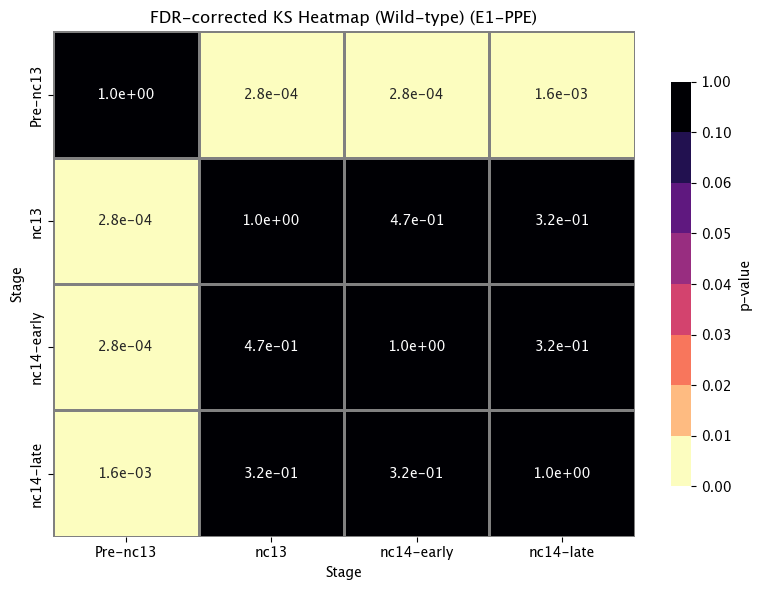

In [18]:
# KS tests for E1-PPE
yw_ks_e1_ppe = perform_ks_tests_full_table(
    dataframes=[YW_E1_PPE_nc12, YW_E1_PPE_nc13, YW_E1_PPE_nc14_early, YW_E1_PPE_nc14_late],
    labels=STAGE_LABELS,
    distance_column="E1-PPE distance (um)"
)
print("\n=== E1-PPE KS Test Results ===")
display(yw_ks_e1_ppe)

# Generate heatmap
generate_pvalue_heatmap_strict_individual_side(
    results_df=yw_ks_e1_ppe,
    stages_labels=STAGE_LABELS,
    distance_column="E1-PPE",
    title="FDR-corrected KS Heatmap (Wild-type)"
)


=== E2-PPE KS Test Results ===


,Comparison,KS_Statistic,Raw_P_Value,FDR_Corrected_P,Significant
0,Pre-nc13 vs nc13,0.232340,3.924715e-05,8.315617e-05,True
1,Pre-nc13 vs nc14-early,0.280712,1.600646e-07,9.603877e-07,True
2,Pre-nc13 vs nc14-late,0.218744,4.157808e-05,8.315617e-05,True
3,nc13 vs nc14-early,0.101597,8.699602e-02,1.304940e-01,False
4,nc13 vs nc14-late,0.086391,1.520078e-01,1.824093e-01,False
5,nc14-early vs nc14-late,0.070681,3.201691e-01,3.201691e-01,False


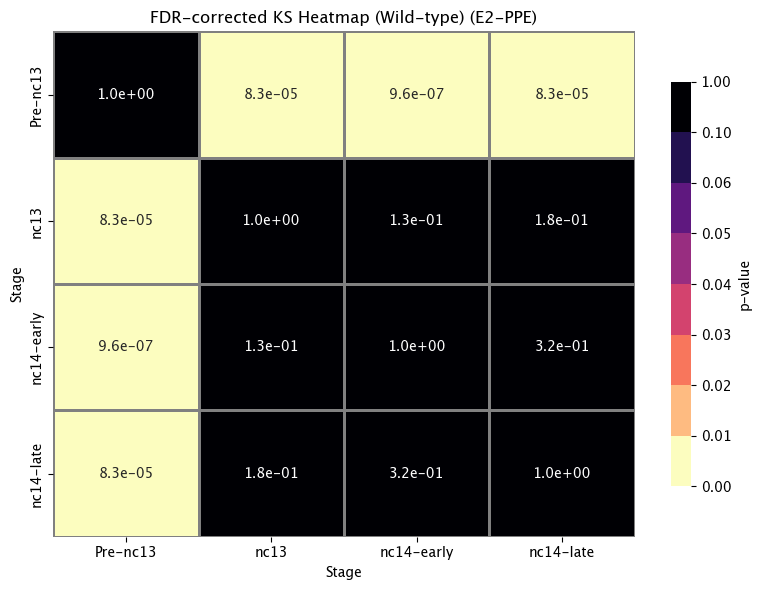

In [19]:
# KS tests for E2-PPE
yw_ks_e2_ppe = perform_ks_tests_full_table(
    dataframes=[YW_E2_PPE_nc12, YW_E2_PPE_nc13, YW_E2_PPE_nc14_early, YW_E2_PPE_nc14_late],
    labels=STAGE_LABELS,
    distance_column="E2-PPE distance (um)"
)
print("\n=== E2-PPE KS Test Results ===")
display(yw_ks_e2_ppe)

generate_pvalue_heatmap_strict_individual_side(
    results_df=yw_ks_e2_ppe,
    stages_labels=STAGE_LABELS,
    distance_column="E2-PPE",
    title="FDR-corrected KS Heatmap (Wild-type)"
)


=== E1-E2 KS Test Results ===


,Comparison,KS_Statistic,Raw_P_Value,FDR_Corrected_P,Significant
0,Pre-nc13 vs nc13,0.125964,0.092870,0.139305,False
1,Pre-nc13 vs nc14-early,0.206055,0.000564,0.003385,True
2,Pre-nc13 vs nc14-late,0.081393,0.456040,0.547248,False
3,nc13 vs nc14-early,0.113994,0.048780,0.097561,False
4,nc13 vs nc14-late,0.055613,0.652588,0.652588,False
5,nc14-early vs nc14-late,0.135896,0.003521,0.010564,True


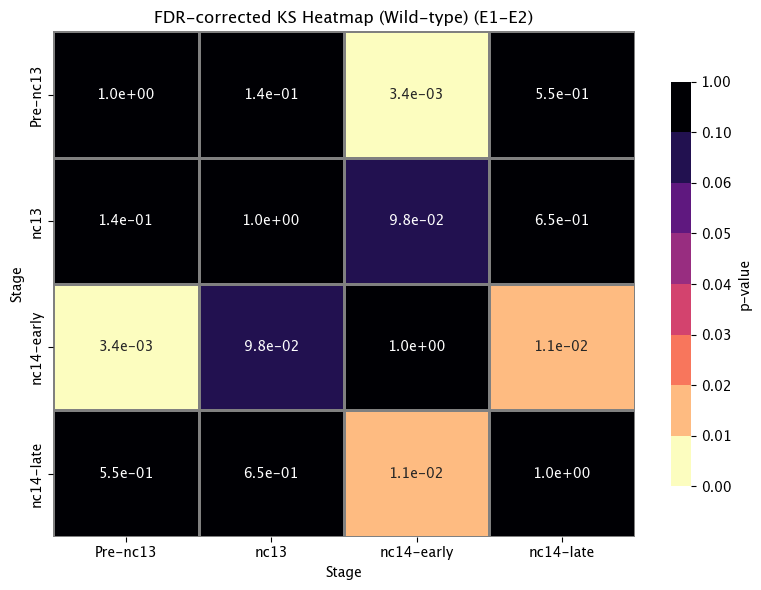

In [20]:
# KS tests for E1-E2
yw_ks_e1_e2 = perform_ks_tests_full_table(
    dataframes=[YW_E1_E2_nc12, YW_E1_E2_nc13, YW_E1_E2_nc14_early, YW_E1_E2_nc14_late],
    labels=STAGE_LABELS,
    distance_column="E1-E2 distance (um)"
)
print("\n=== E1-E2 KS Test Results ===")
display(yw_ks_e1_e2)

generate_pvalue_heatmap_strict_individual_side(
    results_df=yw_ks_e1_e2,
    stages_labels=STAGE_LABELS,
    distance_column="E1-E2",
    title="FDR-corrected KS Heatmap (Wild-type)"
)

---

# Section IV: Figure 4 - Δ800PPE Mutant Time-Course Analysis

**Corresponds to Figure 4A in the paper.**

This section analyzes how the Δ800PPE mutant distance distributions change over time.

### Key Finding (Figure 4)
> The Δ800PPE mutant shows **delayed chromatin dynamics** compared to wild-type.
> The compaction observed in WT at nc13 is not seen until nc14-early or nc14-late in the mutant.


## 4.0 Δ800PPE PDFs Over Time

Generate probability density functions for all three distance types in the Δ800PPE mutant.


In [21]:
# Δ800PPE E1-PPE PDFs
print("\n=== Δ800PPE E1-PPE Distance Analysis ===")
ppe_pdf_peaks_e1_ppe, ppe_kde_results_e1_ppe = generate_plots(
    dataframes=[PPE_E1_PPE_nc12, PPE_E1_PPE_nc13, PPE_E1_PPE_nc14_early, PPE_E1_PPE_nc14_late],
    distance_column="E1-PPE distance (um)",
    phenotype_label="Δ800PPE",
    x_axis_label="E1-PPE (μm)"
)


=== Δ800PPE E1-PPE Distance Analysis ===


In [22]:
# Δ800PPE E2-PPE PDFs
print("\n=== Δ800PPE E2-PPE Distance Analysis ===")
ppe_pdf_peaks_e2_ppe, ppe_kde_results_e2_ppe = generate_plots(
    dataframes=[PPE_E2_PPE_nc12, PPE_E2_PPE_nc13, PPE_E2_PPE_nc14_early, PPE_E2_PPE_nc14_late],
    distance_column="E2-PPE distance (um)",
    phenotype_label="Δ800PPE",
    x_axis_label="E2-PPE (μm)"
)


=== Δ800PPE E2-PPE Distance Analysis ===


In [23]:
# Δ800PPE E1-E2 PDFs
print("\n=== Δ800PPE E1-E2 Distance Analysis ===")
ppe_pdf_peaks_e1_e2, ppe_kde_results_e1_e2 = generate_plots(
    dataframes=[PPE_E1_E2_nc12, PPE_E1_E2_nc13, PPE_E1_E2_nc14_early, PPE_E1_E2_nc14_late],
    distance_column="E1-E2 distance (um)",
    phenotype_label="Δ800PPE",
    x_axis_label="E1-E2 (μm)"
)


=== Δ800PPE E1-E2 Distance Analysis ===


## 4.1 Δ800PPE KS Tests with FDR Correction

Perform pairwise Kolmogorov-Smirnov tests between developmental stages.



=== Δ800PPE E1-PPE KS Test Results ===


,Comparison,KS_Statistic,Raw_P_Value,FDR_Corrected_P,Significant
0,Pre-nc13 vs nc13,0.073124,0.296805,0.296805,False
1,Pre-nc13 vs nc14-early,0.169702,0.000265,0.000795,True
2,Pre-nc13 vs nc14-late,0.156820,0.000537,0.001074,True
3,nc13 vs nc14-early,0.127880,0.001316,0.001974,True
4,nc13 vs nc14-late,0.168895,0.000001,0.000008,True
5,nc14-early vs nc14-late,0.082701,0.109815,0.131778,False


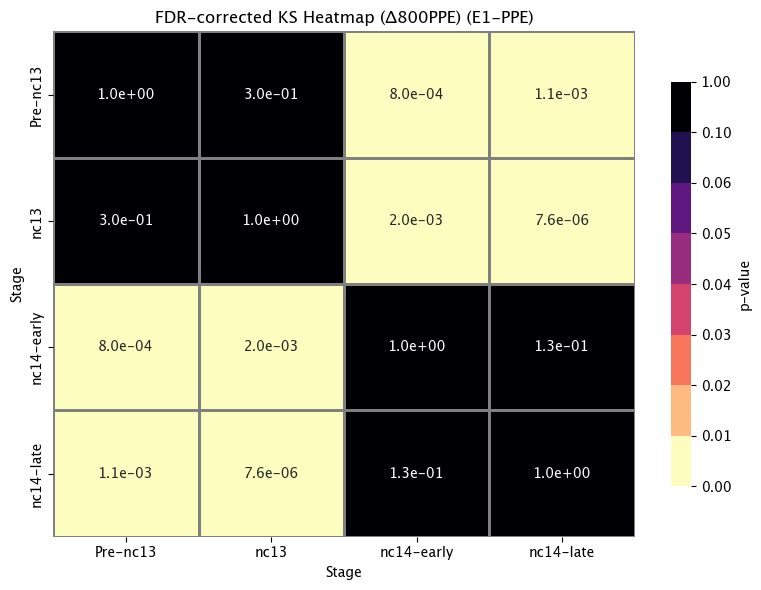

In [24]:
# KS tests for Δ800PPE E1-PPE
ppe_ks_e1_ppe = perform_ks_tests_full_table(
    dataframes=[PPE_E1_PPE_nc12, PPE_E1_PPE_nc13, PPE_E1_PPE_nc14_early, PPE_E1_PPE_nc14_late],
    labels=STAGE_LABELS,
    distance_column="E1-PPE distance (um)"
)
print("\n=== Δ800PPE E1-PPE KS Test Results ===")
display(ppe_ks_e1_ppe)

generate_pvalue_heatmap_strict_individual_side(
    results_df=ppe_ks_e1_ppe,
    stages_labels=STAGE_LABELS,
    distance_column="E1-PPE",
    title="FDR-corrected KS Heatmap (Δ800PPE)"
)


=== Δ800PPE E2-PPE KS Test Results ===


,Comparison,KS_Statistic,Raw_P_Value,FDR_Corrected_P,Significant
0,Pre-nc13 vs nc13,0.081737,0.565492,0.678590,False
1,Pre-nc13 vs nc14-early,0.191272,0.007574,0.022721,True
2,Pre-nc13 vs nc14-late,0.162216,0.024549,0.036824,True
3,nc13 vs nc14-early,0.163330,0.005654,0.022721,True
4,nc13 vs nc14-late,0.137113,0.017317,0.034634,True
5,nc14-early vs nc14-late,0.063532,0.796558,0.796558,False


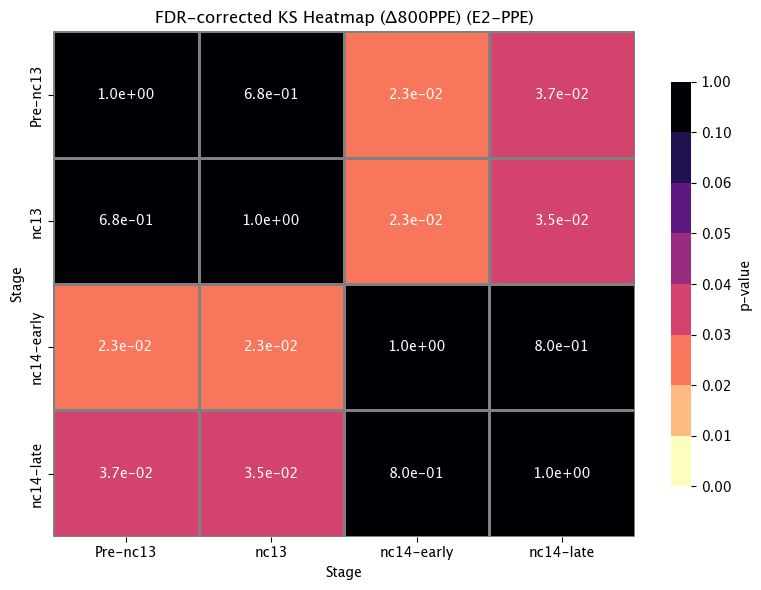

In [25]:
# KS tests for Δ800PPE E2-PPE
ppe_ks_e2_ppe = perform_ks_tests_full_table(
    dataframes=[PPE_E2_PPE_nc12, PPE_E2_PPE_nc13, PPE_E2_PPE_nc14_early, PPE_E2_PPE_nc14_late],
    labels=STAGE_LABELS,
    distance_column="E2-PPE distance (um)"
)
print("\n=== Δ800PPE E2-PPE KS Test Results ===")
display(ppe_ks_e2_ppe)

generate_pvalue_heatmap_strict_individual_side(
    results_df=ppe_ks_e2_ppe,
    stages_labels=STAGE_LABELS,
    distance_column="E2-PPE",
    title="FDR-corrected KS Heatmap (Δ800PPE)"
)


=== Δ800PPE E1-E2 KS Test Results ===


,Comparison,KS_Statistic,Raw_P_Value,FDR_Corrected_P,Significant
0,Pre-nc13 vs nc13,0.129857,0.103784,0.149565,False
1,Pre-nc13 vs nc14-early,0.198486,0.006803,0.020410,True
2,Pre-nc13 vs nc14-late,0.220077,0.001412,0.008473,True
3,nc13 vs nc14-early,0.104585,0.124637,0.149565,False
4,nc13 vs nc14-late,0.125419,0.028259,0.056519,False
5,nc14-early vs nc14-late,0.061348,0.818845,0.818845,False


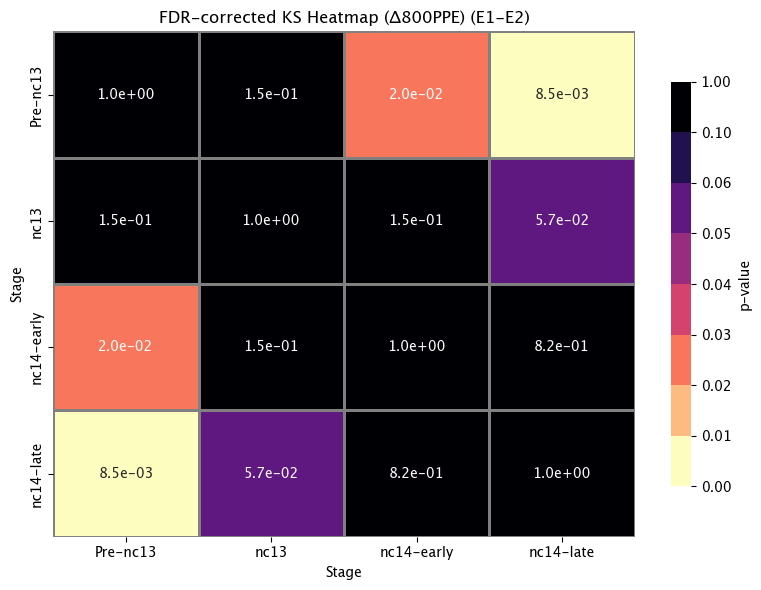

In [26]:
# KS tests for Δ800PPE E1-E2
ppe_ks_e1_e2 = perform_ks_tests_full_table(
    dataframes=[PPE_E1_E2_nc12, PPE_E1_E2_nc13, PPE_E1_E2_nc14_early, PPE_E1_E2_nc14_late],
    labels=STAGE_LABELS,
    distance_column="E1-E2 distance (um)"
)
print("\n=== Δ800PPE E1-E2 KS Test Results ===")
display(ppe_ks_e1_e2)

generate_pvalue_heatmap_strict_individual_side(
    results_df=ppe_ks_e1_e2,
    stages_labels=STAGE_LABELS,
    distance_column="E1-E2",
    title="FDR-corrected KS Heatmap (Δ800PPE)"
)

---

# Section V: Figure 5 - MiMIC Mutant Time-Course Analysis

**Corresponds to Figure 5A in the paper.**

This section analyzes the MiMIC mutant distance distributions over developmental time.

### Key Finding (Figure 5)
> The MiMIC insertion also delays chromatin compaction, though the phenotype
> differs subtly from Δ800PPE, suggesting distinct mechanisms of disruption.


## 5.0 MiMIC PDFs Over Time

Generate probability density functions for all three distance types in the MiMIC mutant.


In [27]:
# MiMIC E1-PPE PDFs
print("\n=== MiMIC E1-PPE Distance Analysis ===")
mimic_pdf_peaks_e1_ppe, mimic_kde_results_e1_ppe = generate_plots(
    dataframes=[MiMIC_E1_PPE_nc12, MiMIC_E1_PPE_nc13, MiMIC_E1_PPE_nc14_early, MiMIC_E1_PPE_nc14_late],
    distance_column="E1-PPE distance (um)",
    phenotype_label="MiMIC",
    x_axis_label="E1-PPE (μm)"
)


=== MiMIC E1-PPE Distance Analysis ===


In [28]:
# MiMIC E2-PPE PDFs
print("\n=== MiMIC E2-PPE Distance Analysis ===")
mimic_pdf_peaks_e2_ppe, mimic_kde_results_e2_ppe = generate_plots(
    dataframes=[MiMIC_E2_PPE_nc12, MiMIC_E2_PPE_nc13, MiMIC_E2_PPE_nc14_early, MiMIC_E2_PPE_nc14_late],
    distance_column="E2-PPE distance (um)",
    phenotype_label="MiMIC",
    x_axis_label="E2-PPE (μm)"
)


=== MiMIC E2-PPE Distance Analysis ===


In [29]:
# MiMIC E1-E2 PDFs
print("\n=== MiMIC E1-E2 Distance Analysis ===")
mimic_pdf_peaks_e1_e2, mimic_kde_results_e1_e2 = generate_plots(
    dataframes=[MiMIC_E1_E2_nc12, MiMIC_E1_E2_nc13, MiMIC_E1_E2_nc14_early, MiMIC_E1_E2_nc14_late],
    distance_column="E1-E2 distance (um)",
    phenotype_label="MiMIC",
    x_axis_label="E1-E2 (μm)"
)


=== MiMIC E1-E2 Distance Analysis ===


## 5.1 MiMIC KS Tests with FDR Correction

Perform pairwise Kolmogorov-Smirnov tests between developmental stages.



=== MiMIC E1-PPE KS Test Results ===


,Comparison,KS_Statistic,Raw_P_Value,FDR_Corrected_P,Significant
0,Pre-nc13 vs nc13,0.057321,0.449121,0.449121,False
1,Pre-nc13 vs nc14-early,0.140105,0.000642,0.001283,True
2,Pre-nc13 vs nc14-late,0.143509,0.000010,0.000057,True
3,nc13 vs nc14-early,0.118116,0.003664,0.005496,True
4,nc13 vs nc14-late,0.115285,0.000212,0.000637,True
5,nc14-early vs nc14-late,0.073625,0.072139,0.086567,False


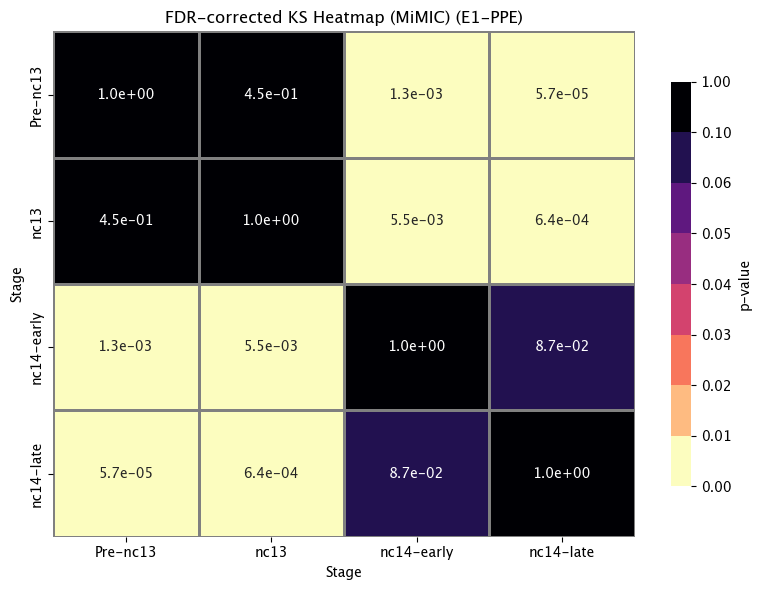

In [30]:
# KS tests for MiMIC E1-PPE
mimic_ks_e1_ppe = perform_ks_tests_full_table(
    dataframes=[MiMIC_E1_PPE_nc12, MiMIC_E1_PPE_nc13, MiMIC_E1_PPE_nc14_early, MiMIC_E1_PPE_nc14_late],
    labels=STAGE_LABELS,
    distance_column="E1-PPE distance (um)"
)
print("\n=== MiMIC E1-PPE KS Test Results ===")
display(mimic_ks_e1_ppe)

generate_pvalue_heatmap_strict_individual_side(
    results_df=mimic_ks_e1_ppe,
    stages_labels=STAGE_LABELS,
    distance_column="E1-PPE",
    title="FDR-corrected KS Heatmap (MiMIC)"
)


=== MiMIC E2-PPE KS Test Results ===


,Comparison,KS_Statistic,Raw_P_Value,FDR_Corrected_P,Significant
0,Pre-nc13 vs nc13,0.197032,0.008789,0.026366,True
1,Pre-nc13 vs nc14-early,0.246441,0.003365,0.020188,True
2,Pre-nc13 vs nc14-late,0.185071,0.018352,0.036704,True
3,nc13 vs nc14-early,0.106043,0.366492,0.366492,False
4,nc13 vs nc14-late,0.118597,0.086981,0.104377,False
5,nc14-early vs nc14-late,0.159982,0.048736,0.073105,False


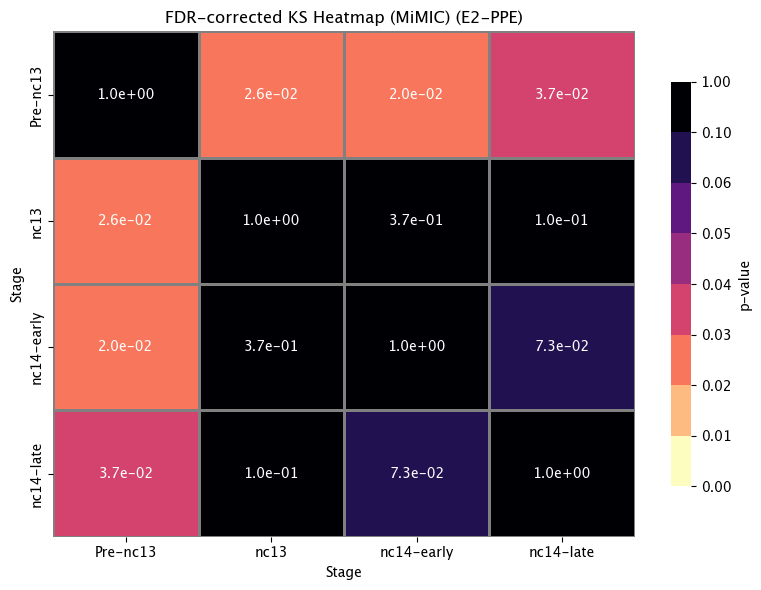


=== MiMIC E1-E2 KS Test Results ===


,Comparison,KS_Statistic,Raw_P_Value,FDR_Corrected_P,Significant
0,Pre-nc13 vs nc13,0.114746,0.457901,0.457901,False
1,Pre-nc13 vs nc14-early,0.209783,0.035295,0.211770,False
2,Pre-nc13 vs nc14-late,0.140849,0.233574,0.375376,False
3,nc13 vs nc14-early,0.120388,0.200821,0.375376,False
4,nc13 vs nc14-late,0.093404,0.312813,0.375376,False
5,nc14-early vs nc14-late,0.112102,0.276789,0.375376,False


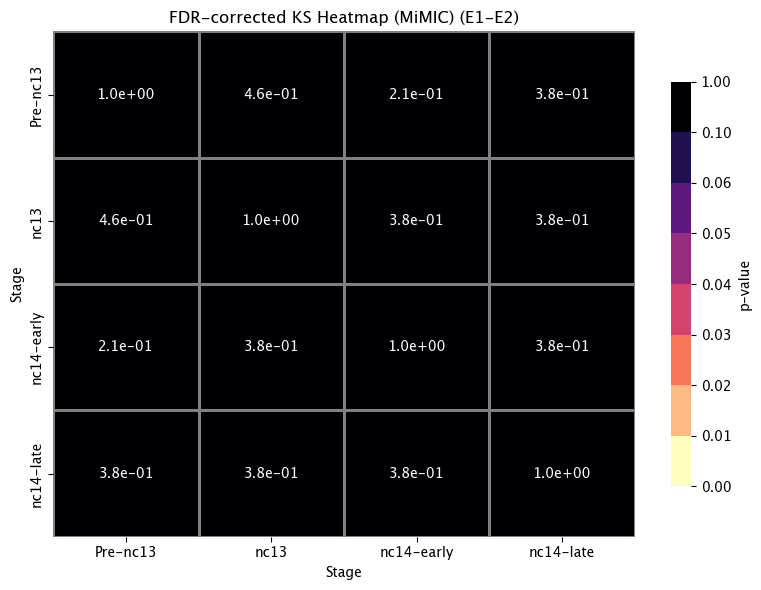

In [31]:
# KS tests for MiMIC E2-PPE
mimic_ks_e2_ppe = perform_ks_tests_full_table(
    dataframes=[MiMIC_E2_PPE_nc12, MiMIC_E2_PPE_nc13, MiMIC_E2_PPE_nc14_early, MiMIC_E2_PPE_nc14_late],
    labels=STAGE_LABELS,
    distance_column="E2-PPE distance (um)"
)
print("\n=== MiMIC E2-PPE KS Test Results ===")
display(mimic_ks_e2_ppe)

generate_pvalue_heatmap_strict_individual_side(
    results_df=mimic_ks_e2_ppe,
    stages_labels=STAGE_LABELS,
    distance_column="E2-PPE",
    title="FDR-corrected KS Heatmap (MiMIC)"
)

# KS tests for MiMIC E1-E2
mimic_ks_e1_e2 = perform_ks_tests_full_table(
    dataframes=[MiMIC_E1_E2_nc12, MiMIC_E1_E2_nc13, MiMIC_E1_E2_nc14_early, MiMIC_E1_E2_nc14_late],
    labels=STAGE_LABELS,
    distance_column="E1-E2 distance (um)"
)
print("\n=== MiMIC E1-E2 KS Test Results ===")
display(mimic_ks_e1_e2)

generate_pvalue_heatmap_strict_individual_side(
    results_df=mimic_ks_e1_e2,
    stages_labels=STAGE_LABELS,
    distance_column="E1-E2",
    title="FDR-corrected KS Heatmap (MiMIC)"
)

---

# Section VI: Figure 6 - Direct Genotype Comparisons

**Corresponds to Figure 6 in the paper.**

This section compares distance distributions between genotypes at matched developmental stages:
- Wild-type vs Δ800PPE
- Wild-type vs MiMIC
- Δ800PPE vs MiMIC

### Key Finding (Figure 6)
> At nc14-late, both mutants show significantly larger enhancer-promoter distances
> compared to wild-type, consistent with reduced chromatin compaction.


## 6.1 Wild-type vs Δ800PPE Stage-Matched Comparisons

Single-row heatmaps comparing WT and Δ800PPE at each developmental stage.


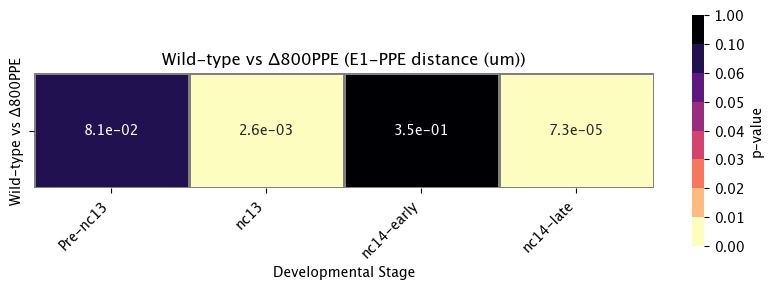

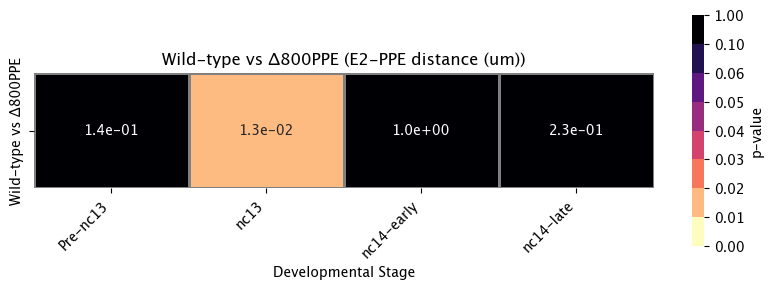

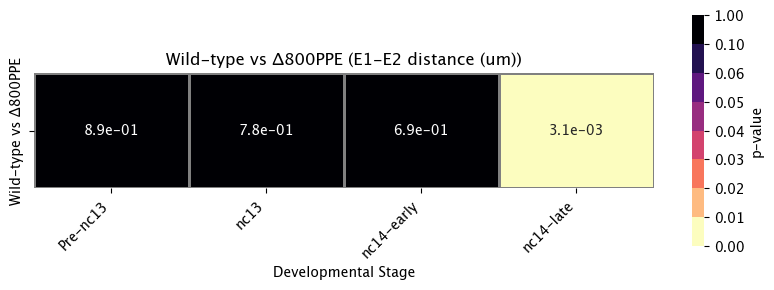

In [32]:
# E1-PPE comparison
plot_single_row_pvalue_heatmap(
    dataframes_1=[YW_E1_PPE_nc12, YW_E1_PPE_nc13, YW_E1_PPE_nc14_early, YW_E1_PPE_nc14_late],
    dataframes_2=[PPE_E1_PPE_nc12, PPE_E1_PPE_nc13, PPE_E1_PPE_nc14_early, PPE_E1_PPE_nc14_late],
    stages_labels=STAGE_LABELS,
    distance_column="E1-PPE distance (um)",
    title="Wild-type vs Δ800PPE"
)

# E2-PPE comparison
plot_single_row_pvalue_heatmap(
    dataframes_1=[YW_E2_PPE_nc12, YW_E2_PPE_nc13, YW_E2_PPE_nc14_early, YW_E2_PPE_nc14_late],
    dataframes_2=[PPE_E2_PPE_nc12, PPE_E2_PPE_nc13, PPE_E2_PPE_nc14_early, PPE_E2_PPE_nc14_late],
    stages_labels=STAGE_LABELS,
    distance_column="E2-PPE distance (um)",
    title="Wild-type vs Δ800PPE"
)

# E1-E2 comparison
plot_single_row_pvalue_heatmap(
    dataframes_1=[YW_E1_E2_nc12, YW_E1_E2_nc13, YW_E1_E2_nc14_early, YW_E1_E2_nc14_late],
    dataframes_2=[PPE_E1_E2_nc12, PPE_E1_E2_nc13, PPE_E1_E2_nc14_early, PPE_E1_E2_nc14_late],
    stages_labels=STAGE_LABELS,
    distance_column="E1-E2 distance (um)",
    title="Wild-type vs Δ800PPE"
)

## 6.2 Wild-type vs MiMIC Stage-Matched Comparisons

Single-row heatmaps comparing WT and MiMIC at each developmental stage.


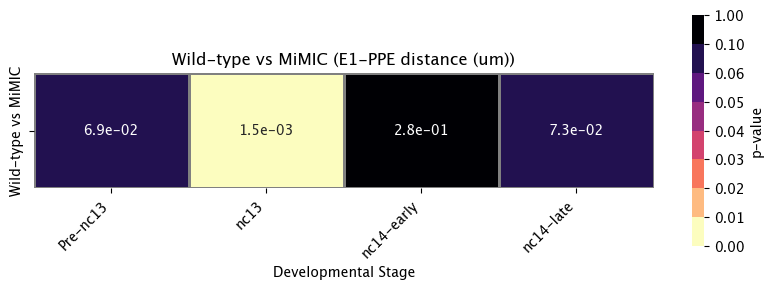

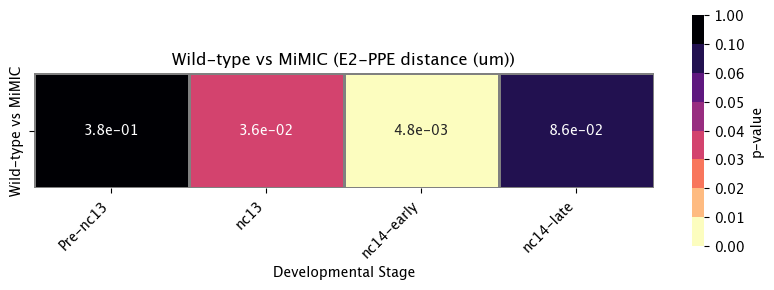

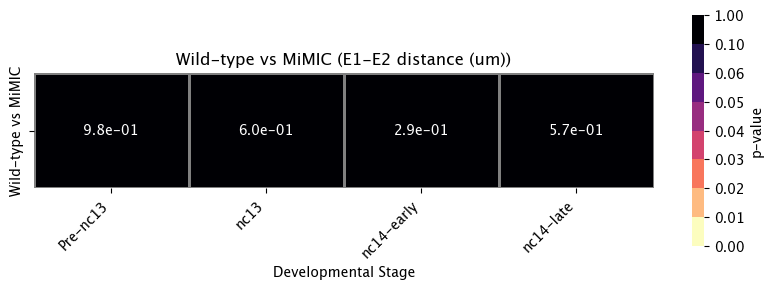

In [33]:
# E1-PPE comparison
plot_single_row_pvalue_heatmap(
    dataframes_1=[YW_E1_PPE_nc12, YW_E1_PPE_nc13, YW_E1_PPE_nc14_early, YW_E1_PPE_nc14_late],
    dataframes_2=[MiMIC_E1_PPE_nc12, MiMIC_E1_PPE_nc13, MiMIC_E1_PPE_nc14_early, MiMIC_E1_PPE_nc14_late],
    stages_labels=STAGE_LABELS,
    distance_column="E1-PPE distance (um)",
    title="Wild-type vs MiMIC"
)

# E2-PPE comparison
plot_single_row_pvalue_heatmap(
    dataframes_1=[YW_E2_PPE_nc12, YW_E2_PPE_nc13, YW_E2_PPE_nc14_early, YW_E2_PPE_nc14_late],
    dataframes_2=[MiMIC_E2_PPE_nc12, MiMIC_E2_PPE_nc13, MiMIC_E2_PPE_nc14_early, MiMIC_E2_PPE_nc14_late],
    stages_labels=STAGE_LABELS,
    distance_column="E2-PPE distance (um)",
    title="Wild-type vs MiMIC"
)

# E1-E2 comparison
plot_single_row_pvalue_heatmap(
    dataframes_1=[YW_E1_E2_nc12, YW_E1_E2_nc13, YW_E1_E2_nc14_early, YW_E1_E2_nc14_late],
    dataframes_2=[MiMIC_E1_E2_nc12, MiMIC_E1_E2_nc13, MiMIC_E1_E2_nc14_early, MiMIC_E1_E2_nc14_late],
    stages_labels=STAGE_LABELS,
    distance_column="E1-E2 distance (um)",
    title="Wild-type vs MiMIC"
)

## 6.3 Δ800PPE vs MiMIC Stage-Matched Comparisons

Single-row heatmaps comparing Δ800PPE and MiMIC at each developmental stage.

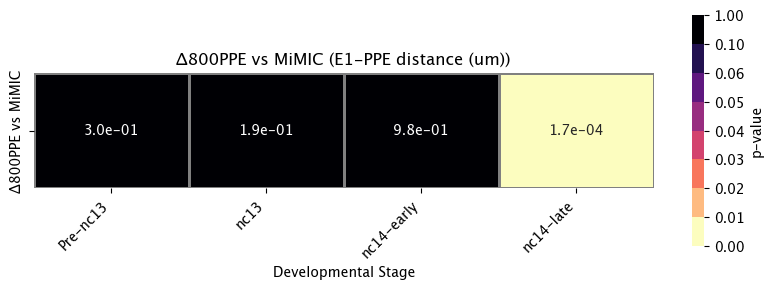

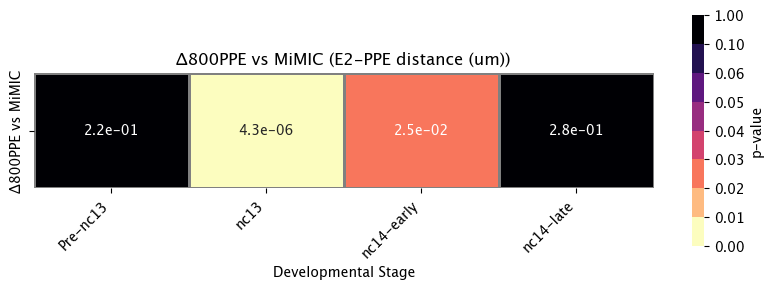

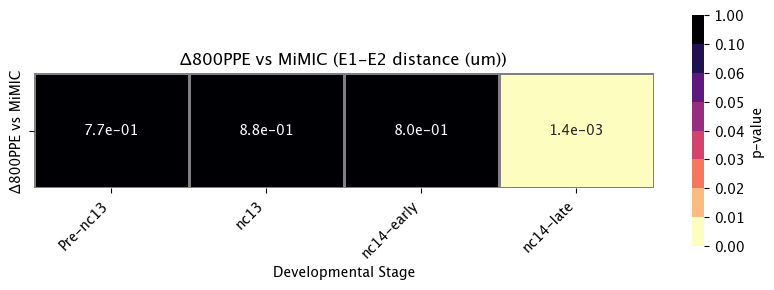

In [34]:
# E1-PPE comparison
plot_single_row_pvalue_heatmap(
    dataframes_1=[PPE_E1_PPE_nc12, PPE_E1_PPE_nc13, PPE_E1_PPE_nc14_early, PPE_E1_PPE_nc14_late],
    dataframes_2=[MiMIC_E1_PPE_nc12, MiMIC_E1_PPE_nc13, MiMIC_E1_PPE_nc14_early, MiMIC_E1_PPE_nc14_late],
    stages_labels=STAGE_LABELS,
    distance_column="E1-PPE distance (um)",
    title="Δ800PPE vs MiMIC"
)

# E2-PPE comparison
plot_single_row_pvalue_heatmap(
    dataframes_1=[PPE_E2_PPE_nc12, PPE_E2_PPE_nc13, PPE_E2_PPE_nc14_early, PPE_E2_PPE_nc14_late],
    dataframes_2=[MiMIC_E2_PPE_nc12, MiMIC_E2_PPE_nc13, MiMIC_E2_PPE_nc14_early, MiMIC_E2_PPE_nc14_late],
    stages_labels=STAGE_LABELS,
    distance_column="E2-PPE distance (um)",
    title="Δ800PPE vs MiMIC"
)

# E1-E2 comparison
plot_single_row_pvalue_heatmap(
    dataframes_1=[PPE_E1_E2_nc12, PPE_E1_E2_nc13, PPE_E1_E2_nc14_early, PPE_E1_E2_nc14_late],
    dataframes_2=[MiMIC_E1_E2_nc12, MiMIC_E1_E2_nc13, MiMIC_E1_E2_nc14_early, MiMIC_E1_E2_nc14_late],
    stages_labels=STAGE_LABELS,
    distance_column="E1-E2 distance (um)",
    title="Δ800PPE vs MiMIC"
)

## 6.4 Pairwise PDF Overlay Comparisons

Direct visual comparison of distance distributions between genotypes at each stage.


In [35]:
# =============================================================================
# WILD-TYPE vs Δ800PPE: Pre-nc13 (All three distances)
# =============================================================================
print("=" * 60)
print("Wild-type vs Δ800PPE: Pre-nc13")
print("=" * 60)

generate_pdf_comparison_mutant(
    sample1_dataframe=YW_E1_PPE_nc12, sample2_dataframe=PPE_E1_PPE_nc12,
    distance_column="E1-PPE distance (um)", title_prefix="Pre-nc13",
    sample1_name="Wild-type", sample1_color="#505050",
    sample2_name="Δ800PPE", sample2_color="#1E90FF"
)

generate_pdf_comparison_mutant(
    sample1_dataframe=YW_E2_PPE_nc12, sample2_dataframe=PPE_E2_PPE_nc12,
    distance_column="E2-PPE distance (um)", title_prefix="Pre-nc13",
    sample1_name="Wild-type", sample1_color="#505050",
    sample2_name="Δ800PPE", sample2_color="#1E90FF"
)

generate_pdf_comparison_mutant(
    sample1_dataframe=YW_E1_E2_nc12, sample2_dataframe=PPE_E1_E2_nc12,
    distance_column="E1-E2 distance (um)", title_prefix="Pre-nc13",
    sample1_name="Wild-type", sample1_color="#505050",
    sample2_name="Δ800PPE", sample2_color="#1E90FF"
)

Wild-type vs Δ800PPE: Pre-nc13
K-S Test (Wild-type vs Δ800PPE): p = 8.0752e-02


K-S Test (Wild-type vs Δ800PPE): p = 1.3562e-01


K-S Test (Wild-type vs Δ800PPE): p = 8.9361e-01


In [36]:
# =============================================================================
# WILD-TYPE vs Δ800PPE: nc13, nc14-early, nc14-late
# =============================================================================

# nc13
print("\n" + "=" * 60)
print("Wild-type vs Δ800PPE: nc13")
print("=" * 60)
for dist_col, df1, df2 in [
    ("E1-PPE distance (um)", YW_E1_PPE_nc13, PPE_E1_PPE_nc13),
    ("E2-PPE distance (um)", YW_E2_PPE_nc13, PPE_E2_PPE_nc13),
    ("E1-E2 distance (um)", YW_E1_E2_nc13, PPE_E1_E2_nc13),
]:
    generate_pdf_comparison_mutant(df1, df2, dist_col, "nc13", "Wild-type", "#505050", "Δ800PPE", "#1E90FF")

# nc14-early
print("\n" + "=" * 60)
print("Wild-type vs Δ800PPE: nc14-early")
print("=" * 60)
for dist_col, df1, df2 in [
    ("E1-PPE distance (um)", YW_E1_PPE_nc14_early, PPE_E1_PPE_nc14_early),
    ("E2-PPE distance (um)", YW_E2_PPE_nc14_early, PPE_E2_PPE_nc14_early),
    ("E1-E2 distance (um)", YW_E1_E2_nc14_early, PPE_E1_E2_nc14_early),
]:
    generate_pdf_comparison_mutant(df1, df2, dist_col, "nc14-early", "Wild-type", "#505050", "Δ800PPE", "#1E90FF")

# nc14-late
print("\n" + "=" * 60)
print("Wild-type vs Δ800PPE: nc14-late")
print("=" * 60)
for dist_col, df1, df2 in [
    ("E1-PPE distance (um)", YW_E1_PPE_nc14_late, PPE_E1_PPE_nc14_late),
    ("E2-PPE distance (um)", YW_E2_PPE_nc14_late, PPE_E2_PPE_nc14_late),
    ("E1-E2 distance (um)", YW_E1_E2_nc14_late, PPE_E1_E2_nc14_late),
]:
    generate_pdf_comparison_mutant(df1, df2, dist_col, "nc14-late", "Wild-type", "#505050", "Δ800PPE", "#1E90FF")


Wild-type vs Δ800PPE: nc13
K-S Test (Wild-type vs Δ800PPE): p = 2.5520e-03


K-S Test (Wild-type vs Δ800PPE): p = 1.3383e-02


K-S Test (Wild-type vs Δ800PPE): p = 7.7782e-01



Wild-type vs Δ800PPE: nc14-early
K-S Test (Wild-type vs Δ800PPE): p = 3.5294e-01


K-S Test (Wild-type vs Δ800PPE): p = 9.9667e-01


K-S Test (Wild-type vs Δ800PPE): p = 6.9111e-01



Wild-type vs Δ800PPE: nc14-late
K-S Test (Wild-type vs Δ800PPE): p = 7.2954e-05


K-S Test (Wild-type vs Δ800PPE): p = 2.2648e-01


K-S Test (Wild-type vs Δ800PPE): p = 3.1082e-03


### Wild-type vs MiMIC

In [37]:
# =============================================================================
# WILD-TYPE vs MiMIC: All stages
# =============================================================================

stages_data_yw_mimic = [
    ("Pre-nc13", 
     [(YW_E1_PPE_nc12, MiMIC_E1_PPE_nc12, "E1-PPE distance (um)"),
      (YW_E2_PPE_nc12, MiMIC_E2_PPE_nc12, "E2-PPE distance (um)"),
      (YW_E1_E2_nc12, MiMIC_E1_E2_nc12, "E1-E2 distance (um)")]),
    ("nc13",
     [(YW_E1_PPE_nc13, MiMIC_E1_PPE_nc13, "E1-PPE distance (um)"),
      (YW_E2_PPE_nc13, MiMIC_E2_PPE_nc13, "E2-PPE distance (um)"),
      (YW_E1_E2_nc13, MiMIC_E1_E2_nc13, "E1-E2 distance (um)")]),
    ("nc14-early",
     [(YW_E1_PPE_nc14_early, MiMIC_E1_PPE_nc14_early, "E1-PPE distance (um)"),
      (YW_E2_PPE_nc14_early, MiMIC_E2_PPE_nc14_early, "E2-PPE distance (um)"),
      (YW_E1_E2_nc14_early, MiMIC_E1_E2_nc14_early, "E1-E2 distance (um)")]),
    ("nc14-late",
     [(YW_E1_PPE_nc14_late, MiMIC_E1_PPE_nc14_late, "E1-PPE distance (um)"),
      (YW_E2_PPE_nc14_late, MiMIC_E2_PPE_nc14_late, "E2-PPE distance (um)"),
      (YW_E1_E2_nc14_late, MiMIC_E1_E2_nc14_late, "E1-E2 distance (um)")]),
]

for stage, comparisons in stages_data_yw_mimic:
    print("\n" + "=" * 60)
    print(f"Wild-type vs MiMIC: {stage}")
    print("=" * 60)
    for df1, df2, dist_col in comparisons:
        generate_pdf_comparison_mutant(df1, df2, dist_col, stage, 
                                       "Wild-type", "#505050", "MiMIC", "#FF6347")


Wild-type vs MiMIC: Pre-nc13
K-S Test (Wild-type vs MiMIC): p = 6.9262e-02


K-S Test (Wild-type vs MiMIC): p = 3.7745e-01


K-S Test (Wild-type vs MiMIC): p = 9.7734e-01



Wild-type vs MiMIC: nc13
K-S Test (Wild-type vs MiMIC): p = 1.4810e-03


K-S Test (Wild-type vs MiMIC): p = 3.6225e-02


K-S Test (Wild-type vs MiMIC): p = 5.9589e-01



Wild-type vs MiMIC: nc14-early
K-S Test (Wild-type vs MiMIC): p = 2.8245e-01


K-S Test (Wild-type vs MiMIC): p = 4.8004e-03


K-S Test (Wild-type vs MiMIC): p = 2.9249e-01



Wild-type vs MiMIC: nc14-late
K-S Test (Wild-type vs MiMIC): p = 7.2629e-02


K-S Test (Wild-type vs MiMIC): p = 8.6069e-02


K-S Test (Wild-type vs MiMIC): p = 5.7473e-01


### Δ800PPE vs MiMIC

In [38]:
# =============================================================================
# Δ800PPE vs MiMIC: All stages
# =============================================================================

stages_data_ppe_mimic = [
    ("Pre-nc13", 
     [(PPE_E1_PPE_nc12, MiMIC_E1_PPE_nc12, "E1-PPE distance (um)"),
      (PPE_E2_PPE_nc12, MiMIC_E2_PPE_nc12, "E2-PPE distance (um)"),
      (PPE_E1_E2_nc12, MiMIC_E1_E2_nc12, "E1-E2 distance (um)")]),
    ("nc13",
     [(PPE_E1_PPE_nc13, MiMIC_E1_PPE_nc13, "E1-PPE distance (um)"),
      (PPE_E2_PPE_nc13, MiMIC_E2_PPE_nc13, "E2-PPE distance (um)"),
      (PPE_E1_E2_nc13, MiMIC_E1_E2_nc13, "E1-E2 distance (um)")]),
    ("nc14-early",
     [(PPE_E1_PPE_nc14_early, MiMIC_E1_PPE_nc14_early, "E1-PPE distance (um)"),
      (PPE_E2_PPE_nc14_early, MiMIC_E2_PPE_nc14_early, "E2-PPE distance (um)"),
      (PPE_E1_E2_nc14_early, MiMIC_E1_E2_nc14_early, "E1-E2 distance (um)")]),
    ("nc14-late",
     [(PPE_E1_PPE_nc14_late, MiMIC_E1_PPE_nc14_late, "E1-PPE distance (um)"),
      (PPE_E2_PPE_nc14_late, MiMIC_E2_PPE_nc14_late, "E2-PPE distance (um)"),
      (PPE_E1_E2_nc14_late, MiMIC_E1_E2_nc14_late, "E1-E2 distance (um)")]),
]

for stage, comparisons in stages_data_ppe_mimic:
    print("\n" + "=" * 60)
    print(f"Δ800PPE vs MiMIC: {stage}")
    print("=" * 60)
    for df1, df2, dist_col in comparisons:
        generate_pdf_comparison_mutant(df1, df2, dist_col, stage, 
                                       "Δ800PPE", "#1E90FF", "MiMIC", "#FF6347")


Δ800PPE vs MiMIC: Pre-nc13
K-S Test (Δ800PPE vs MiMIC): p = 2.9908e-01


K-S Test (Δ800PPE vs MiMIC): p = 2.2340e-01


K-S Test (Δ800PPE vs MiMIC): p = 7.7131e-01



Δ800PPE vs MiMIC: nc13
K-S Test (Δ800PPE vs MiMIC): p = 1.8661e-01


K-S Test (Δ800PPE vs MiMIC): p = 4.3320e-06


K-S Test (Δ800PPE vs MiMIC): p = 8.7951e-01



Δ800PPE vs MiMIC: nc14-early
K-S Test (Δ800PPE vs MiMIC): p = 9.7703e-01


K-S Test (Δ800PPE vs MiMIC): p = 2.4719e-02


K-S Test (Δ800PPE vs MiMIC): p = 7.9508e-01



Δ800PPE vs MiMIC: nc14-late
K-S Test (Δ800PPE vs MiMIC): p = 1.7063e-04


K-S Test (Δ800PPE vs MiMIC): p = 2.8070e-01


K-S Test (Δ800PPE vs MiMIC): p = 1.4171e-03


---

# Section VII: Joint Distribution Contours

**Corresponds to Figures 3C-F, 4B-E, 5B-E in the paper.**

This section generates 2D contour plots showing the joint probability distribution
of enhancer-promoter distances. The contours are constructed by:

1. Computing triangle vertex coordinates from pairwise distances (E1-PPE, E2-PPE, E1-E2)
2. Weighting by the marginal distribution of E1-E2 distance
3. Interpolating onto a regular grid using KDE

**Interpretation (as used in the paper):**  
Contours dominated by purple indicate a broader, lower‑probability landscape (more variable/dynamic configurations), whereas tight, orange‑weighted contours indicate a more concentrated, higher‑probability configuration (more fixed)

## 7.1 Wild-type Contours (Figure 3C-F)

Generate contour plots for each developmental stage showing how chromatin architecture evolves.

# =============================================================================
# WILD-TYPE 3D SURFACE PLOTS
# =============================================================================
# Note: The plot_contour_stage function returns (Z_weighted, X_grid, Y_grid, E1, E2, PPE)
# so we need to compute the grids first.

from mpl_toolkits.mplot3d import Axes3D

# Define grid for 3D plotting (matches contour grid)
xi_3d = np.linspace(-0.8, 2, 100)
yi_3d = np.linspace(0, 1, 75)
X_grid_3d, Y_grid_3d = np.meshgrid(xi_3d, yi_3d)

# Compute surfaces for WT (reusing existing KDE results)
print("Computing Wild-type 3D surfaces...")

# Pre-nc13
Z_yw_3d_nc12, _, _ = compute_weighted_Z(
    yw_kde_results_e2_ppe['Pre-nc13']['x'], yw_kde_results_e1_ppe['Pre-nc13']['x'],
    yw_kde_results_e2_ppe['Pre-nc13']['y'], yw_kde_results_e1_ppe['Pre-nc13']['y'],
    yw_kde_results_e1_e2['Pre-nc13']['x'], yw_kde_results_e1_e2['Pre-nc13']['y'],
    xi_3d, yi_3d
)
plot_3d_pdf_surface(X_grid_3d, Y_grid_3d, Z_yw_3d_nc12, "Wild-type Pre-nc13", vmin=0, vmax=3.5)

# nc13
Z_yw_3d_nc13, _, _ = compute_weighted_Z(
    yw_kde_results_e2_ppe['nc13']['x'], yw_kde_results_e1_ppe['nc13']['x'],
    yw_kde_results_e2_ppe['nc13']['y'], yw_kde_results_e1_ppe['nc13']['y'],
    yw_kde_results_e1_e2['nc13']['x'], yw_kde_results_e1_e2['nc13']['y'],
    xi_3d, yi_3d
)
plot_3d_pdf_surface(X_grid_3d, Y_grid_3d, Z_yw_3d_nc13, "Wild-type nc13", vmin=0, vmax=3.5)

# nc14-early
Z_yw_3d_nc14_early, _, _ = compute_weighted_Z(
    yw_kde_results_e2_ppe['nc14-early']['x'], yw_kde_results_e1_ppe['nc14-early']['x'],
    yw_kde_results_e2_ppe['nc14-early']['y'], yw_kde_results_e1_ppe['nc14-early']['y'],
    yw_kde_results_e1_e2['nc14-early']['x'], yw_kde_results_e1_e2['nc14-early']['y'],
    xi_3d, yi_3d
)
plot_3d_pdf_surface(X_grid_3d, Y_grid_3d, Z_yw_3d_nc14_early, "Wild-type nc14-early", vmin=0, vmax=3.5)

# nc14-late
Z_yw_3d_nc14_late, _, _ = compute_weighted_Z(
    yw_kde_results_e2_ppe['nc14-late']['x'], yw_kde_results_e1_ppe['nc14-late']['x'],
    yw_kde_results_e2_ppe['nc14-late']['y'], yw_kde_results_e1_ppe['nc14-late']['y'],
    yw_kde_results_e1_e2['nc14-late']['x'], yw_kde_results_e1_e2['nc14-late']['y'],
    xi_3d, yi_3d
)
plot_3d_pdf_surface(X_grid_3d, Y_grid_3d, Z_yw_3d_nc14_late, "Wild-type nc14-late", vmin=0, vmax=3.5)

In [39]:
# Note: The contour plotting requires KDE results from generate_plots()
# Make sure Section III has been run first

print("\nGenerating Wild-type contours for each stage...")
print("These correspond to Figure 3C-F in the paper.")


Generating Wild-type contours for each stage...
These correspond to Figure 3C-F in the paper.


Surface integral: 1.0000


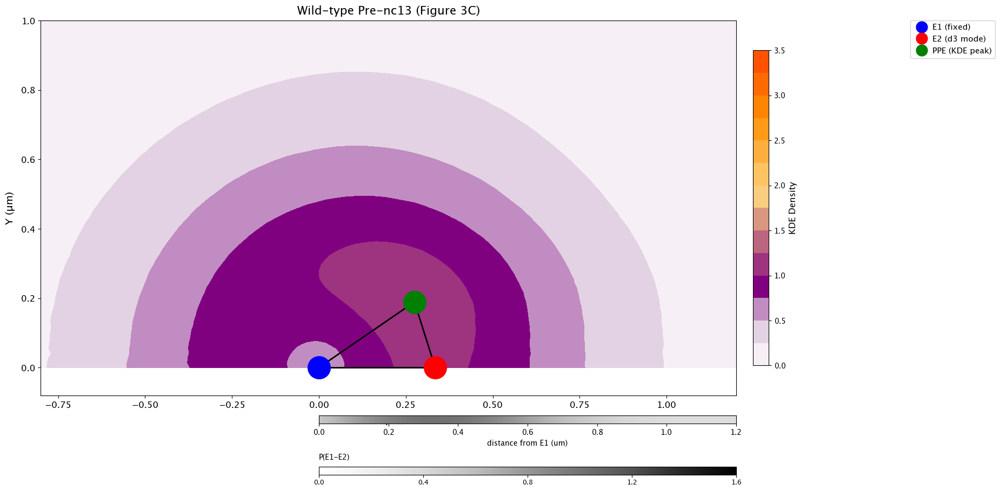

In [40]:
# Pre-nc13 contour (Figure 3C)
# NOTE: Argument order matches original - d1=E2-PPE, d2=E1-PPE
yw_Z_nc12 = plot_contour_stage(
    d1_arr=yw_kde_results_e2_ppe['Pre-nc13']['x'],
    d2_arr=yw_kde_results_e1_ppe['Pre-nc13']['x'],
    p_d1_arr=yw_kde_results_e2_ppe['Pre-nc13']['y'],
    p_d2_arr=yw_kde_results_e1_ppe['Pre-nc13']['y'],
    d3_arr=yw_kde_results_e1_e2['Pre-nc13']['x'],
    p_d3_arr=yw_kde_results_e1_e2['Pre-nc13']['y'],
    title="Wild-type Pre-nc13 (Figure 3C)",
    vmin=0, vmax=3.5
)

Surface integral: 1.0000


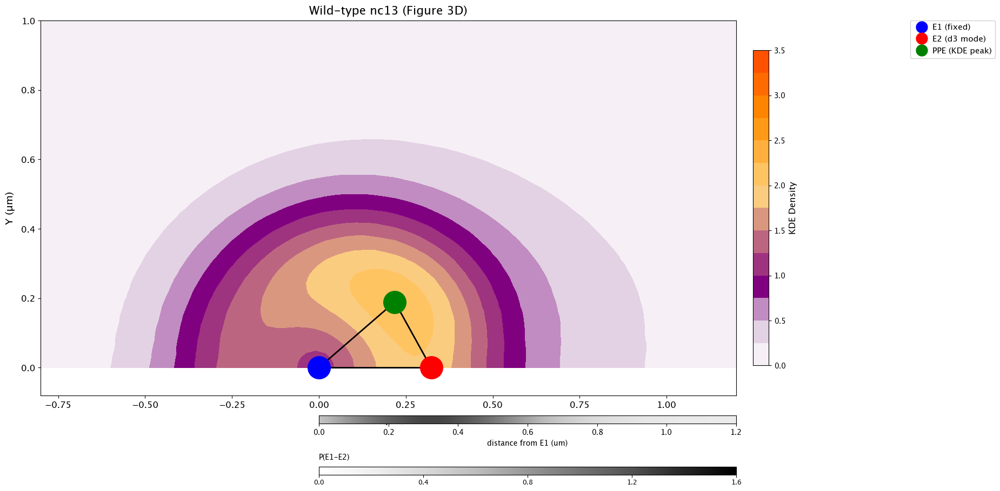

In [41]:
# nc13 contour (Figure 3D)
# NOTE: Argument order matches original - d1=E2-PPE, d2=E1-PPE
yw_Z_nc13 = plot_contour_stage(
    d1_arr=yw_kde_results_e2_ppe['nc13']['x'],
    d2_arr=yw_kde_results_e1_ppe['nc13']['x'],
    p_d1_arr=yw_kde_results_e2_ppe['nc13']['y'],
    p_d2_arr=yw_kde_results_e1_ppe['nc13']['y'],
    d3_arr=yw_kde_results_e1_e2['nc13']['x'],
    p_d3_arr=yw_kde_results_e1_e2['nc13']['y'],
    title="Wild-type nc13 (Figure 3D)",
    vmin=0, vmax=3.5
)

Surface integral: 1.0000


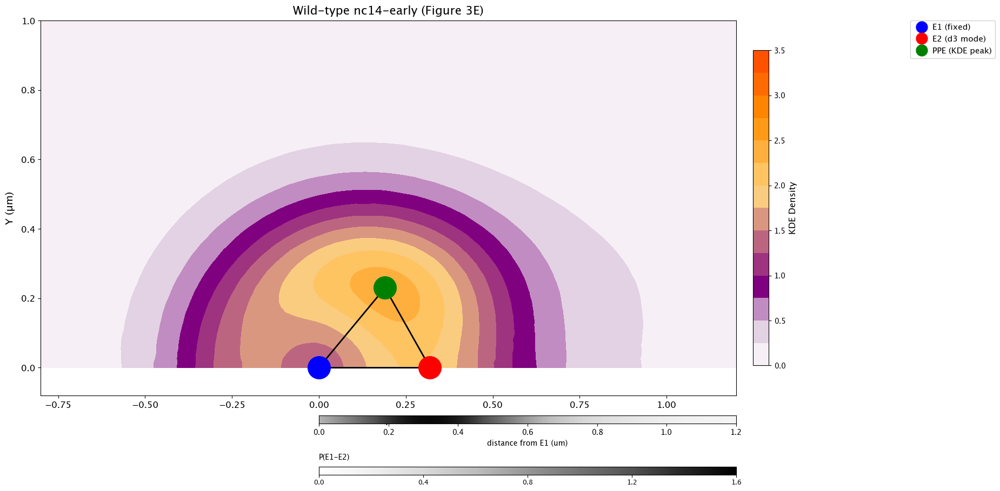

In [42]:
# nc14-early contour (Figure 3E)
# NOTE: Argument order matches original - d1=E2-PPE, d2=E1-PPE
yw_Z_nc14_early = plot_contour_stage(
    d1_arr=yw_kde_results_e2_ppe['nc14-early']['x'],
    d2_arr=yw_kde_results_e1_ppe['nc14-early']['x'],
    p_d1_arr=yw_kde_results_e2_ppe['nc14-early']['y'],
    p_d2_arr=yw_kde_results_e1_ppe['nc14-early']['y'],
    d3_arr=yw_kde_results_e1_e2['nc14-early']['x'],
    p_d3_arr=yw_kde_results_e1_e2['nc14-early']['y'],
    title="Wild-type nc14-early (Figure 3E)",
    vmin=0, vmax=3.5
)

Surface integral: 1.0000


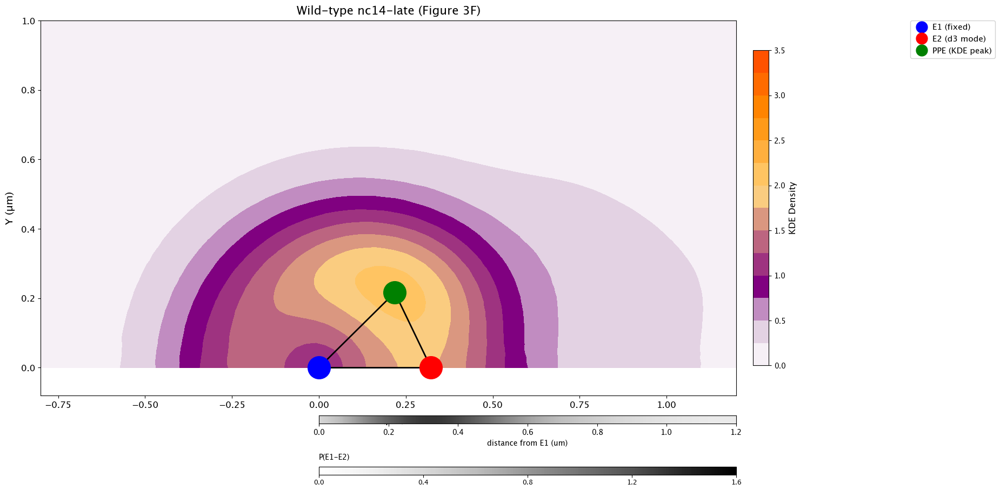

In [43]:
# nc14-late contour (Figure 3F)
# NOTE: Argument order matches original - d1=E2-PPE, d2=E1-PPE
yw_Z_nc14_late = plot_contour_stage(
    d1_arr=yw_kde_results_e2_ppe['nc14-late']['x'],
    d2_arr=yw_kde_results_e1_ppe['nc14-late']['x'],
    p_d1_arr=yw_kde_results_e2_ppe['nc14-late']['y'],
    p_d2_arr=yw_kde_results_e1_ppe['nc14-late']['y'],
    d3_arr=yw_kde_results_e1_e2['nc14-late']['x'],
    p_d3_arr=yw_kde_results_e1_e2['nc14-late']['y'],
    title="Wild-type nc14-late (Figure 3F)",
    vmin=0, vmax=3.5
)

In [44]:
# =============================================================================
# UNPACK WILD-TYPE CONTOUR RESULTS
# =============================================================================
# The plot_contour_stage function returns: (Z_weighted, X_grid, Y_grid, E1, E2, PPE)
# Unpack into individual variables for use in subtraction contours

Z_weighted_pre_nc13_yw, X_grid_pre_nc13_yw, Y_grid_pre_nc13_yw, E1_yw_pre_nc13, E2_yw_pre_nc13, PPE_yw_pre_nc13 = yw_Z_nc12
Z_weighted_nc13_yw, X_grid_nc13_yw, Y_grid_nc13_yw, E1_yw_nc13, E2_yw_nc13, PPE_yw_nc13 = yw_Z_nc13
Z_weighted_nc14_early_yw, X_grid_nc14_early_yw, Y_grid_nc14_early_yw, E1_yw_nc14_early, E2_yw_nc14_early, PPE_yw_nc14_early = yw_Z_nc14_early
Z_weighted_nc14_late_yw, X_grid_nc14_late_yw, Y_grid_nc14_late_yw, E1_yw_nc14_late, E2_yw_nc14_late, PPE_yw_nc14_late = yw_Z_nc14_late

print("✅ Wild-type contour variables unpacked")

✅ Wild-type contour variables unpacked


## 7.2 Δ800PPE Contours (Figure 4B-E)

Generate contour plots for the Δ800PPE mutant at each developmental stage.


Surface integral: 1.0000


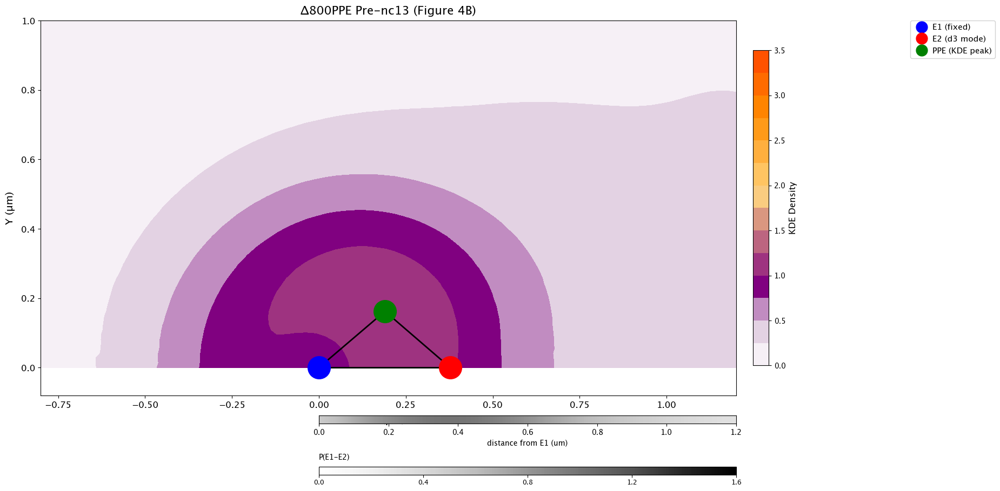

Surface integral: 1.0000


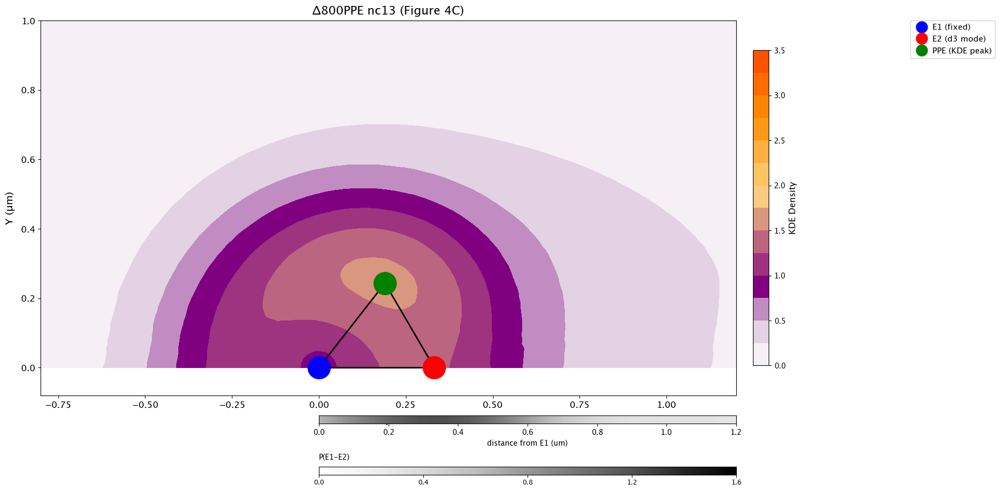

Surface integral: 1.0000


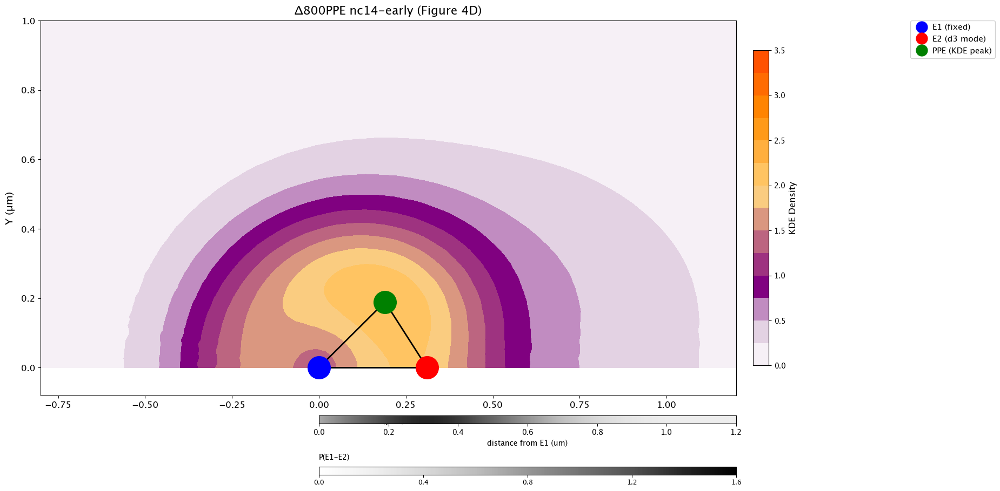

Surface integral: 1.0000


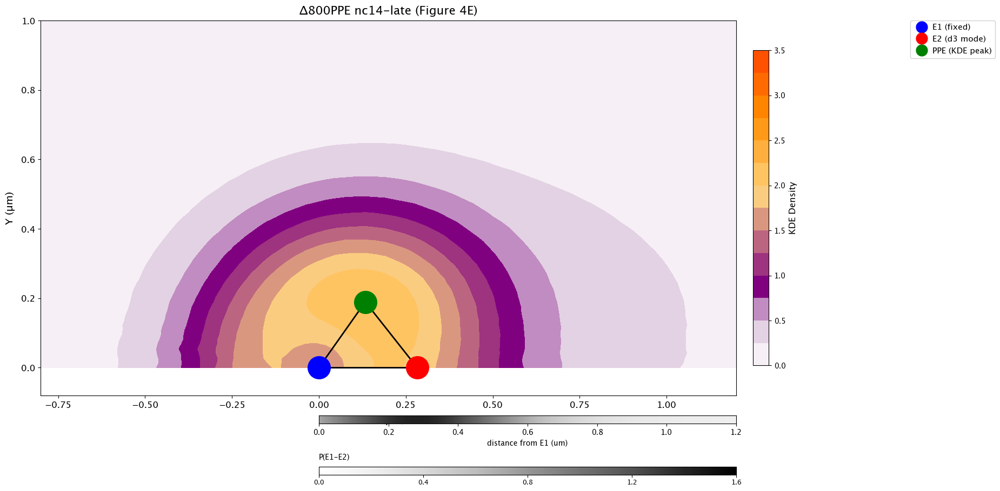

In [45]:
# =============================================================================
# Δ800PPE CONTOURS (Figure 4B-E) - E1 Anchor
# =============================================================================

# PPE Pre-nc13 contour
ppe_Z_nc12 = plot_contour_stage(
    d1_arr=ppe_kde_results_e2_ppe['Pre-nc13']['x'],
    d2_arr=ppe_kde_results_e1_ppe['Pre-nc13']['x'],
    p_d1_arr=ppe_kde_results_e2_ppe['Pre-nc13']['y'],
    p_d2_arr=ppe_kde_results_e1_ppe['Pre-nc13']['y'],
    d3_arr=ppe_kde_results_e1_e2['Pre-nc13']['x'],
    p_d3_arr=ppe_kde_results_e1_e2['Pre-nc13']['y'],
    title="Δ800PPE Pre-nc13 (Figure 4B)",
    vmin=0, vmax=3.5
)

# PPE nc13 contour
ppe_Z_nc13 = plot_contour_stage(
    d1_arr=ppe_kde_results_e2_ppe['nc13']['x'],
    d2_arr=ppe_kde_results_e1_ppe['nc13']['x'],
    p_d1_arr=ppe_kde_results_e2_ppe['nc13']['y'],
    p_d2_arr=ppe_kde_results_e1_ppe['nc13']['y'],
    d3_arr=ppe_kde_results_e1_e2['nc13']['x'],
    p_d3_arr=ppe_kde_results_e1_e2['nc13']['y'],
    title="Δ800PPE nc13 (Figure 4C)",
    vmin=0, vmax=3.5
)

# PPE nc14-early contour
ppe_Z_nc14_early = plot_contour_stage(
    d1_arr=ppe_kde_results_e2_ppe['nc14-early']['x'],
    d2_arr=ppe_kde_results_e1_ppe['nc14-early']['x'],
    p_d1_arr=ppe_kde_results_e2_ppe['nc14-early']['y'],
    p_d2_arr=ppe_kde_results_e1_ppe['nc14-early']['y'],
    d3_arr=ppe_kde_results_e1_e2['nc14-early']['x'],
    p_d3_arr=ppe_kde_results_e1_e2['nc14-early']['y'],
    title="Δ800PPE nc14-early (Figure 4D)",
    vmin=0, vmax=3.5
)

# PPE nc14-late contour
ppe_Z_nc14_late = plot_contour_stage(
    d1_arr=ppe_kde_results_e2_ppe['nc14-late']['x'],
    d2_arr=ppe_kde_results_e1_ppe['nc14-late']['x'],
    p_d1_arr=ppe_kde_results_e2_ppe['nc14-late']['y'],
    p_d2_arr=ppe_kde_results_e1_ppe['nc14-late']['y'],
    d3_arr=ppe_kde_results_e1_e2['nc14-late']['x'],
    p_d3_arr=ppe_kde_results_e1_e2['nc14-late']['y'],
    title="Δ800PPE nc14-late (Figure 4E)",
    vmin=0, vmax=3.5
)

In [46]:
# =============================================================================
# UNPACK Δ800PPE CONTOUR RESULTS
# =============================================================================

Z_weighted_pre_nc13_ppe, X_grid_pre_nc13_ppe, Y_grid_pre_nc13_ppe, E1_ppe_pre_nc13, E2_ppe_pre_nc13, PPE_ppe_pre_nc13 = ppe_Z_nc12
Z_weighted_nc13_ppe, X_grid_nc13_ppe, Y_grid_nc13_ppe, E1_ppe_nc13, E2_ppe_nc13, PPE_ppe_nc13 = ppe_Z_nc13
Z_weighted_nc14_early_ppe, X_grid_nc14_early_ppe, Y_grid_nc14_early_ppe, E1_ppe_nc14_early, E2_ppe_nc14_early, PPE_ppe_nc14_early = ppe_Z_nc14_early
Z_weighted_nc14_late_ppe, X_grid_nc14_late_ppe, Y_grid_nc14_late_ppe, E1_ppe_nc14_late, E2_ppe_nc14_late, PPE_ppe_nc14_late = ppe_Z_nc14_late

print("✅ Δ800PPE contour variables unpacked")

✅ Δ800PPE contour variables unpacked


## 7.3 MiMIC Contours (Figure 5B-E)

Generate contour plots for the MiMIC mutant at each developmental stage.


Surface integral: 1.0000


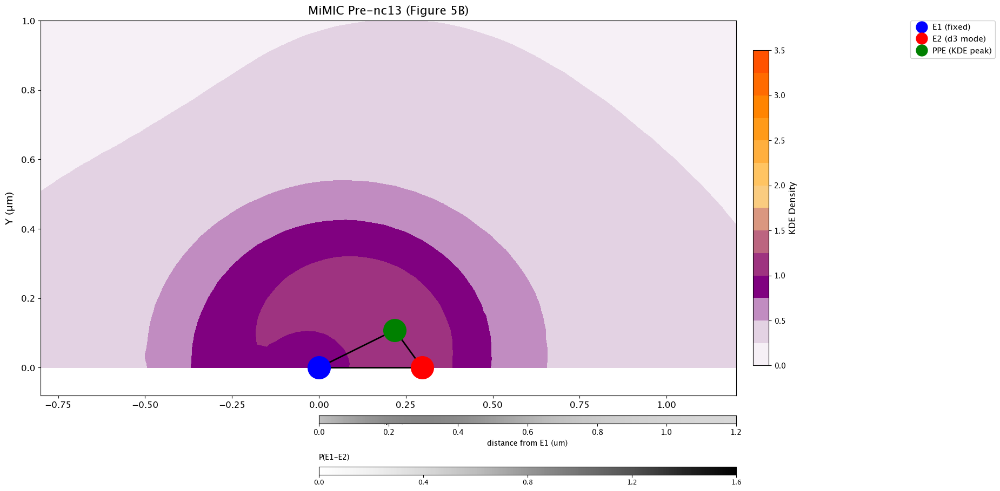

Surface integral: 1.0000


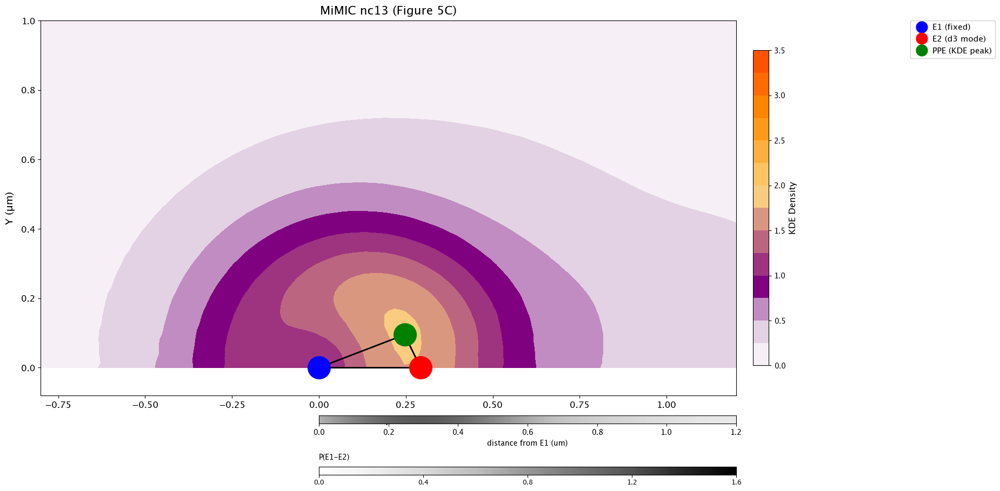

Surface integral: 1.0000


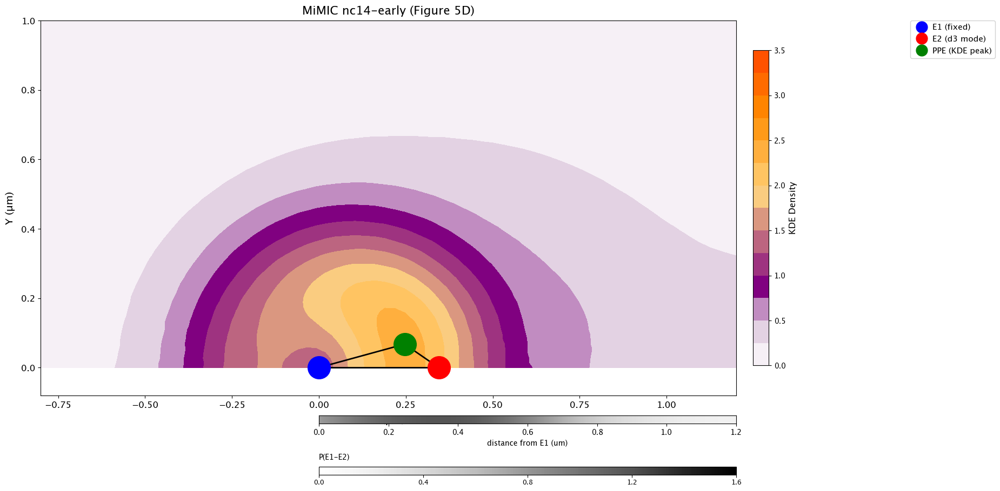

Surface integral: 1.0000


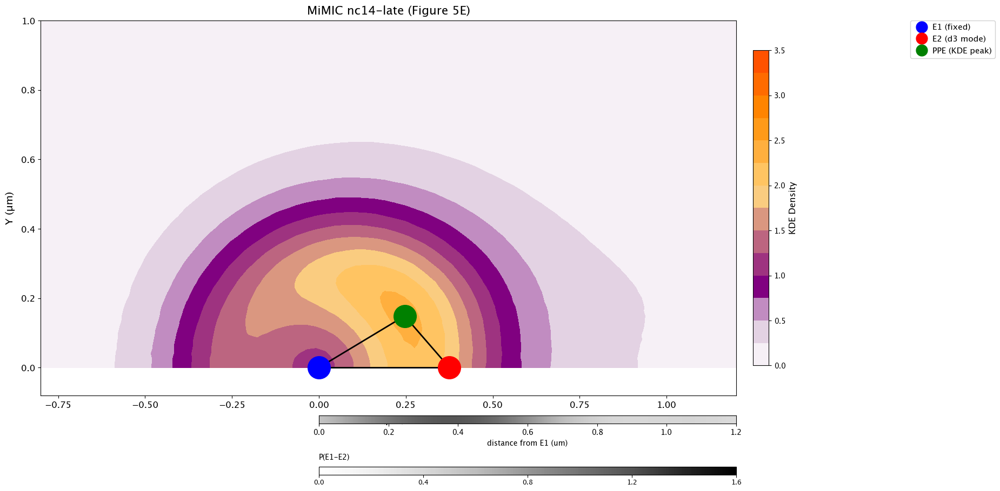

In [47]:
# =============================================================================
# MiMIC CONTOURS (Figure 5B-E) - E1 Anchor
# =============================================================================

# MiMIC Pre-nc13 contour
mimic_Z_nc12 = plot_contour_stage(
    d1_arr=mimic_kde_results_e2_ppe['Pre-nc13']['x'],
    d2_arr=mimic_kde_results_e1_ppe['Pre-nc13']['x'],
    p_d1_arr=mimic_kde_results_e2_ppe['Pre-nc13']['y'],
    p_d2_arr=mimic_kde_results_e1_ppe['Pre-nc13']['y'],
    d3_arr=mimic_kde_results_e1_e2['Pre-nc13']['x'],
    p_d3_arr=mimic_kde_results_e1_e2['Pre-nc13']['y'],
    title="MiMIC Pre-nc13 (Figure 5B)",
    vmin=0, vmax=3.5
)

# MiMIC nc13 contour
mimic_Z_nc13 = plot_contour_stage(
    d1_arr=mimic_kde_results_e2_ppe['nc13']['x'],
    d2_arr=mimic_kde_results_e1_ppe['nc13']['x'],
    p_d1_arr=mimic_kde_results_e2_ppe['nc13']['y'],
    p_d2_arr=mimic_kde_results_e1_ppe['nc13']['y'],
    d3_arr=mimic_kde_results_e1_e2['nc13']['x'],
    p_d3_arr=mimic_kde_results_e1_e2['nc13']['y'],
    title="MiMIC nc13 (Figure 5C)",
    vmin=0, vmax=3.5
)

# MiMIC nc14-early contour
mimic_Z_nc14_early = plot_contour_stage(
    d1_arr=mimic_kde_results_e2_ppe['nc14-early']['x'],
    d2_arr=mimic_kde_results_e1_ppe['nc14-early']['x'],
    p_d1_arr=mimic_kde_results_e2_ppe['nc14-early']['y'],
    p_d2_arr=mimic_kde_results_e1_ppe['nc14-early']['y'],
    d3_arr=mimic_kde_results_e1_e2['nc14-early']['x'],
    p_d3_arr=mimic_kde_results_e1_e2['nc14-early']['y'],
    title="MiMIC nc14-early (Figure 5D)",
    vmin=0, vmax=3.5
)

# MiMIC nc14-late contour
mimic_Z_nc14_late = plot_contour_stage(
    d1_arr=mimic_kde_results_e2_ppe['nc14-late']['x'],
    d2_arr=mimic_kde_results_e1_ppe['nc14-late']['x'],
    p_d1_arr=mimic_kde_results_e2_ppe['nc14-late']['y'],
    p_d2_arr=mimic_kde_results_e1_ppe['nc14-late']['y'],
    d3_arr=mimic_kde_results_e1_e2['nc14-late']['x'],
    p_d3_arr=mimic_kde_results_e1_e2['nc14-late']['y'],
    title="MiMIC nc14-late (Figure 5E)",
    vmin=0, vmax=3.5
)

In [48]:
# =============================================================================
# UNPACK MiMIC CONTOUR RESULTS
# =============================================================================

Z_weighted_pre_nc13_mimic, X_grid_pre_nc13_mimic, Y_grid_pre_nc13_mimic, E1_mimic_pre_nc13, E2_mimic_pre_nc13, PPE_mimic_pre_nc13 = mimic_Z_nc12
Z_weighted_nc13_mimic, X_grid_nc13_mimic, Y_grid_nc13_mimic, E1_mimic_nc13, E2_mimic_nc13, PPE_mimic_nc13 = mimic_Z_nc13
Z_weighted_nc14_early_mimic, X_grid_nc14_early_mimic, Y_grid_nc14_early_mimic, E1_mimic_nc14_early, E2_mimic_nc14_early, PPE_mimic_nc14_early = mimic_Z_nc14_early
Z_weighted_nc14_late_mimic, X_grid_nc14_late_mimic, Y_grid_nc14_late_mimic, E1_mimic_nc14_late, E2_mimic_nc14_late, PPE_mimic_nc14_late = mimic_Z_nc14_late

print("✅ MiMIC contour variables unpacked")
print()
print("All contour data ready for subtraction contours!")

✅ MiMIC contour variables unpacked

All contour data ready for subtraction contours!


In [49]:
def plot_3d_pdf_surface(
    X_grid, Y_grid, Z_weighted, title, vmin=None, vmax=None,
    xlim=(-1.0, 2.0), ylim=(0.0, 1.4), zlim=(0.0, 2.5),
    elev=35, azim=-60
):
    """
    Create a 3D surface plot of the joint probability density.

    Parameters
    ----------
    X_grid, Y_grid : array
        Coordinate grids
    Z_weighted : array
        Probability density surface
    title : str
        Plot title
    vmin, vmax : float
        Color scale bounds
    xlim, ylim, zlim : tuple
        Axis limits
    elev, azim : float
        Viewing angle for the 3D plot
    """
    white_purple_hot_orange = LinearSegmentedColormap.from_list(
        "white_purple_hot_orange",
        [(0.0, "white"), (0.15, "#D8BFD8"), (0.25, "purple"),
         (0.55, "#FFD580"), (0.8, "#FF8C00"), (1.0, "#FF4500")]
    )

    fig = plt.figure(figsize=(12, 10))
    ax = fig.add_subplot(111, projection='3d')

    surf = ax.plot_surface(
        X_grid, Y_grid, Z_weighted,
        cmap=white_purple_hot_orange,
        edgecolor='none', antialiased=True, linewidth=0,
        vmin=vmin, vmax=vmax
    )

    ax.set_xlim(*xlim)
    ax.set_ylim(*ylim)
    ax.set_zlim(*zlim)
    ax.view_init(elev=elev, azim=azim)

    fig.colorbar(surf, shrink=0.5, aspect=10, label='Probability Density')
    ax.set_xlabel('X (relative E1-E2 axis)', fontsize=12, labelpad=10)
    ax.set_ylabel('Y (orthogonal to E1-E2)', fontsize=12, labelpad=10)
    ax.set_zlabel('Probability Density', fontsize=12, labelpad=10)
    ax.set_title(title, fontsize=14, fontweight='bold', pad=20)
    plt.tight_layout()
    plt.show()

Wild-type 3D Surface: Pre-nc13


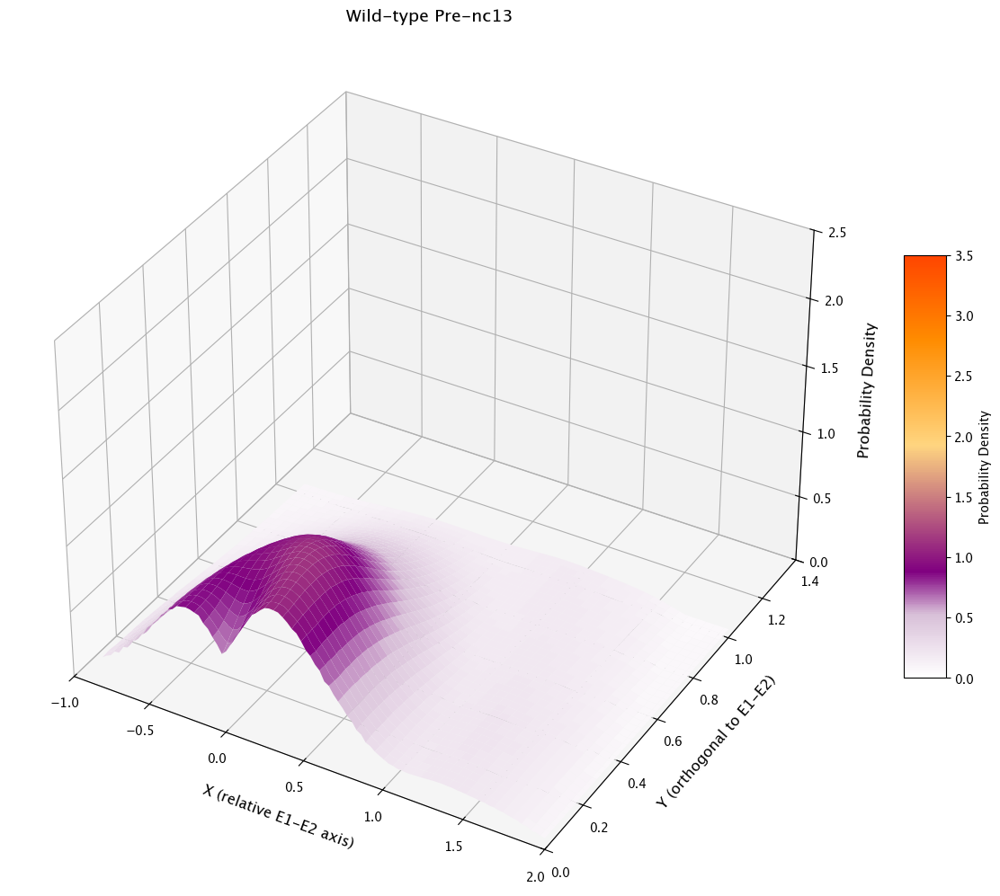

Wild-type 3D Surface: nc13


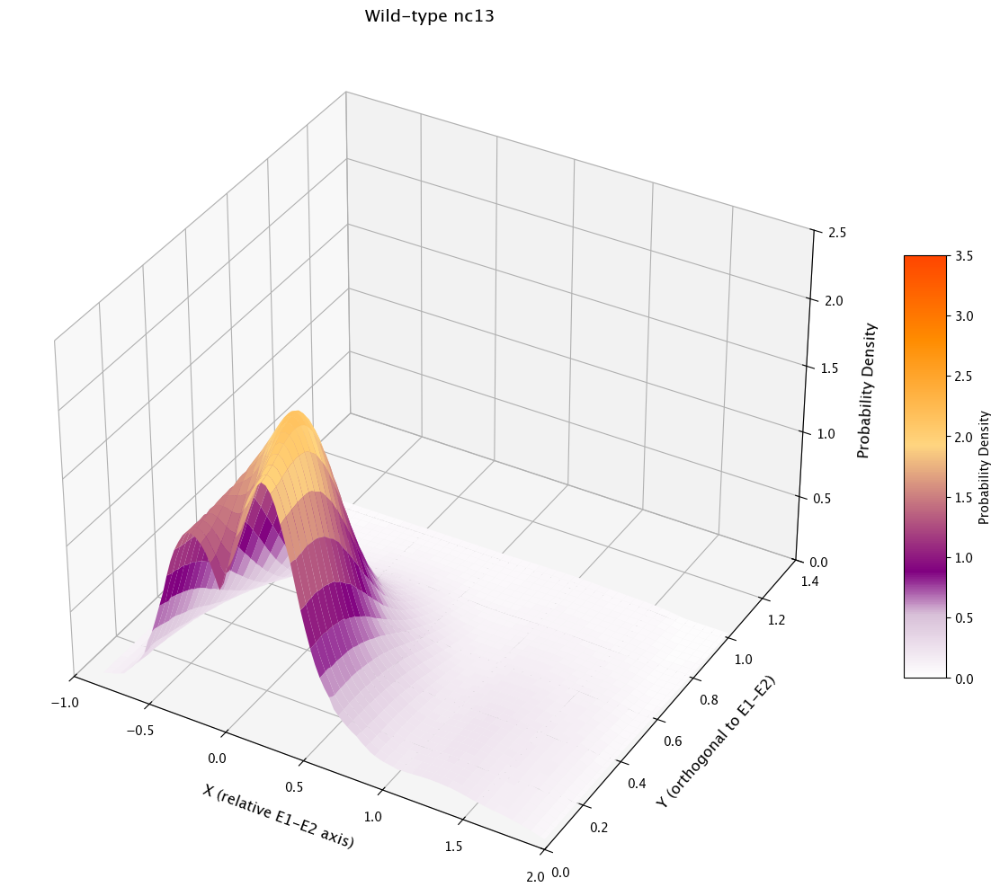

Wild-type 3D Surface: nc14-early


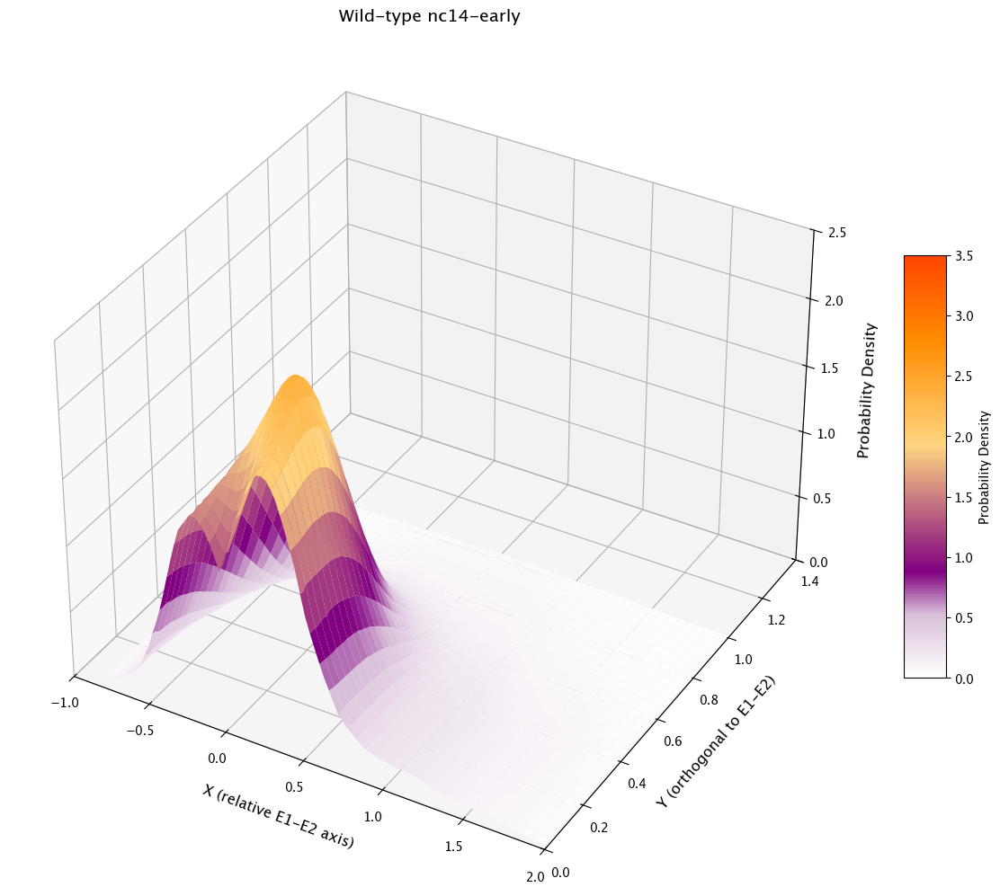

Wild-type 3D Surface: nc14-late


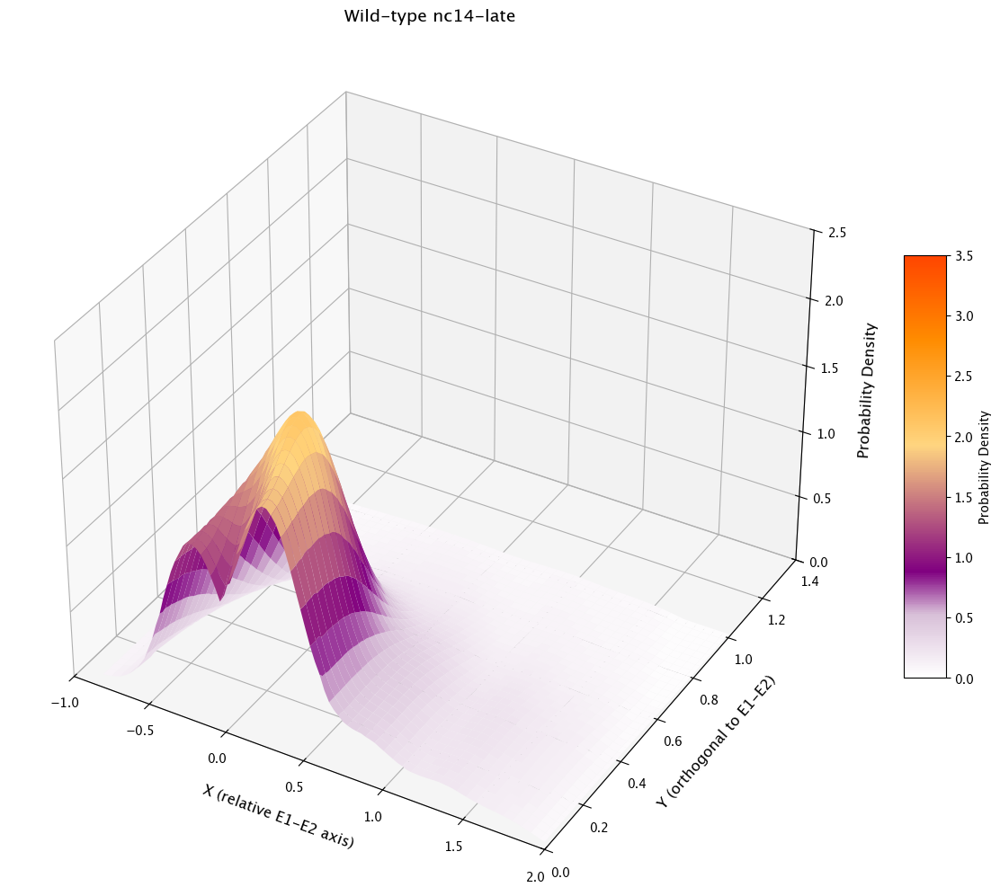

In [50]:
# =============================================================================
# WILD-TYPE 3D SURFACE PLOTS                                                                
# =============================================================================
# Note: These require the contour surfaces from Section VII to be computed first.           
# The plot_contour_stage function returns: (Z_weighted, X_grid, Y_grid, E1, E2, ppe_xy)

from mpl_toolkits.mplot3d import Axes3D

# Pre-nc13
print("Wild-type 3D Surface: Pre-nc13")
plot_3d_pdf_surface(
    X_grid=yw_Z_nc12[1],
    Y_grid=yw_Z_nc12[2],
    Z_weighted=yw_Z_nc12[0],
    title="Wild-type Pre-nc13",
    vmin=0, vmax=3.5,
    xlim=(-1.0, 2.0),
    ylim=(0.0, 1.4),
    zlim=(0.0, 2.5),
    elev=35, azim=-60
)

# nc13
print("Wild-type 3D Surface: nc13")
plot_3d_pdf_surface(
    X_grid=yw_Z_nc13[1],
    Y_grid=yw_Z_nc13[2],
    Z_weighted=yw_Z_nc13[0],
    title="Wild-type nc13",
    vmin=0, vmax=3.5,
    xlim=(-1.0, 2.0),
    ylim=(0.0, 1.4),
    zlim=(0.0, 2.5),
    elev=35, azim=-60
)

# nc14-early
print("Wild-type 3D Surface: nc14-early")
plot_3d_pdf_surface(
    X_grid=yw_Z_nc14_early[1],
    Y_grid=yw_Z_nc14_early[2],
    Z_weighted=yw_Z_nc14_early[0],
    title="Wild-type nc14-early",
    vmin=0, vmax=3.5,
    xlim=(-1.0, 2.0),
    ylim=(0.0, 1.4),
    zlim=(0.0, 2.5),
    elev=35, azim=-60
)

# nc14-late
print("Wild-type 3D Surface: nc14-late")
plot_3d_pdf_surface(
    X_grid=yw_Z_nc14_late[1],
    Y_grid=yw_Z_nc14_late[2],
    Z_weighted=yw_Z_nc14_late[0],
    title="Wild-type nc14-late",
    vmin=0, vmax=3.5,
    xlim=(-1.0, 2.0),
    ylim=(0.0, 1.4),
    zlim=(0.0, 2.5),
    elev=35, azim=-60
)

---

# Section VIII: Anchor PPE Visualization

**Extended Data Figure**

This section provides an alternative visualization where:
- **PPE is anchored at the origin (0, 0)**
- **E2 is placed on the x-axis** at a distance equal to the mode of the E2-PPE distribution
- **E1 position** is computed from the triangle geometry

This "anchor PPE" representation helps visualize how the E1 enhancer position
varies relative to a fixed promoter-E2 axis.


In [51]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

def compute_third_vertex_fixed_E2(E2, d1, d2):
    # E2 is now on the x-axis: E2 = (d3, 0)
    x2, y2 = E2
    a = d1  # E1–E2
    b = d2  # E1–PPE
    c = np.linalg.norm(E2)  # E2–PPE distance (should be d3_mode)

    cos_angle = (b**2 + c**2 - a**2) / (2 * b * c)
    cos_angle = np.clip(cos_angle, -1.0, 1.0)
    angle = np.arccos(cos_angle)

    direction = np.array([1, 0])  # x-axis
    perp = np.array([0, 1])       # perpendicular: y-axis

    E1 = b * (np.cos(angle) * direction + np.sin(angle) * perp)
    return E1

def plot_contour_stage_center_PPE(
    d1_arr, d2_arr, p_d1_arr, p_d2_arr,
    d3_arr, p_d3_arr, title,
    show_legend=True, x_tick_limit=None,
    num_samples=50,
    vmin=None, vmax=None,           # contour scale
    pdf_min=0.0, pdf_max=1.6        # PDF scale (Viridis) for PPE→E2
):
    import numpy as np
    import matplotlib.pyplot as plt
    from matplotlib.colors import LinearSegmentedColormap
    from mpl_toolkits.axes_grid1 import make_axes_locatable
    from mpl_toolkits.axes_grid1.inset_locator import inset_axes

    # ---------- 2D surface over grid ----------
    xi = np.linspace(-0.8, 2.0, 100)
    yi = np.linspace(0.0, 1.5, 100)
    Z_weighted, X_grid, Y_grid = compute_weighted_Z(
        d1_arr, d2_arr, p_d1_arr, p_d2_arr,
        d3_arr, p_d3_arr, xi, yi,
        num_samples=num_samples, subsample_stride=3
    )

    # ---------- Key points ----------
    PPE = np.array([0.0, 0.0])  # anchor
    peak_idx = np.unravel_index(np.nanargmax(Z_weighted), Z_weighted.shape)
    E1 = np.array([X_grid[peak_idx], Y_grid[peak_idx]])            # KDE peak (blue)
    # d3 for PPE→E2
    d3_mode = float(d3_arr[np.nanargmax(p_d3_arr)])                 # mode of PPE–E2 distance
    E2 = np.array([d3_mode, 0.0])                                   # red on x-axis

    # ---------- Figure & main axis ----------
    fig, ax = plt.subplots(figsize=(20, 10), constrained_layout=False)

    # Contour colormap (white → purple → oranges)
    white_purple_hot_orange = LinearSegmentedColormap.from_list(
        "white_purple_hot_orange",
        [(0.0, "white"), (0.15, "#D8BFD8"), (0.25, "purple"),
         (0.55, "#FFD580"), (0.80, "#FF8C00"), (1.00, "#FF4500")]
    )

    # Contour scaling
    zmin = float(np.nanmin(Z_weighted)) if vmin is None else float(vmin)
    zmax = float(np.nanmax(Z_weighted)) if vmax is None else float(vmax)
    levels = np.linspace(zmin, zmax, 15)

    # Filled contour
    contour = ax.contourf(
        X_grid, Y_grid, Z_weighted,
        levels=levels, cmap=white_purple_hot_orange,
        vmin=zmin, vmax=zmax
    )

    # Right colorbar for the contour
    divider = make_axes_locatable(ax)
    cax_contour = divider.append_axes("right", size="4%", pad=0.1)
    cb_contour = fig.colorbar(contour, cax=cax_contour, orientation="vertical")
    cb_contour.set_label("KDE Density")

    # Triangle & markers
    ax.plot([PPE[0], E1[0]], [PPE[1], E1[1]], 'k-', linewidth=3)   # PPE–E1
    ax.plot([PPE[0], E2[0]], [PPE[1], E2[1]], 'k-', linewidth=3)   # PPE–E2
    ax.plot([E1[0], E2[0]], [E1[1], E2[1]], 'k-', linewidth=3)     # E1–E2
    ax.plot(*PPE, 'o', color='green', markersize=30, label='PPE (fixed)', zorder=6)
    ax.plot(*E1,  'o', color='blue',  markersize=30, label='E1 (mode)',  zorder=6)
    ax.plot(*E2,  'o', color='red',   markersize=30, label='E2 (on x)',  zorder=6)

    # ---------- Main axis cosmetics BEFORE we place the strip ----------
    ax.set_title(title, fontsize=18, fontweight='bold', pad=12)
    ax.set_xlabel("X (µm)", fontsize=16, labelpad=10)
    ax.set_ylabel("Y (µm)", fontsize=16, labelpad=10)
    if x_tick_limit is not None:
        ax.set_xlim(-1.0, x_tick_limit)
    else:
        ax.set_xlim(-0.8, 1.2)
    ax.set_ylim(-0.08, 1.0)
    ax.set_aspect('equal', adjustable='box')
    ax.tick_params(axis='both', which='major', labelsize=12)
    ax.grid(False)

    enhance_plot_axis(ax, font_size=18, line_width=3)

    if show_legend:
        ax.legend(
            loc='center left',
            bbox_to_anchor=(1.25, 0.5),
            fontsize=14,
            title="Legend",
            markerscale=1,
            borderaxespad=1.2,
            labelspacing=1.2
        )

    # ---------- Build the PPE→E2 PDF over full support: 0 → max(d3) ----------
    d3_max = float(np.nanmax(d3_arr))
    mask = (d3_arr >= 0.0) & (d3_arr <= d3_max)
    d3_sel = d3_arr[mask]
    p_sel  = p_d3_arr[mask]
    
    # ---- PPE→E2 PDF strip, clipped to the contour x-range; no mode marker ----
    xmin, xmax = ax.get_xlim()
    
    strip_start = 0.0
    strip_end   = min(float(np.nanmax(d3_arr)), xmax)
    
    if strip_end > strip_start:
        sel = (d3_arr >= strip_start) & (d3_arr <= strip_end)
        d3_sel, p_sel = d3_arr[sel], p_d3_arr[sel]
    
        left_frac  = (strip_start - xmin) / (xmax - xmin)
        right_frac = (strip_end   - xmin) / (xmax - xmin)
        width_frac = max(1e-6, right_frac - left_frac)
    
        pdf_strip_ax = inset_axes(
            ax,
            width=f"{width_frac*100:.4f}%", height="6%", loc="lower left",
            bbox_to_anchor=(left_frac, -0.18, 1, 1),
            bbox_transform=ax.transAxes, borderpad=0
        )
    
        Xbar, Ybar = np.meshgrid(d3_sel, [0, 1])
        Zbar = np.tile(p_sel, (2, 1))
        pdf_img = pdf_strip_ax.pcolormesh(
            Xbar, Ybar, Zbar, cmap='Greys', vmin=0.0, vmax=1.6, shading="auto"
        )
    
        pdf_strip_ax.set_xlim(strip_start, strip_end)
        pdf_strip_ax.set_ylim(0, 1)
        pdf_strip_ax.set_xticks([]); pdf_strip_ax.set_yticks([])
        for s in pdf_strip_ax.spines.values(): s.set_visible(False)
    
        pos = ax.get_position()
        pdf_cax = fig.add_axes([pos.x0, pos.y0 - 0.14, pos.width, 0.03])
        pdf_cb = fig.colorbar(pdf_img, cax=pdf_cax, orientation="horizontal")
        pdf_cb.set_label("Probability Density (PPE→E2)")

    fig.subplots_adjust(right=0.82, bottom=0.30)
    plt.show()

    return Z_weighted, X_grid, Y_grid, E1, E2, PPE

In [52]:
def enhance_plot_axis(ax, font_size=18, line_width=3):                                      
    """                         
    Enhances the plot axis by increasing font size, bolding text, and thickening lines.     
    """                                                                                     
    ax.xaxis.label.set_fontsize(font_size)
    ax.yaxis.label.set_fontsize(font_size)
    ax.xaxis.label.set_fontweight('bold')
    ax.yaxis.label.set_fontweight('bold')
    ax.tick_params(axis='both', which='major', labelsize=font_size, width=line_width)

    for spine in ax.spines.values():
        spine.set_linewidth(line_width)


Surface integral: 1.0000


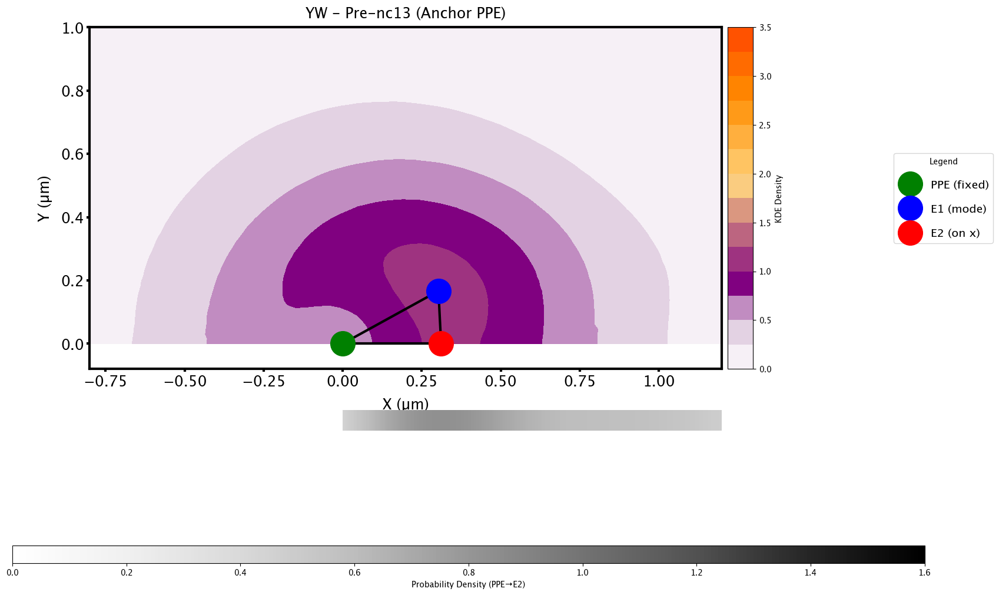

Surface integral: 1.0000


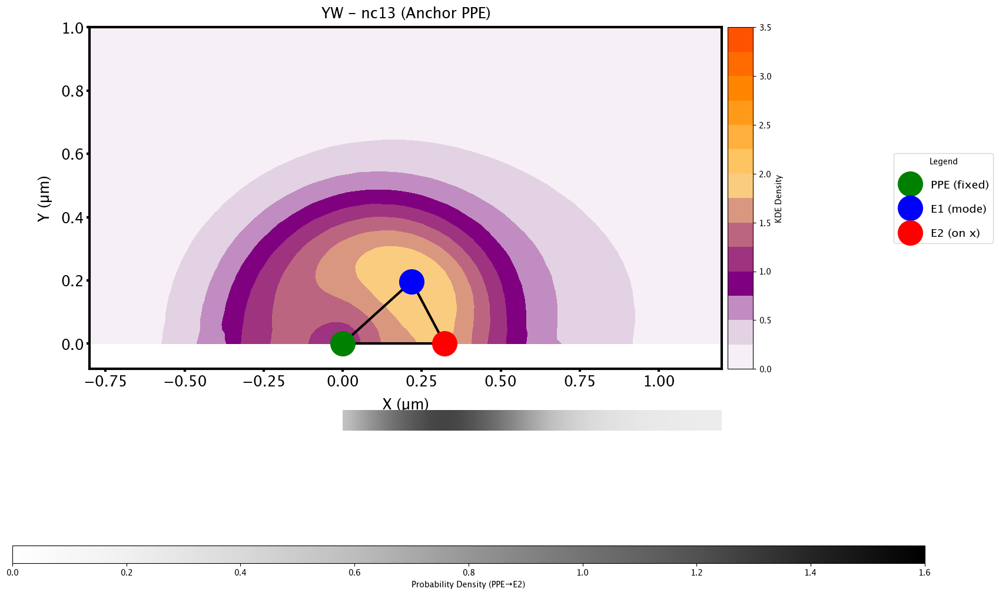

Surface integral: 1.0000


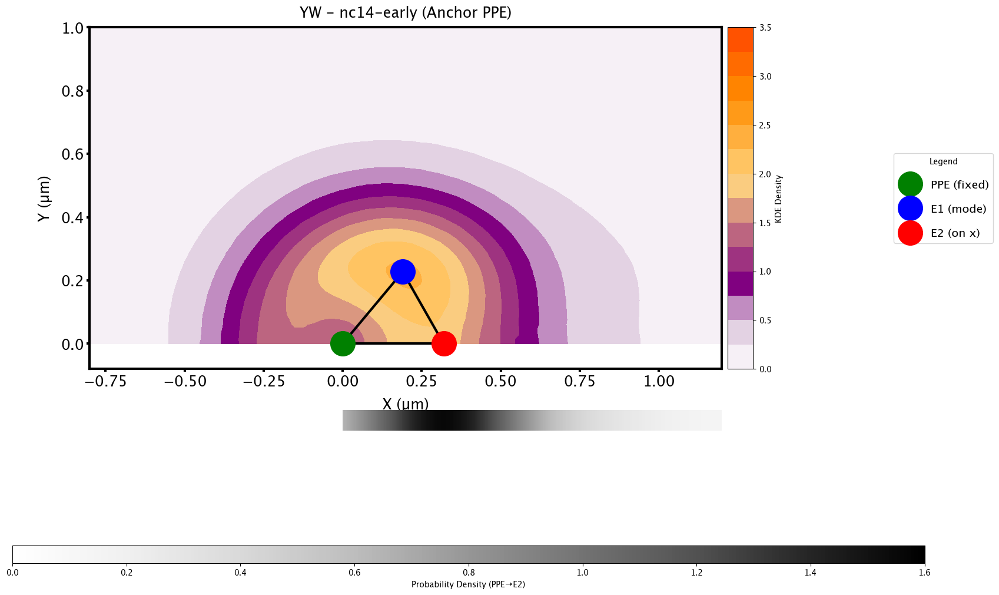

Surface integral: 1.0000


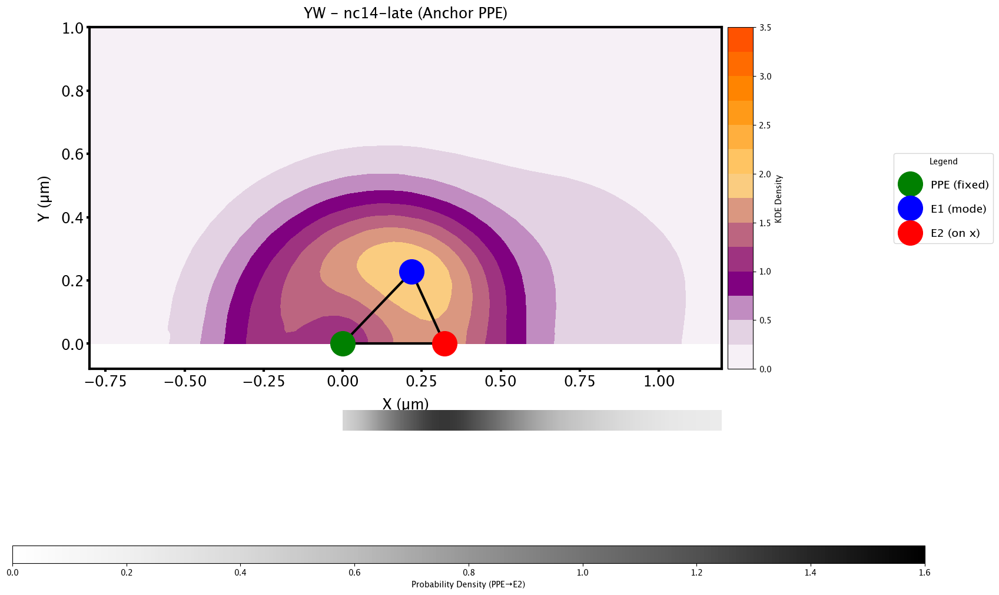

✅ Anchor PPE visualizations complete (variables use _anchorPPE suffix)


In [53]:
# =============================================================================
# ANCHOR PPE VISUALIZATION - Wild-type
# =============================================================================
# NOTE: These use PPE as anchor (different from E1-anchored contours in Section VII)
# Variable names use "_anchorPPE" suffix to avoid conflicts

# Pre-nc13 (Anchor PPE)
result = plot_contour_stage_center_PPE(
    yw_kde_results_e1_e2['Pre-nc13']['x'], yw_kde_results_e1_ppe['Pre-nc13']['x'], 
    yw_kde_results_e1_e2['Pre-nc13']['y'], yw_kde_results_e1_ppe['Pre-nc13']['y'], 
    yw_kde_results_e2_ppe['Pre-nc13']['x'], yw_kde_results_e2_ppe['Pre-nc13']['y'],
    title="YW - Pre-nc13 (Anchor PPE)", show_legend=True, x_tick_limit=None, num_samples=10, vmin=0, vmax=3.5
)
Z_pre_nc13_yw_anchorPPE, X_pre_nc13_yw_anchorPPE, Y_pre_nc13_yw_anchorPPE, E1_pre_nc13_yw_anchorPPE, E2_pre_nc13_yw_anchorPPE, PPE_pre_nc13_yw_anchorPPE = result

# nc13 (Anchor PPE)
result = plot_contour_stage_center_PPE(
    yw_kde_results_e2_ppe['nc13']['x'], yw_kde_results_e1_ppe['nc13']['x'], 
    yw_kde_results_e2_ppe['nc13']['y'], yw_kde_results_e1_ppe['nc13']['y'], 
    yw_kde_results_e1_e2['nc13']['x'], yw_kde_results_e1_e2['nc13']['y'],
    title="YW - nc13 (Anchor PPE)", show_legend=True, x_tick_limit=None, num_samples=10, vmin=0, vmax=3.5
)
Z_nc13_yw_anchorPPE, X_nc13_yw_anchorPPE, Y_nc13_yw_anchorPPE, E1_nc13_yw_anchorPPE, E2_nc13_yw_anchorPPE, PPE_nc13_yw_anchorPPE = result

# nc14-early (Anchor PPE)
result = plot_contour_stage_center_PPE(
    yw_kde_results_e2_ppe['nc14-early']['x'], yw_kde_results_e1_ppe['nc14-early']['x'], 
    yw_kde_results_e2_ppe['nc14-early']['y'], yw_kde_results_e1_ppe['nc14-early']['y'], 
    yw_kde_results_e1_e2['nc14-early']['x'], yw_kde_results_e1_e2['nc14-early']['y'],
    title="YW - nc14-early (Anchor PPE)", show_legend=True, x_tick_limit=None, num_samples=10, vmin=0, vmax=3.5
)
Z_nc14_early_yw_anchorPPE, X_nc14_early_yw_anchorPPE, Y_nc14_early_yw_anchorPPE, E1_nc14_early_yw_anchorPPE, E2_nc14_early_yw_anchorPPE, PPE_nc14_early_yw_anchorPPE = result

# nc14-late (Anchor PPE)
result = plot_contour_stage_center_PPE(
    yw_kde_results_e2_ppe['nc14-late']['x'], yw_kde_results_e1_ppe['nc14-late']['x'], 
    yw_kde_results_e2_ppe['nc14-late']['y'], yw_kde_results_e1_ppe['nc14-late']['y'], 
    yw_kde_results_e1_e2['nc14-late']['x'], yw_kde_results_e1_e2['nc14-late']['y'],
    title="YW - nc14-late (Anchor PPE)", show_legend=True, x_tick_limit=None, num_samples=10, vmin=0, vmax=3.5
)
Z_nc14_late_yw_anchorPPE, X_nc14_late_yw_anchorPPE, Y_nc14_late_yw_anchorPPE, E1_nc14_late_yw_anchorPPE, E2_nc14_late_yw_anchorPPE, PPE_nc14_late_yw_anchorPPE = result

print("✅ Anchor PPE visualizations complete (variables use _anchorPPE suffix)")

In [54]:
# (Anchor PPE code moved to previous cell)

---

# Section IX: Comprehensive Subtraction Contour Plots

**Corresponds to difference panels in Figures 3-6.**

Subtraction contours visualize the difference in 2D joint probability between two conditions:
- **Positive values (red/orange)**: Condition 1 has higher probability density
- **Negative values (blue)**: Condition 2 has higher probability density

Each comparison includes:
- KS test statistics with Benjamini-Hochberg FDR correction
- Simes global p-value combining all three distance types

### Comparisons Included

1. **WT Stage-to-Stage** (temporal dynamics in wild-type)
2. **WT vs Δ800PPE** (genotype comparison at each stage)
3. **WT vs MiMIC** (genotype comparison at each stage)
4. **Δ800PPE vs MiMIC** (mutant-to-mutant comparison)
5. **Δ800PPE Stage-to-Stage** (temporal dynamics in mutant)
6. **MiMIC Stage-to-Stage** (temporal dynamics in mutant)
7. **Cross-genotype Cross-stage** (testing developmental delay hypothesis)


## 9.1 WT Stage-to-Stage Comparisons (Temporal Dynamics)

These plots show how the wild-type joint probability distribution changes across developmental stages.

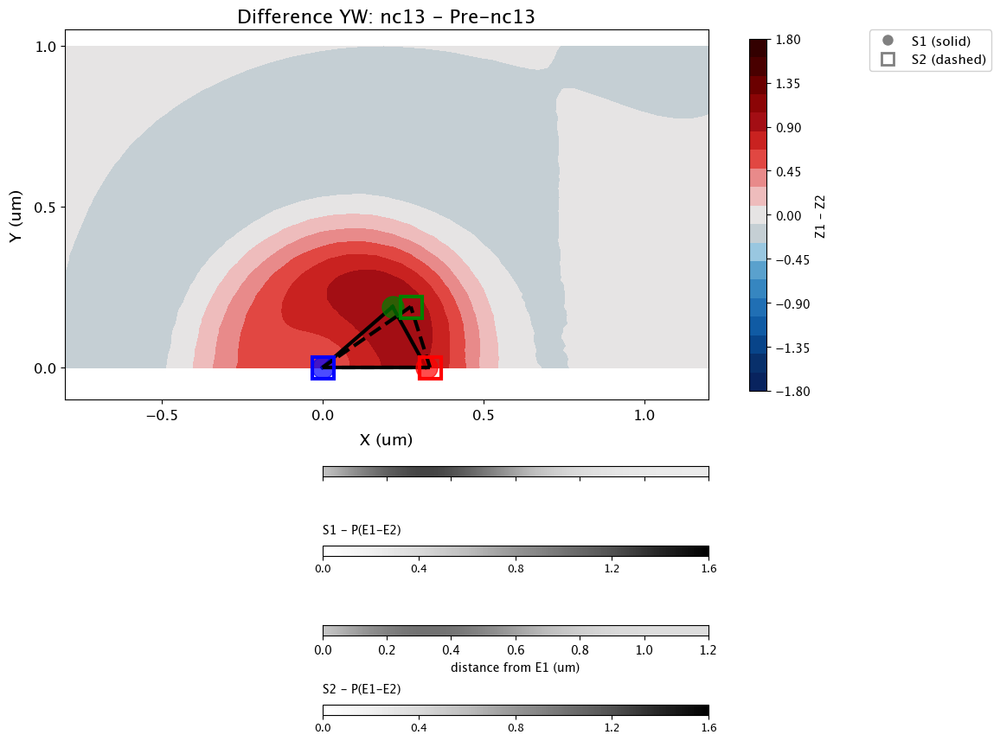


Comparison: WT nc13 vs Pre-nc13
Method: BH (FDR) (alpha = 0.05)

Distance            Raw p       Adj. p  Significant
--------------------------------------------------
E2-PPE         3.9247e-05   1.1774e-04          Yes
E1-PPE         9.1935e-05   1.3790e-04          Yes
E1-E2          9.2870e-02   9.2870e-02           No

Simes global p: 1.1774e-04
Bonferroni global p: 1.1774e-04
Any significant? True


In [55]:
# WT: nc13 vs Pre-nc13
# Shows transition from pre-nc13 to nc13 stage
plot_difference_contour_with_e1e2_pdf(
    Z_weighted_nc13_yw, X_grid_nc13_yw, Y_grid_nc13_yw,
    Z_weighted_pre_nc13_yw, X_grid_pre_nc13_yw, Y_grid_pre_nc13_yw,
    E1_yw_nc13, E2_yw_nc13, PPE_yw_nc13,
    E1_yw_pre_nc13, E2_yw_pre_nc13, PPE_yw_pre_nc13,
    yw_kde_results_e1_e2['nc13']['x'], yw_kde_results_e1_e2['nc13']['y'],
    yw_kde_results_e1_e2['Pre-nc13']['x'], yw_kde_results_e1_e2['Pre-nc13']['y'], 
    title="Difference YW: nc13 - Pre-nc13"
)

# KS test with FDR correction
res = ks_three_from_frames(
    dfA_d1=YW_E2_PPE_nc13, dfA_d2=YW_E1_PPE_nc13, dfA_d3=YW_E1_E2_nc13,
    dfB_d1=YW_E2_PPE_nc12, dfB_d2=YW_E1_PPE_nc12, dfB_d3=YW_E1_E2_nc12,
    col_d1="E2-PPE distance (um)", col_d2="E1-PPE distance (um)", col_d3="E1-E2 distance (um)",
    alpha=0.05, method="BH"
)
print_ks_three_results(res, "WT nc13 vs Pre-nc13")

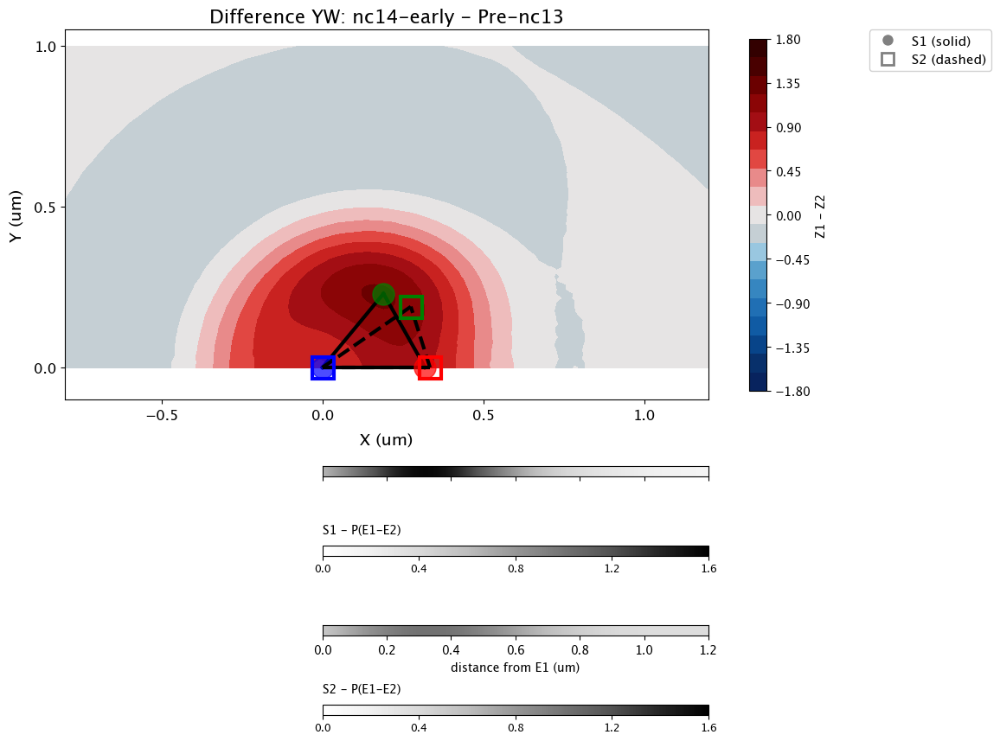

In [56]:
# WT: nc14-early vs Pre-nc13
# Shows transition from earliest stage to nc14-early
plot_difference_contour_with_e1e2_pdf(
    Z_weighted_nc14_early_yw, X_grid_nc14_early_yw, Y_grid_nc14_early_yw,
    Z_weighted_pre_nc13_yw, X_grid_pre_nc13_yw, Y_grid_pre_nc13_yw,
    E1_yw_nc14_early, E2_yw_nc14_early, PPE_yw_nc14_early,
    E1_yw_pre_nc13, E2_yw_pre_nc13, PPE_yw_pre_nc13,
    yw_kde_results_e1_e2['nc14-early']['x'], yw_kde_results_e1_e2['nc14-early']['y'],
    yw_kde_results_e1_e2['Pre-nc13']['x'], yw_kde_results_e1_e2['Pre-nc13']['y'], 
    title="Difference YW: nc14-early - Pre-nc13"
);

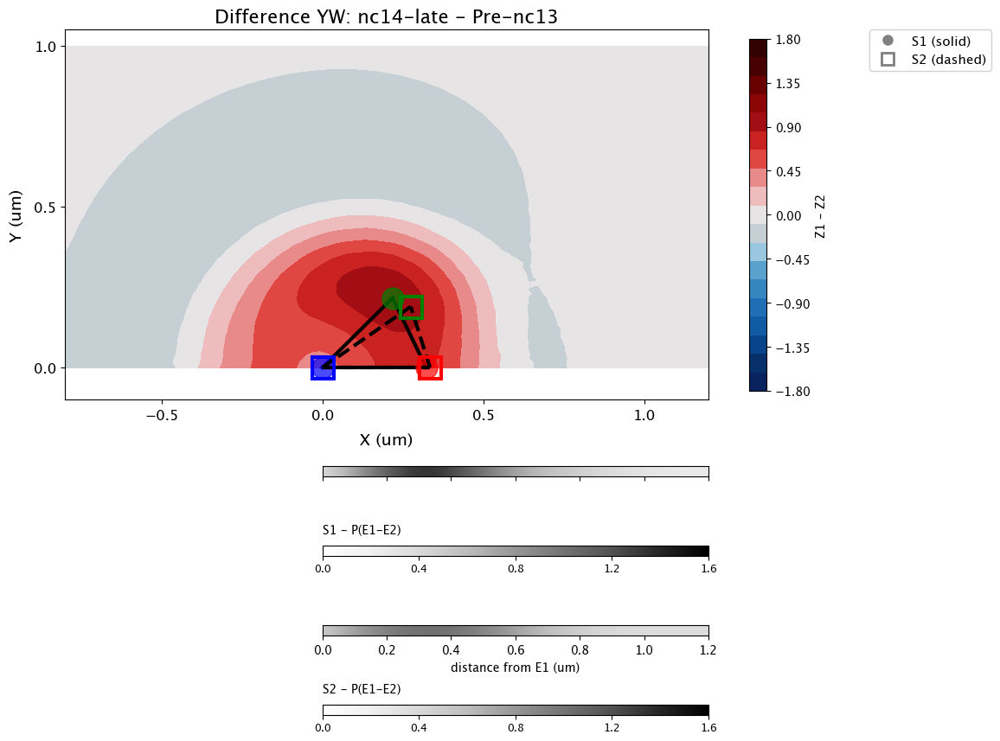

In [57]:
# WT: nc14-late vs Pre-nc13
# Shows full developmental progression from earliest to latest stage
plot_difference_contour_with_e1e2_pdf(
    Z_weighted_nc14_late_yw, X_grid_nc14_late_yw, Y_grid_nc14_late_yw,
    Z_weighted_pre_nc13_yw, X_grid_pre_nc13_yw, Y_grid_pre_nc13_yw,
    E1_yw_nc14_late, E2_yw_nc14_late, PPE_yw_nc14_late,
    E1_yw_pre_nc13, E2_yw_pre_nc13, PPE_yw_pre_nc13,
    yw_kde_results_e1_e2['nc14-late']['x'], yw_kde_results_e1_e2['nc14-late']['y'],
    yw_kde_results_e1_e2['Pre-nc13']['x'], yw_kde_results_e1_e2['Pre-nc13']['y'], 
    title="Difference YW: nc14-late - Pre-nc13"
);

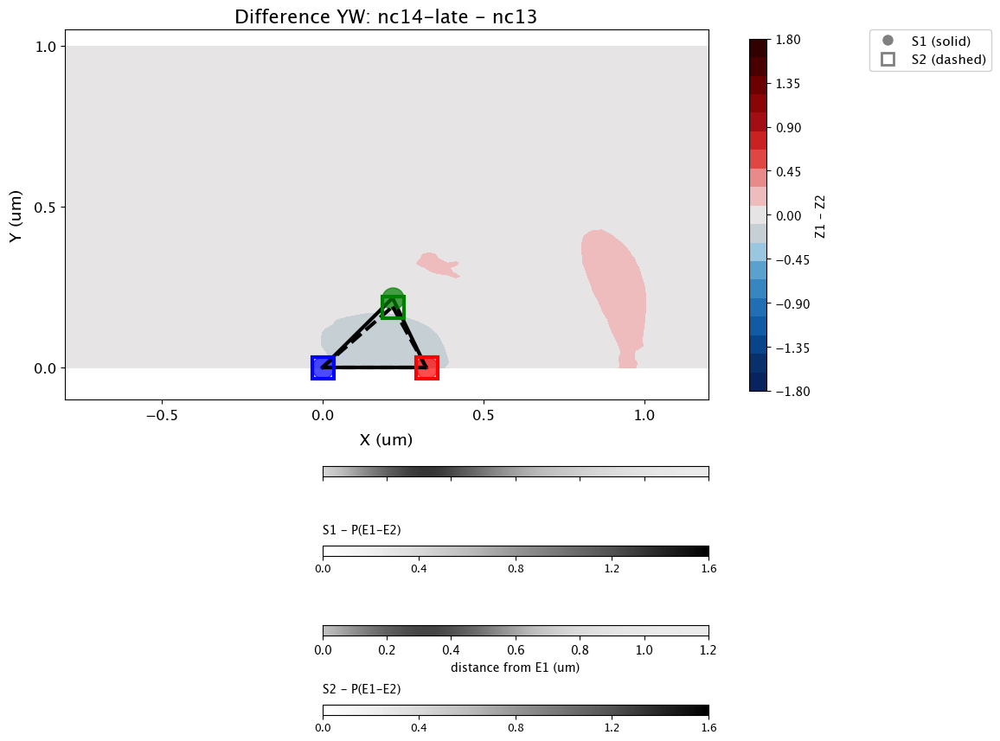

In [58]:
# WT: nc14-late vs nc13
# Shows transition from nc13 to nc14-late
plot_difference_contour_with_e1e2_pdf(
    Z_weighted_nc14_late_yw, X_grid_nc14_late_yw, Y_grid_nc14_late_yw, 
    Z_weighted_nc13_yw, X_grid_nc13_yw, Y_grid_nc13_yw,
    E1_yw_nc14_late, E2_yw_nc14_late, PPE_yw_nc14_late,
    E1_yw_nc13, E2_yw_nc13, PPE_yw_nc13,
    yw_kde_results_e1_e2['nc14-late']['x'], yw_kde_results_e1_e2['nc14-late']['y'],
    yw_kde_results_e1_e2['nc13']['x'], yw_kde_results_e1_e2['nc13']['y'],
    title="Difference YW: nc14-late - nc13"
);

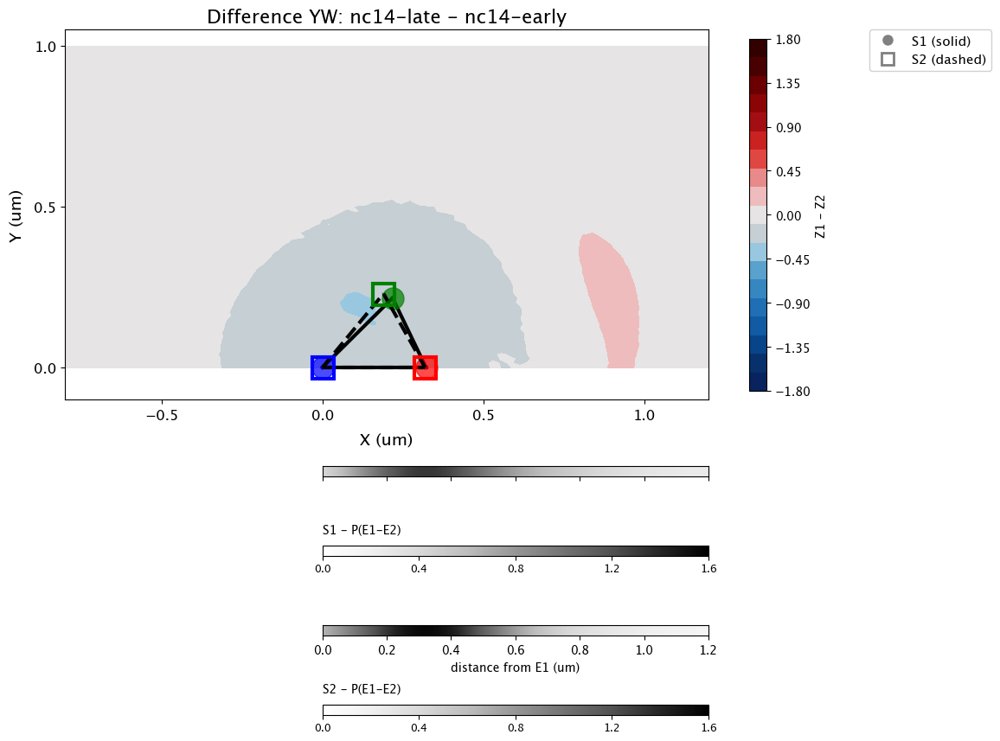

In [59]:
# WT: nc14-late vs nc14-early
# Shows changes within nc14 stage
plot_difference_contour_with_e1e2_pdf(
    Z_weighted_nc14_late_yw, X_grid_nc14_late_yw, Y_grid_nc14_late_yw, 
    Z_weighted_nc14_early_yw, X_grid_nc14_early_yw, Y_grid_nc14_early_yw,
    E1_yw_nc14_late, E2_yw_nc14_late, PPE_yw_nc14_late,
    E1_yw_nc14_early, E2_yw_nc14_early, PPE_yw_nc14_early,
    yw_kde_results_e1_e2['nc14-late']['x'], yw_kde_results_e1_e2['nc14-late']['y'],
    yw_kde_results_e1_e2['nc14-early']['x'], yw_kde_results_e1_e2['nc14-early']['y'],           
    title="Difference YW: nc14-late - nc14-early"
);

## 9.2 WT vs PPE Comparisons (All Stages)

These plots compare wild-type (WT) to PPE mutant at each developmental stage.

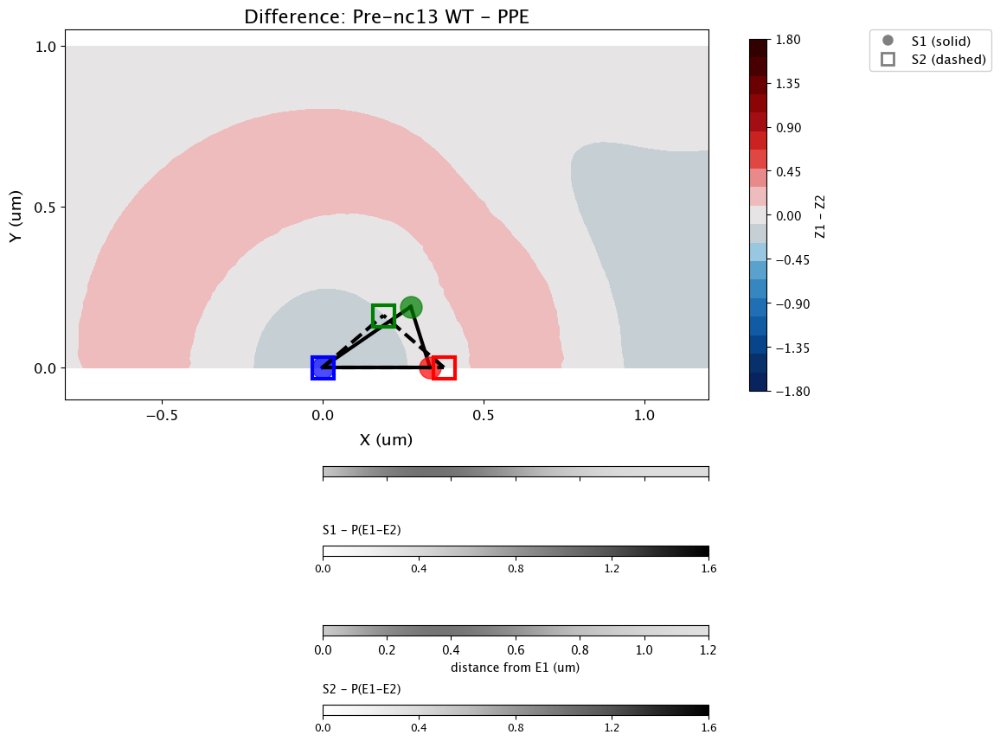


Comparison: Pre-nc13 WT vs PPE
Method: BH (FDR) (alpha = 0.05)

Distance            Raw p       Adj. p  Significant
--------------------------------------------------
E2-PPE         1.3562e-01   2.0344e-01           No
E1-PPE         8.0752e-02   2.0344e-01           No
E1-E2          8.9361e-01   8.9361e-01           No

Simes global p: 2.0344e-01
Bonferroni global p: 2.4226e-01
Any significant? False


In [60]:
# WT vs PPE at Pre-nc13
plot_difference_contour_with_e1e2_pdf(
    Z_weighted_pre_nc13_yw, X_grid_pre_nc13_yw, Y_grid_pre_nc13_yw,
    Z_weighted_pre_nc13_ppe, X_grid_pre_nc13_ppe, Y_grid_pre_nc13_ppe,
    E1_yw_pre_nc13, E2_yw_pre_nc13, PPE_yw_pre_nc13,
    E1_ppe_pre_nc13, E2_ppe_pre_nc13, PPE_ppe_pre_nc13,
    yw_kde_results_e1_e2['Pre-nc13']['x'], yw_kde_results_e1_e2['Pre-nc13']['y'],
    ppe_kde_results_e1_e2['Pre-nc13']['x'], ppe_kde_results_e1_e2['Pre-nc13']['y'],
    title="Difference: Pre-nc13 WT - PPE"
)

# KS test with FDR correction
res = ks_three_from_frames(
    dfA_d1=YW_E2_PPE_nc12, dfA_d2=YW_E1_PPE_nc12, dfA_d3=YW_E1_E2_nc12,
    dfB_d1=PPE_E2_PPE_nc12, dfB_d2=PPE_E1_PPE_nc12, dfB_d3=PPE_E1_E2_nc12,
    col_d1="E2-PPE distance (um)", col_d2="E1-PPE distance (um)", col_d3="E1-E2 distance (um)",
    alpha=0.05, method="BH"
)
print_ks_three_results(res, "Pre-nc13 WT vs PPE")

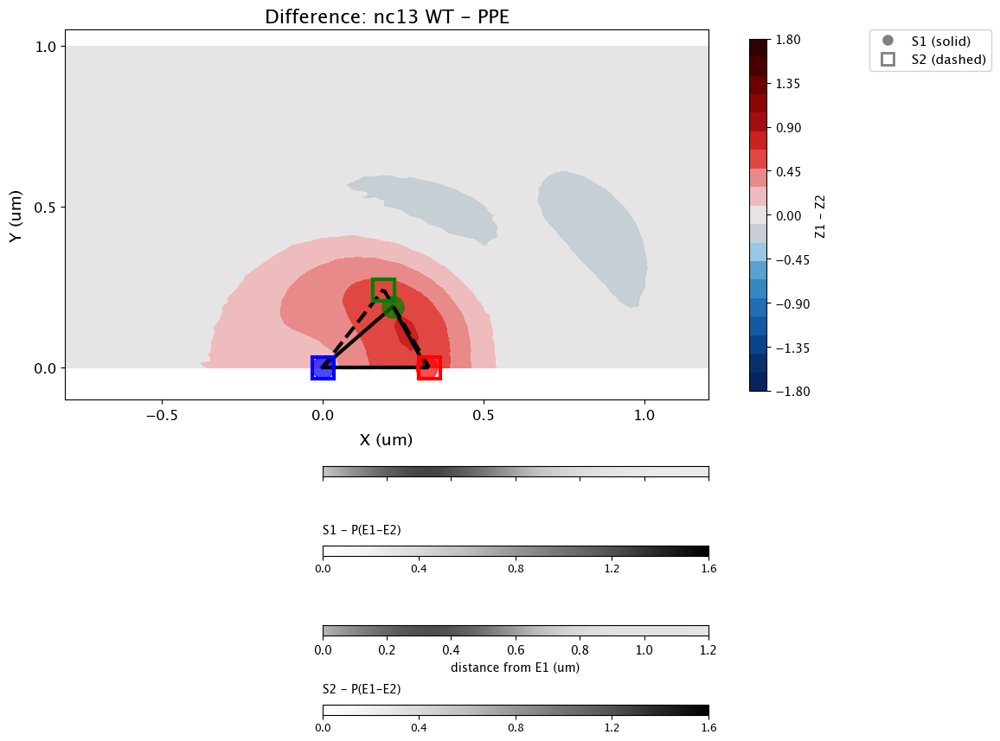


Comparison: nc13 WT vs PPE
Method: BH (FDR) (alpha = 0.05)

Distance            Raw p       Adj. p  Significant
--------------------------------------------------
E2-PPE         1.3383e-02   2.0075e-02          Yes
E1-PPE         2.5520e-03   7.6561e-03          Yes
E1-E2          7.7782e-01   7.7782e-01           No

Simes global p: 7.6561e-03
Bonferroni global p: 7.6561e-03
Any significant? True


In [61]:
# WT vs PPE at nc13
plot_difference_contour_with_e1e2_pdf(
    Z_weighted_nc13_yw, X_grid_nc13_yw, Y_grid_nc13_yw,
    Z_weighted_nc13_ppe, X_grid_nc13_ppe, Y_grid_nc13_ppe,
    E1_yw_nc13, E2_yw_nc13, PPE_yw_nc13,
    E1_ppe_nc13, E2_ppe_nc13, PPE_ppe_nc13,
    yw_kde_results_e1_e2['nc13']['x'], yw_kde_results_e1_e2['nc13']['y'],
    ppe_kde_results_e1_e2['nc13']['x'], ppe_kde_results_e1_e2['nc13']['y'],
    title="Difference: nc13 WT - PPE"
)

# KS test with FDR correction
res = ks_three_from_frames(
    dfA_d1=YW_E2_PPE_nc13, dfA_d2=YW_E1_PPE_nc13, dfA_d3=YW_E1_E2_nc13,
    dfB_d1=PPE_E2_PPE_nc13, dfB_d2=PPE_E1_PPE_nc13, dfB_d3=PPE_E1_E2_nc13,
    col_d1="E2-PPE distance (um)", col_d2="E1-PPE distance (um)", col_d3="E1-E2 distance (um)",
    alpha=0.05, method="BH"
)
print_ks_three_results(res, "nc13 WT vs PPE")

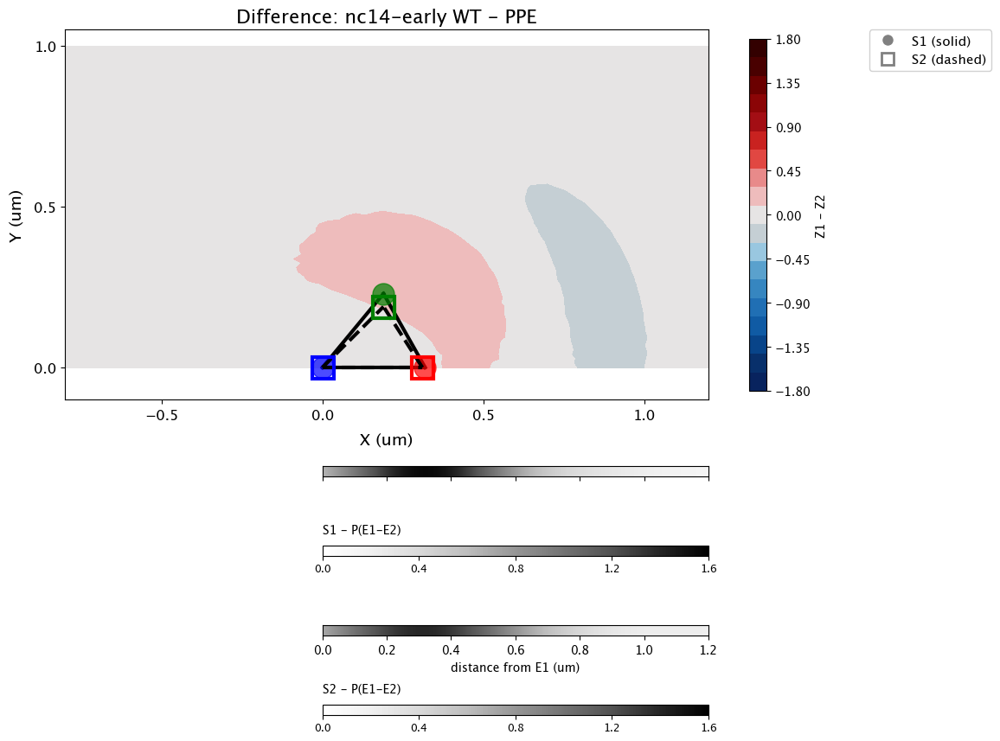


Comparison: nc14-early WT vs PPE
Method: BH (FDR) (alpha = 0.05)

Distance            Raw p       Adj. p  Significant
--------------------------------------------------
E2-PPE         9.9667e-01   9.9667e-01           No
E1-PPE         3.5294e-01   9.9667e-01           No
E1-E2          6.9111e-01   9.9667e-01           No

Simes global p: 9.9667e-01
Bonferroni global p: 1.0000e+00
Any significant? False


In [62]:
# WT vs PPE at nc14-early
plot_difference_contour_with_e1e2_pdf(
    Z_weighted_nc14_early_yw, X_grid_nc14_early_yw, Y_grid_nc14_early_yw,
    Z_weighted_nc14_early_ppe, X_grid_nc14_early_yw, Y_grid_nc14_early_ppe,
    E1_yw_nc14_early, E2_yw_nc14_early, PPE_yw_nc14_early,
    E1_ppe_nc14_early, E2_ppe_nc14_early, PPE_ppe_nc14_early,
    yw_kde_results_e1_e2['nc14-early']['x'], yw_kde_results_e1_e2['nc14-early']['y'],
    ppe_kde_results_e1_e2['nc14-early']['x'], ppe_kde_results_e1_e2['nc14-early']['y'],   
    title="Difference: nc14-early WT - PPE"
)

# KS test with FDR correction
res = ks_three_from_frames(
    dfA_d1=YW_E2_PPE_nc14_early, dfA_d2=YW_E1_PPE_nc14_early, dfA_d3=YW_E1_E2_nc14_early,
    dfB_d1=PPE_E2_PPE_nc14_early, dfB_d2=PPE_E1_PPE_nc14_early, dfB_d3=PPE_E1_E2_nc14_early,
    col_d1="E2-PPE distance (um)", col_d2="E1-PPE distance (um)", col_d3="E1-E2 distance (um)",
    alpha=0.05, method="BH"
)
print_ks_three_results(res, "nc14-early WT vs PPE")

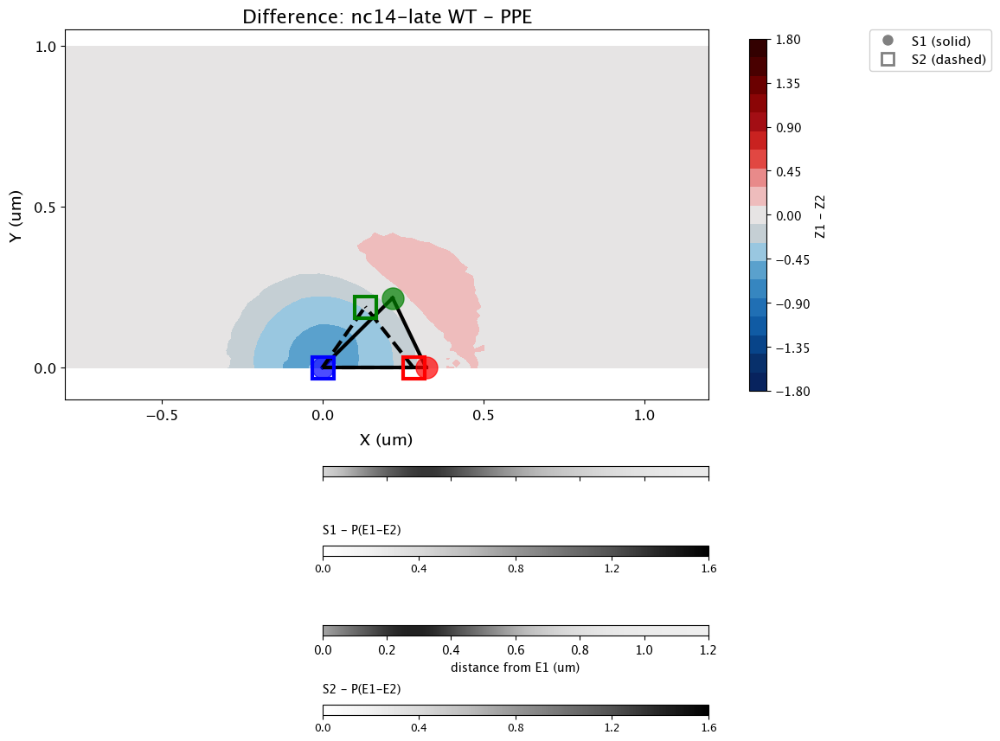


Comparison: nc14-late WT vs PPE
Method: BH (FDR) (alpha = 0.05)

Distance            Raw p       Adj. p  Significant
--------------------------------------------------
E2-PPE         2.2648e-01   2.2648e-01           No
E1-PPE         7.2954e-05   2.1886e-04          Yes
E1-E2          3.1082e-03   4.6624e-03          Yes

Simes global p: 2.1886e-04
Bonferroni global p: 2.1886e-04
Any significant? True


In [63]:
# WT vs PPE at nc14-late
plot_difference_contour_with_e1e2_pdf(
    Z_weighted_nc14_late_yw, X_grid_nc14_late_yw, Y_grid_nc14_late_yw,
    Z_weighted_nc14_late_ppe, X_grid_nc14_late_yw, Y_grid_nc14_late_ppe,
    E1_yw_nc14_late, E2_yw_nc14_late, PPE_yw_nc14_late,
    E1_ppe_nc14_late, E2_ppe_nc14_late, PPE_ppe_nc14_late,
    yw_kde_results_e1_e2['nc14-late']['x'], yw_kde_results_e1_e2['nc14-late']['y'],
    ppe_kde_results_e1_e2['nc14-late']['x'], ppe_kde_results_e1_e2['nc14-late']['y'],   
    title="Difference: nc14-late WT - PPE"
)

# KS test with FDR correction
res = ks_three_from_frames(
    dfA_d1=YW_E2_PPE_nc14_late, dfA_d2=YW_E1_PPE_nc14_late, dfA_d3=YW_E1_E2_nc14_late,
    dfB_d1=PPE_E2_PPE_nc14_late, dfB_d2=PPE_E1_PPE_nc14_late, dfB_d3=PPE_E1_E2_nc14_late,
    col_d1="E2-PPE distance (um)", col_d2="E1-PPE distance (um)", col_d3="E1-E2 distance (um)",
    alpha=0.05, method="BH"
)
print_ks_three_results(res, "nc14-late WT vs PPE")

## 9.3 WT vs MiMIC Comparisons (All Stages)

These plots compare wild-type (WT) to MiMIC mutant at each developmental stage.

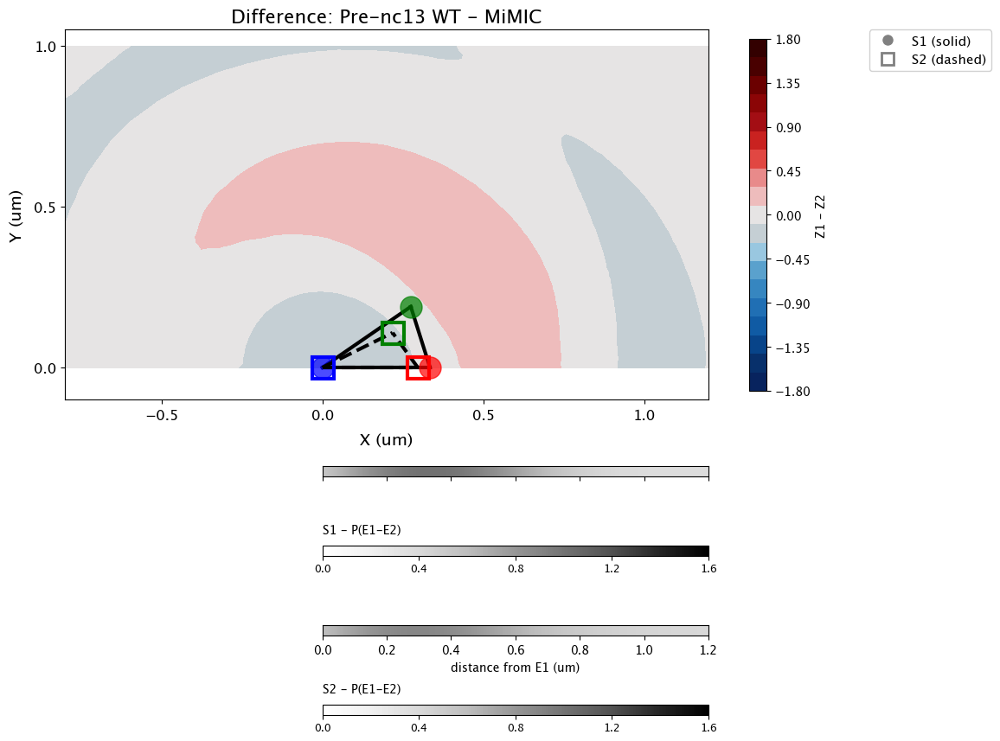

In [64]:
# WT vs MiMIC at Pre-nc13
plot_difference_contour_with_e1e2_pdf(
    Z_weighted_pre_nc13_yw, X_grid_pre_nc13_yw, Y_grid_pre_nc13_yw,
    Z_weighted_pre_nc13_mimic, X_grid_pre_nc13_mimic, Y_grid_pre_nc13_mimic, 
    E1_yw_pre_nc13, E2_yw_pre_nc13, PPE_yw_pre_nc13,
    E1_mimic_pre_nc13, E2_mimic_pre_nc13, PPE_mimic_pre_nc13,
    yw_kde_results_e1_e2['Pre-nc13']['x'], yw_kde_results_e1_e2['Pre-nc13']['y'],
    mimic_kde_results_e1_e2['Pre-nc13']['x'], mimic_kde_results_e1_e2['Pre-nc13']['y'],        
    title="Difference: Pre-nc13 WT - MiMIC"
);

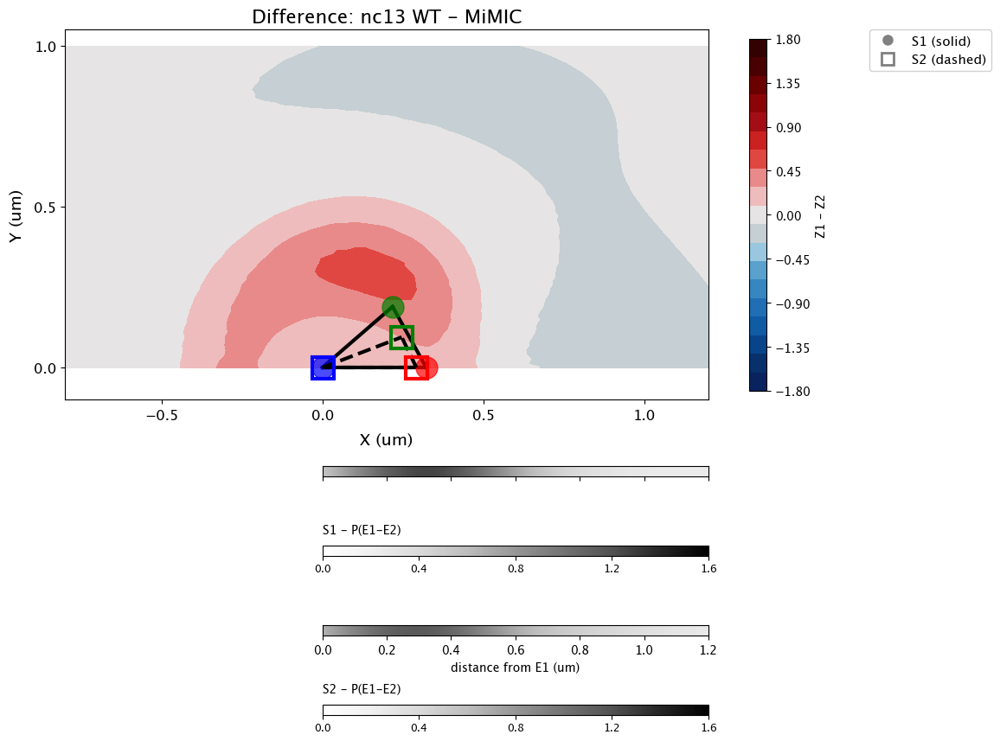


Comparison: nc13 WT vs MiMIC
Method: BH (FDR) (alpha = 0.05)

Distance            Raw p       Adj. p  Significant
--------------------------------------------------
E2-PPE         3.6225e-02   5.4337e-02           No
E1-PPE         1.4810e-03   4.4430e-03          Yes
E1-E2          5.9589e-01   5.9589e-01           No

Simes global p: 4.4430e-03
Bonferroni global p: 4.4430e-03
Any significant? True


In [65]:
# WT vs MiMIC at nc13
plot_difference_contour_with_e1e2_pdf(
    Z_weighted_nc13_yw, X_grid_nc13_yw, Y_grid_nc13_yw,
    Z_weighted_nc13_mimic, X_grid_nc13_mimic, Y_grid_nc13_mimic,
    E1_yw_nc13, E2_yw_nc13, PPE_yw_nc13,
    E1_mimic_nc13, E2_mimic_nc13, PPE_mimic_nc13,
    yw_kde_results_e1_e2['nc13']['x'], yw_kde_results_e1_e2['nc13']['y'],
    mimic_kde_results_e1_e2['nc13']['x'], mimic_kde_results_e1_e2['nc13']['y'],    
    title="Difference: nc13 WT - MiMIC"
);

# KS test with FDR correction
res = ks_three_from_frames(
    dfA_d1=YW_E2_PPE_nc13, dfA_d2=YW_E1_PPE_nc13, dfA_d3=YW_E1_E2_nc13,
    dfB_d1=MiMIC_E2_PPE_nc13, dfB_d2=MiMIC_E1_PPE_nc13, dfB_d3=MiMIC_E1_E2_nc13,
    col_d1="E2-PPE distance (um)", col_d2="E1-PPE distance (um)", col_d3="E1-E2 distance (um)",
    alpha=0.05, method="BH"
)
print_ks_three_results(res, "nc13 WT vs MiMIC")

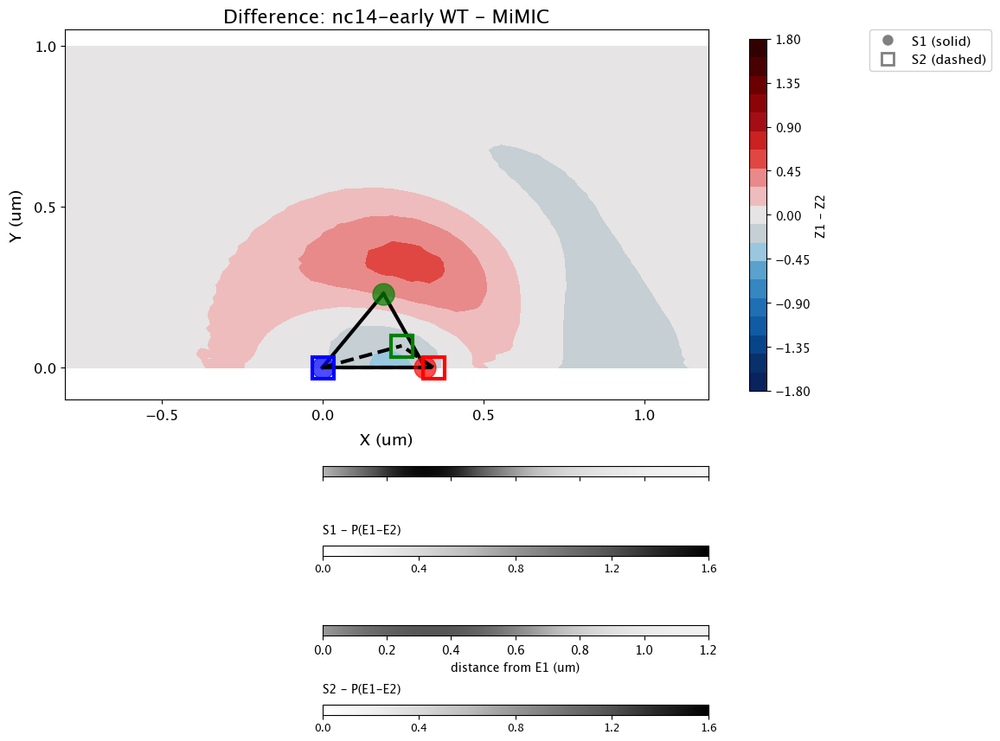


Comparison: nc14-early WT vs MiMIC
Method: BH (FDR) (alpha = 0.05)

Distance            Raw p       Adj. p  Significant
--------------------------------------------------
E2-PPE         4.8004e-03   1.4401e-02          Yes
E1-PPE         2.8245e-01   2.9249e-01           No
E1-E2          2.9249e-01   2.9249e-01           No

Simes global p: 1.4401e-02
Bonferroni global p: 1.4401e-02
Any significant? True


In [66]:
# WT vs MiMIC at nc14-early
plot_difference_contour_with_e1e2_pdf(
    Z_weighted_nc14_early_yw, X_grid_nc14_early_yw, Y_grid_nc14_early_yw,
    Z_weighted_nc14_early_mimic, X_grid_nc14_early_mimic, Y_grid_nc14_early_mimic, 
    E1_yw_nc14_early, E2_yw_nc14_early, PPE_yw_nc14_early,
    E1_mimic_nc14_early, E2_mimic_nc14_early, PPE_mimic_nc14_early,
    yw_kde_results_e1_e2['nc14-early']['x'], yw_kde_results_e1_e2['nc14-early']['y'],
    mimic_kde_results_e1_e2['nc14-early']['x'], mimic_kde_results_e1_e2['nc14-early']['y'],    
    title="Difference: nc14-early WT - MiMIC"
);

# KS test with FDR correction
res = ks_three_from_frames(
    dfA_d1=YW_E2_PPE_nc14_early, dfA_d2=YW_E1_PPE_nc14_early, dfA_d3=YW_E1_E2_nc14_early,
    dfB_d1=MiMIC_E2_PPE_nc14_early, dfB_d2=MiMIC_E1_PPE_nc14_early, dfB_d3=MiMIC_E1_E2_nc14_early,
    col_d1="E2-PPE distance (um)", col_d2="E1-PPE distance (um)", col_d3="E1-E2 distance (um)",
    alpha=0.05, method="BH"
)
print_ks_three_results(res, "nc14-early WT vs MiMIC")

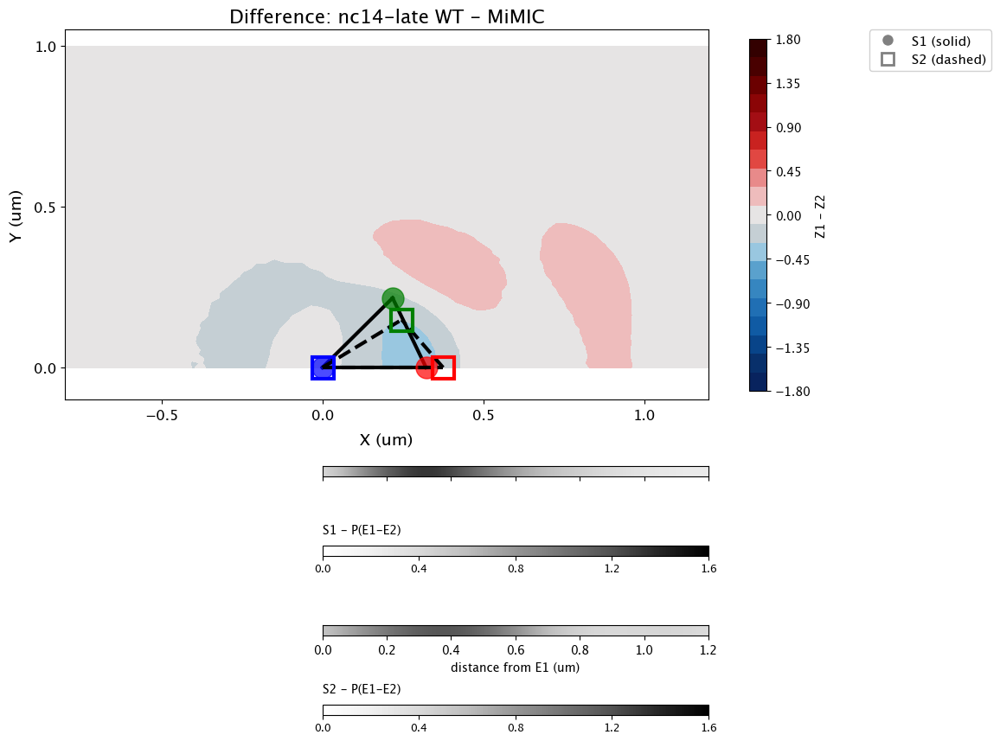

In [67]:
# WT vs MiMIC at nc14-late
plot_difference_contour_with_e1e2_pdf(
    Z_weighted_nc14_late_yw, X_grid_nc14_late_yw, Y_grid_nc14_late_yw,
    Z_weighted_nc14_late_mimic, X_grid_nc14_late_mimic, Y_grid_nc14_late_mimic,
    E1_yw_nc14_late, E2_yw_nc14_late, PPE_yw_nc14_late,
    E1_mimic_nc14_late, E2_mimic_nc14_late, PPE_mimic_nc14_late,
    yw_kde_results_e1_e2['nc14-late']['x'], yw_kde_results_e1_e2['nc14-late']['y'],
    mimic_kde_results_e1_e2['nc14-late']['x'], mimic_kde_results_e1_e2['nc14-late']['y'],  
    title="Difference: nc14-late WT - MiMIC"
);

## 9.4 PPE vs MiMIC Comparisons

These plots compare PPE mutant to MiMIC mutant at each developmental stage.

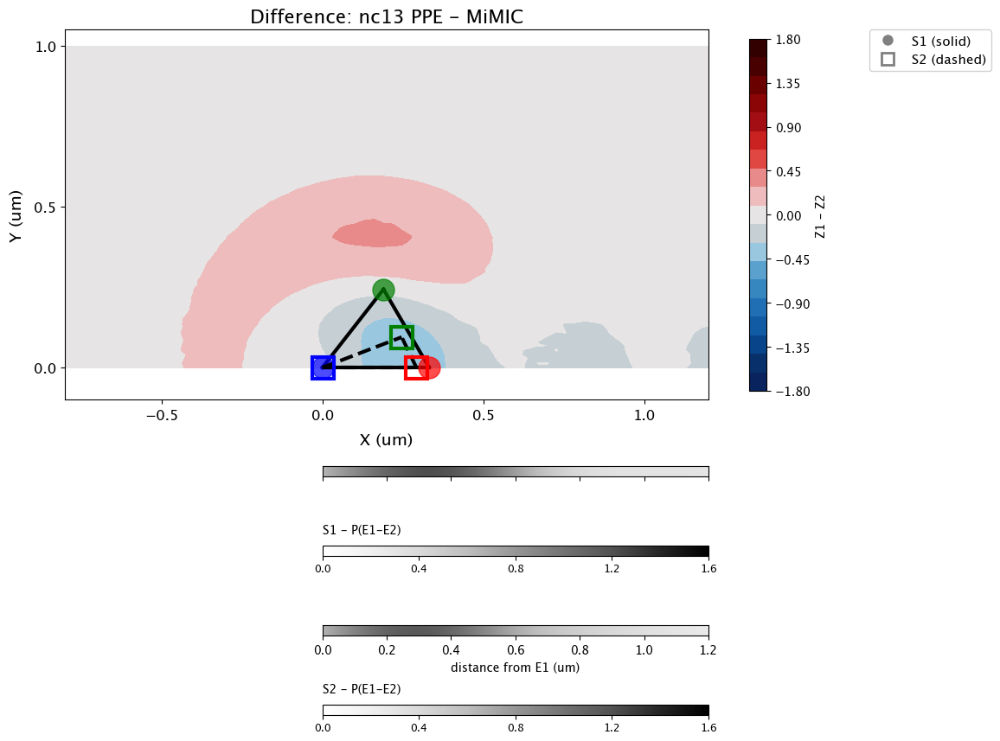


Comparison: nc13 PPE vs MiMIC
Method: BH (FDR) (alpha = 0.05)

Distance            Raw p       Adj. p  Significant
--------------------------------------------------
E2-PPE         4.3320e-06   1.2996e-05          Yes
E1-PPE         1.8661e-01   2.7991e-01           No
E1-E2          8.7951e-01   8.7951e-01           No

Simes global p: 1.2996e-05
Bonferroni global p: 1.2996e-05
Any significant? True


In [68]:
# PPE vs MiMIC at nc13
plot_difference_contour_with_e1e2_pdf(
    Z_weighted_nc13_ppe, X_grid_nc13_ppe, Y_grid_nc13_ppe,
    Z_weighted_nc13_mimic, X_grid_nc13_mimic, Y_grid_nc13_mimic,
    E1_ppe_nc13, E2_ppe_nc13, PPE_ppe_nc13,
    E1_mimic_nc13, E2_mimic_nc13, PPE_mimic_nc13,
    ppe_kde_results_e1_e2['nc13']['x'], ppe_kde_results_e1_e2['nc13']['y'],
    mimic_kde_results_e1_e2['nc13']['x'], mimic_kde_results_e1_e2['nc13']['y'],  
    title="Difference: nc13 PPE - MiMIC"
);

# KS test with FDR correction
res = ks_three_from_frames(
    dfA_d1=PPE_E2_PPE_nc13, dfA_d2=PPE_E1_PPE_nc13, dfA_d3=PPE_E1_E2_nc13,
    dfB_d1=MiMIC_E2_PPE_nc13, dfB_d2=MiMIC_E1_PPE_nc13, dfB_d3=MiMIC_E1_E2_nc13,
    col_d1="E2-PPE distance (um)", col_d2="E1-PPE distance (um)", col_d3="E1-E2 distance (um)",
    alpha=0.05, method="BH"
)
print_ks_three_results(res, "nc13 PPE vs MiMIC")

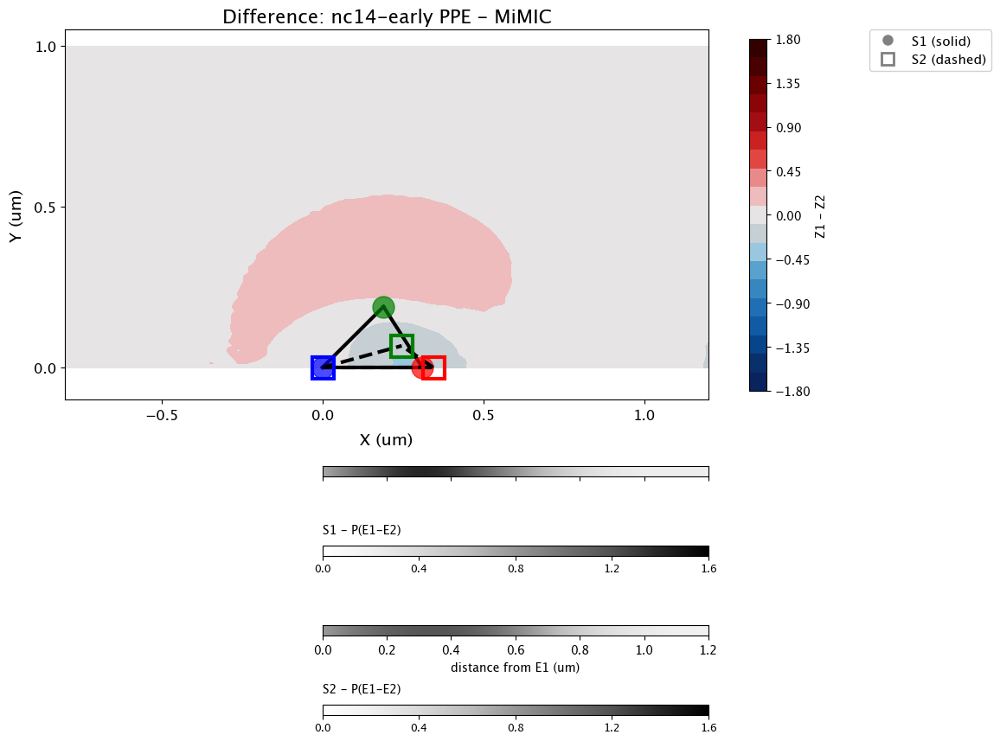

In [69]:
# PPE vs MiMIC at nc14-early
plot_difference_contour_with_e1e2_pdf(
    Z_weighted_nc14_early_ppe, X_grid_nc14_early_ppe, Y_grid_nc14_early_ppe,
    Z_weighted_nc14_early_mimic, X_grid_nc14_early_mimic, Y_grid_nc14_early_mimic,
    E1_ppe_nc14_early, E2_ppe_nc14_early, PPE_ppe_nc14_early,
    E1_mimic_nc14_early, E2_mimic_nc14_early, PPE_mimic_nc14_early,
    ppe_kde_results_e1_e2['nc14-early']['x'], ppe_kde_results_e1_e2['nc14-early']['y'],
    mimic_kde_results_e1_e2['nc14-early']['x'], mimic_kde_results_e1_e2['nc14-early']['y'],  
    title="Difference: nc14-early PPE - MiMIC"
);

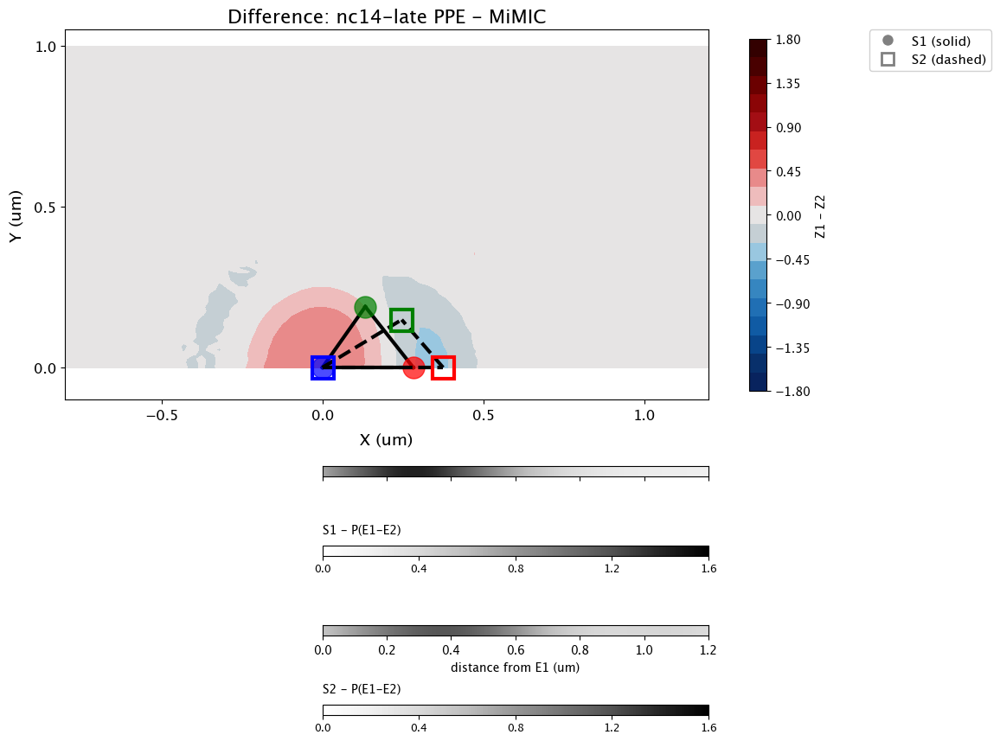


Comparison: nc14-late PPE vs MiMIC
Method: BH (FDR) (alpha = 0.05)

Distance            Raw p       Adj. p  Significant
--------------------------------------------------
E2-PPE         2.8070e-01   2.8070e-01           No
E1-PPE         1.7063e-04   5.1188e-04          Yes
E1-E2          1.4171e-03   2.1257e-03          Yes

Simes global p: 5.1188e-04
Bonferroni global p: 5.1188e-04
Any significant? True


In [70]:
# PPE vs MiMIC at nc14-late
plot_difference_contour_with_e1e2_pdf(
    Z_weighted_nc14_late_ppe, X_grid_nc14_late_ppe, Y_grid_nc14_late_ppe,
    Z_weighted_nc14_late_mimic, X_grid_nc14_late_mimic, Y_grid_nc14_late_mimic,
    E1_ppe_nc14_late, E2_ppe_nc14_late, PPE_ppe_nc14_late,
    E1_mimic_nc14_late, E2_mimic_nc14_late, PPE_mimic_nc14_late,
    ppe_kde_results_e1_e2['nc14-late']['x'], ppe_kde_results_e1_e2['nc14-late']['y'],
    mimic_kde_results_e1_e2['nc14-late']['x'], mimic_kde_results_e1_e2['nc14-late']['y'],  
    title="Difference: nc14-late PPE - MiMIC"
);

# KS test with FDR correction
res = ks_three_from_frames(
    dfA_d1=PPE_E2_PPE_nc14_late, dfA_d2=PPE_E1_PPE_nc14_late, dfA_d3=PPE_E1_E2_nc14_late,
    dfB_d1=MiMIC_E2_PPE_nc14_late, dfB_d2=MiMIC_E1_PPE_nc14_late, dfB_d3=MiMIC_E1_E2_nc14_late,
    col_d1="E2-PPE distance (um)", col_d2="E1-PPE distance (um)", col_d3="E1-E2 distance (um)",
    alpha=0.05, method="BH"
)
print_ks_three_results(res, "nc14-late PPE vs MiMIC")

## 9.5 PPE Stage-to-Stage Comparisons (Temporal Dynamics in Mutant)

These plots show how the PPE mutant joint probability distribution changes across developmental stages.

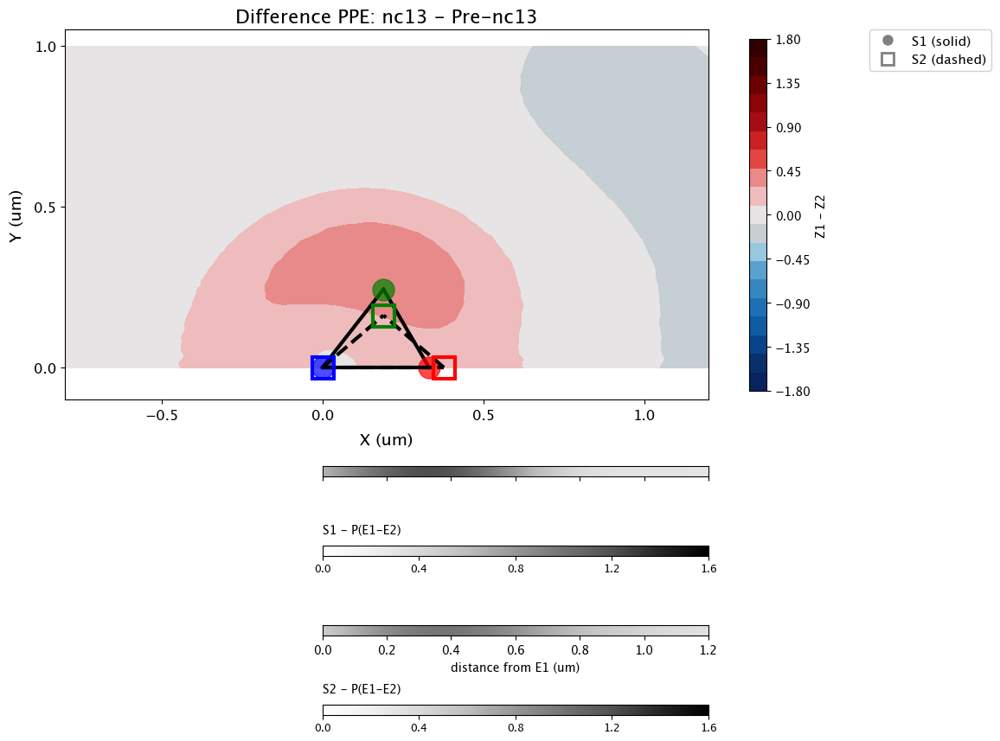


Comparison: PPE nc13 vs Pre-nc13
Method: BH (FDR) (alpha = 0.05)

Distance            Raw p       Adj. p  Significant
--------------------------------------------------
E2-PPE         5.6549e-01   5.6549e-01           No
E1-PPE         2.9681e-01   4.4521e-01           No
E1-E2          1.0378e-01   3.1135e-01           No

Simes global p: 3.1135e-01
Bonferroni global p: 3.1135e-01
Any significant? False


In [71]:
# PPE: nc13 vs Pre-nc13
plot_difference_contour_with_e1e2_pdf(
    Z_weighted_nc13_ppe, X_grid_nc13_ppe, Y_grid_nc13_ppe,
    Z_weighted_pre_nc13_ppe, X_grid_pre_nc13_ppe, Y_grid_pre_nc13_ppe,
    E1_ppe_nc13, E2_ppe_nc13, PPE_ppe_nc13,
    E1_ppe_pre_nc13, E2_ppe_pre_nc13, PPE_ppe_pre_nc13,
    ppe_kde_results_e1_e2['nc13']['x'], ppe_kde_results_e1_e2['nc13']['y'],
    ppe_kde_results_e1_e2['Pre-nc13']['x'], ppe_kde_results_e1_e2['Pre-nc13']['y'],      
    title="Difference PPE: nc13 - Pre-nc13"
)

# KS test with FDR correction
res = ks_three_from_frames(
    dfA_d1=PPE_E2_PPE_nc13, dfA_d2=PPE_E1_PPE_nc13, dfA_d3=PPE_E1_E2_nc13,
    dfB_d1=PPE_E2_PPE_nc12, dfB_d2=PPE_E1_PPE_nc12, dfB_d3=PPE_E1_E2_nc12,
    col_d1="E2-PPE distance (um)", col_d2="E1-PPE distance (um)", col_d3="E1-E2 distance (um)",
    alpha=0.05, method="BH"
)
print_ks_three_results(res, "PPE nc13 vs Pre-nc13")

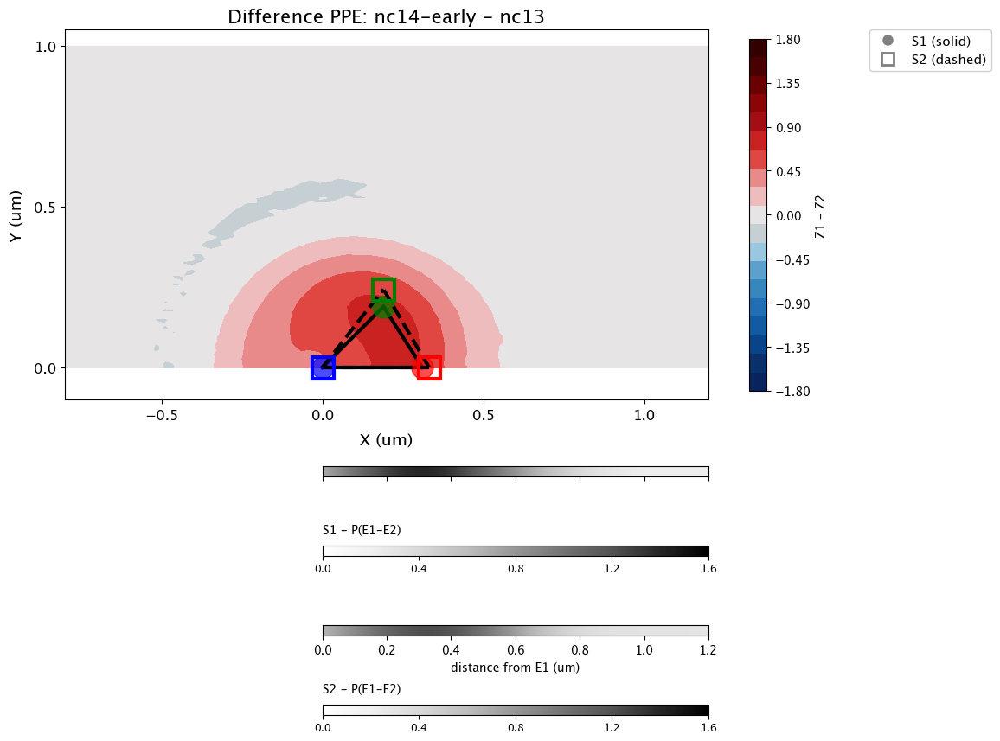


Comparison: PPE nc14-early vs nc13
Method: BH (FDR) (alpha = 0.05)

Distance            Raw p       Adj. p  Significant
--------------------------------------------------
E2-PPE         5.6536e-03   8.4804e-03          Yes
E1-PPE         1.3158e-03   3.9474e-03          Yes
E1-E2          1.2464e-01   1.2464e-01           No

Simes global p: 3.9474e-03
Bonferroni global p: 3.9474e-03
Any significant? True


In [72]:
# PPE: nc14-early vs nc13
plot_difference_contour_with_e1e2_pdf(
    Z_weighted_nc14_early_ppe, X_grid_nc14_early_ppe, Y_grid_nc14_early_ppe,
    Z_weighted_nc13_ppe, X_grid_nc13_ppe, Y_grid_nc13_ppe,
    E1_ppe_nc14_early, E2_ppe_nc14_early, PPE_ppe_nc14_early,
    E1_ppe_nc13, E2_ppe_nc13, PPE_ppe_nc13,
    ppe_kde_results_e1_e2['nc14-early']['x'], ppe_kde_results_e1_e2['nc14-early']['y'],
    ppe_kde_results_e1_e2['nc13']['x'], ppe_kde_results_e1_e2['nc13']['y'],      
    title="Difference PPE: nc14-early - nc13"
)

# KS test with FDR correction
res = ks_three_from_frames(
    dfA_d1=PPE_E2_PPE_nc14_early, dfA_d2=PPE_E1_PPE_nc14_early, dfA_d3=PPE_E1_E2_nc14_early,
    dfB_d1=PPE_E2_PPE_nc13, dfB_d2=PPE_E1_PPE_nc13, dfB_d3=PPE_E1_E2_nc13,
    col_d1="E2-PPE distance (um)", col_d2="E1-PPE distance (um)", col_d3="E1-E2 distance (um)",
    alpha=0.05, method="BH"
)
print_ks_three_results(res, "PPE nc14-early vs nc13")

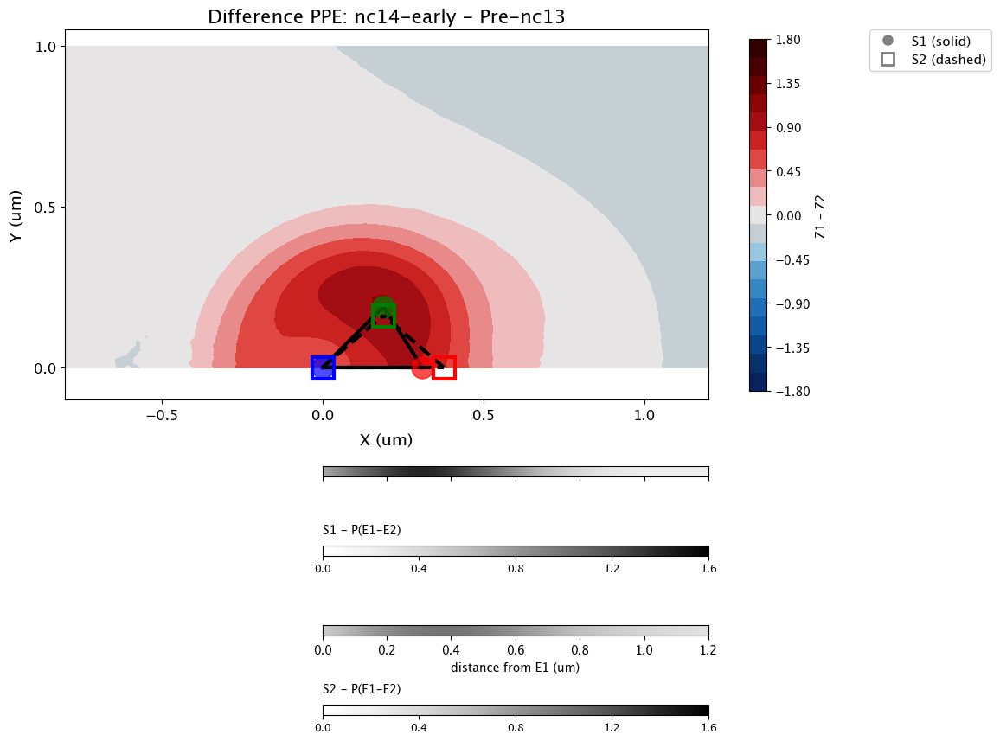

In [73]:
# PPE: nc14-early vs Pre-nc13
plot_difference_contour_with_e1e2_pdf(
    Z_weighted_nc14_early_ppe, X_grid_nc14_early_ppe, Y_grid_nc14_early_ppe,
    Z_weighted_pre_nc13_ppe, X_grid_pre_nc13_ppe, Y_grid_pre_nc13_ppe,
    E1_ppe_nc14_early, E2_ppe_nc14_early, PPE_ppe_nc14_early,
    E1_ppe_pre_nc13, E2_ppe_pre_nc13, PPE_ppe_pre_nc13,
    ppe_kde_results_e1_e2['nc14-early']['x'], ppe_kde_results_e1_e2['nc14-early']['y'],
    ppe_kde_results_e1_e2['Pre-nc13']['x'], ppe_kde_results_e1_e2['Pre-nc13']['y'],      
    title="Difference PPE: nc14-early - Pre-nc13"
);

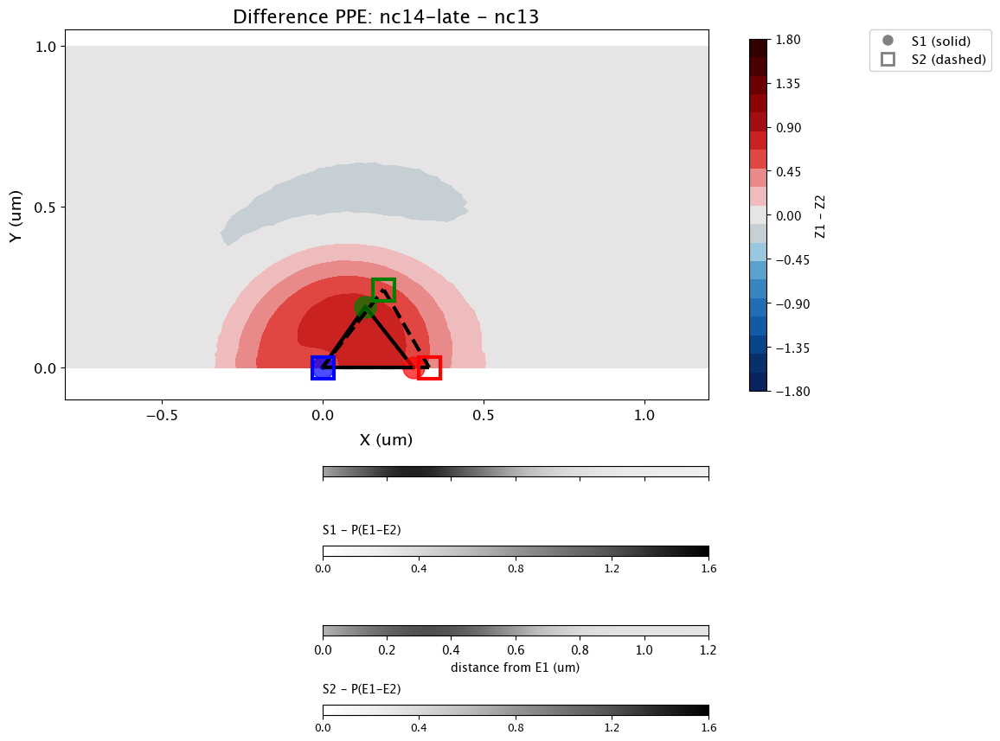

In [74]:
# PPE: nc14-late vs nc13
plot_difference_contour_with_e1e2_pdf(
    Z_weighted_nc14_late_ppe, X_grid_nc14_late_ppe, Y_grid_nc14_late_ppe,
    Z_weighted_nc13_ppe, X_grid_nc13_ppe, Y_grid_nc13_ppe,
    E1_ppe_nc14_late, E2_ppe_nc14_late, PPE_ppe_nc14_late,
    E1_ppe_nc13, E2_ppe_nc13, PPE_ppe_nc13,
    ppe_kde_results_e1_e2['nc14-late']['x'], ppe_kde_results_e1_e2['nc14-late']['y'],
    ppe_kde_results_e1_e2['nc13']['x'], ppe_kde_results_e1_e2['nc13']['y'],      
    title="Difference PPE: nc14-late - nc13"
);

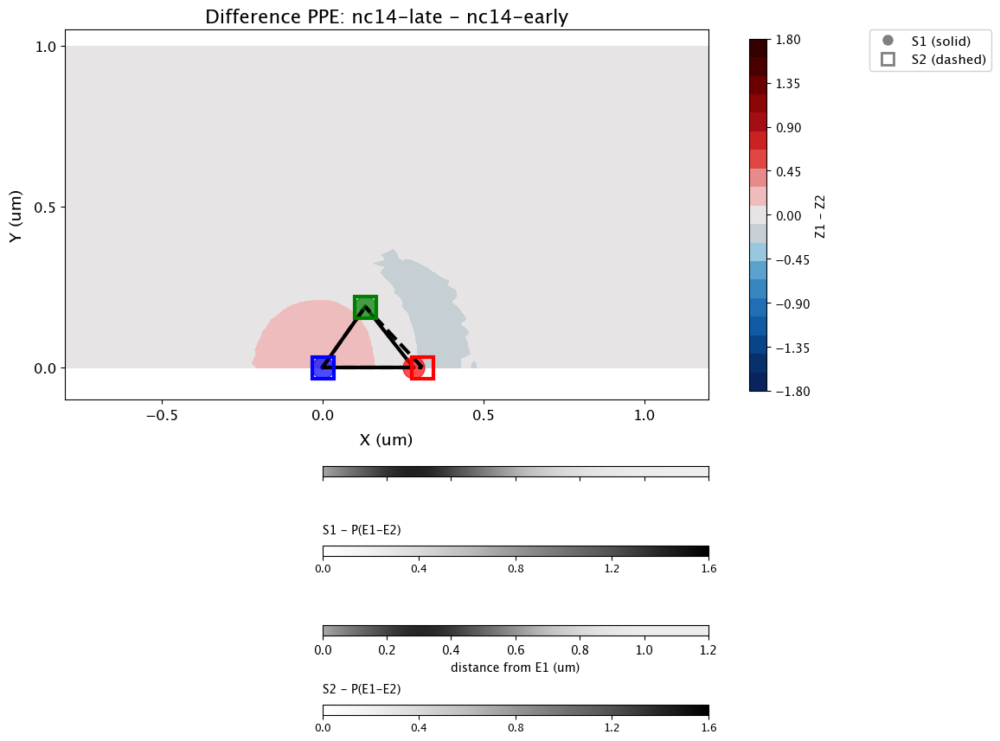


Comparison: PPE nc14-late vs nc14-early
Method: BH (FDR) (alpha = 0.05)

Distance            Raw p       Adj. p  Significant
--------------------------------------------------
E2-PPE         7.9656e-01   8.1885e-01           No
E1-PPE         1.0982e-01   3.2945e-01           No
E1-E2          8.1885e-01   8.1885e-01           No

Simes global p: 3.2945e-01
Bonferroni global p: 3.2945e-01
Any significant? False


In [75]:
# PPE: nc14-late vs nc14-early
plot_difference_contour_with_e1e2_pdf(
    Z_weighted_nc14_late_ppe, X_grid_nc14_late_ppe, Y_grid_nc14_late_ppe,
    Z_weighted_nc14_early_ppe, X_grid_nc14_early_ppe, Y_grid_nc14_early_ppe,
    E1_ppe_nc14_late, E2_ppe_nc14_late, PPE_ppe_nc14_late,
    E1_ppe_nc14_early, E2_ppe_nc14_early, PPE_ppe_nc14_late,
    ppe_kde_results_e1_e2['nc14-late']['x'], ppe_kde_results_e1_e2['nc14-late']['y'],
    ppe_kde_results_e1_e2['nc14-early']['x'], ppe_kde_results_e1_e2['nc14-early']['y'],      
    title="Difference PPE: nc14-late - nc14-early"
);

# KS test with FDR correction
res = ks_three_from_frames(
    dfA_d1=PPE_E2_PPE_nc14_late, dfA_d2=PPE_E1_PPE_nc14_late, dfA_d3=PPE_E1_E2_nc14_late,
    dfB_d1=PPE_E2_PPE_nc14_early, dfB_d2=PPE_E1_PPE_nc14_early, dfB_d3=PPE_E1_E2_nc14_early,
    col_d1="E2-PPE distance (um)", col_d2="E1-PPE distance (um)", col_d3="E1-E2 distance (um)",
    alpha=0.05, method="BH"
)
print_ks_three_results(res, "PPE nc14-late vs nc14-early")

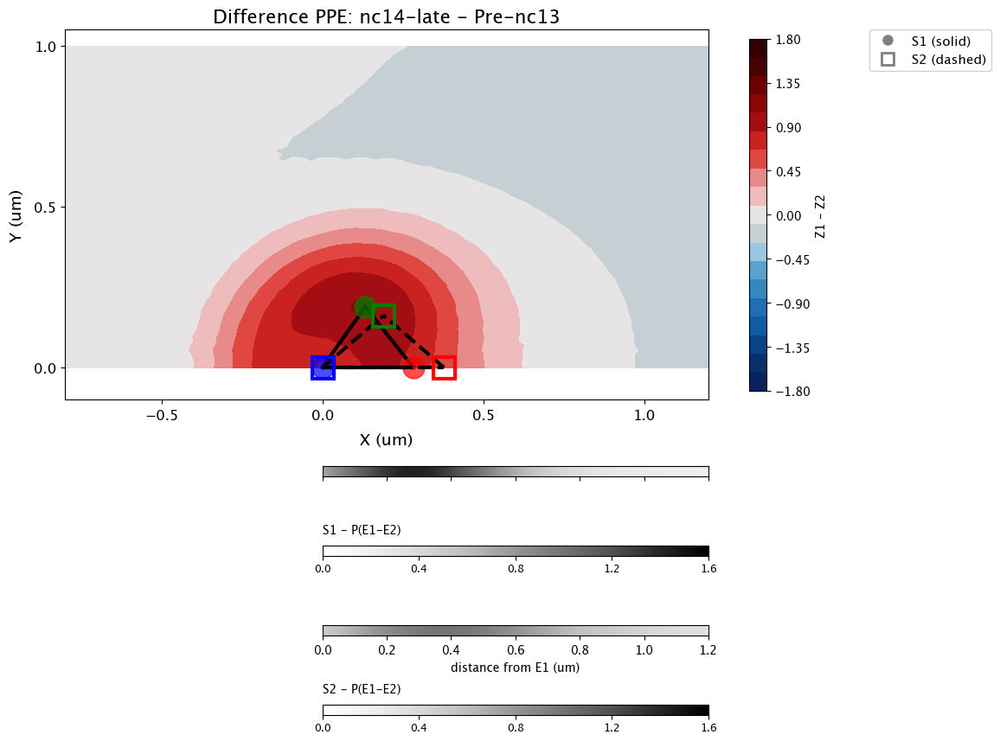

In [76]:
# PPE: nc14-late vs Pre-nc13
plot_difference_contour_with_e1e2_pdf(
    Z_weighted_nc14_late_ppe, X_grid_nc14_late_ppe, Y_grid_nc14_late_ppe,
    Z_weighted_pre_nc13_ppe, X_grid_pre_nc13_ppe, Y_grid_pre_nc13_ppe,
    E1_ppe_nc14_late, E2_ppe_nc14_late, PPE_ppe_nc14_late,
    E1_ppe_pre_nc13, E2_ppe_pre_nc13, PPE_ppe_pre_nc13,
    ppe_kde_results_e1_e2['nc14-late']['x'], ppe_kde_results_e1_e2['nc14-late']['y'],
    ppe_kde_results_e1_e2['Pre-nc13']['x'], ppe_kde_results_e1_e2['Pre-nc13']['y'],      
    title="Difference PPE: nc14-late - Pre-nc13"
);

## 9.6 MiMIC Stage-to-Stage Comparisons (Temporal Dynamics in Mutant)

These plots show how the MiMIC mutant joint probability distribution changes across developmental stages.

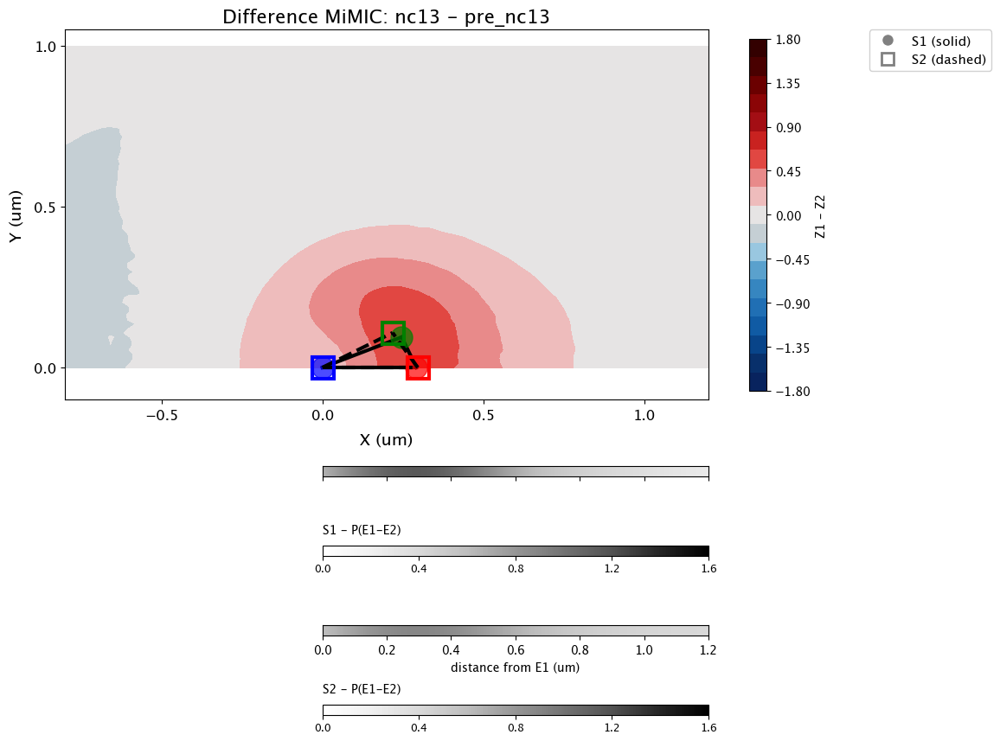


Comparison: MiMIC nc13 vs pre-nc13
Method: BH (FDR) (alpha = 0.05)

Distance            Raw p       Adj. p  Significant
--------------------------------------------------
E2-PPE         8.7886e-03   2.6366e-02          Yes
E1-PPE         4.4912e-01   4.5790e-01           No
E1-E2          4.5790e-01   4.5790e-01           No

Simes global p: 2.6366e-02
Bonferroni global p: 2.6366e-02
Any significant? True


In [77]:
# MiMIC: nc13 - pre nc13
plot_difference_contour_with_e1e2_pdf(
    Z_weighted_nc13_mimic, X_grid_nc13_mimic, Y_grid_nc13_mimic,
    Z_weighted_pre_nc13_mimic, X_grid_pre_nc13_mimic, Y_grid_pre_nc13_mimic,
    E1_mimic_nc13, E2_mimic_nc13, PPE_mimic_nc13,
    E1_mimic_pre_nc13, E2_mimic_pre_nc13, PPE_mimic_pre_nc13,
    mimic_kde_results_e1_e2['nc13']['x'], mimic_kde_results_e1_e2['nc13']['y'],
    mimic_kde_results_e1_e2['Pre-nc13']['x'], mimic_kde_results_e1_e2['Pre-nc13']['y'],    
    title="Difference MiMIC: nc13 - pre_nc13"
);

# KS test with FDR correction
res = ks_three_from_frames(
    dfA_d1=MiMIC_E2_PPE_nc13, dfA_d2=MiMIC_E1_PPE_nc13, dfA_d3=MiMIC_E1_E2_nc13,
    dfB_d1=MiMIC_E2_PPE_nc12, dfB_d2=MiMIC_E1_PPE_nc12, dfB_d3=MiMIC_E1_E2_nc12,
    col_d1="E2-PPE distance (um)", col_d2="E1-PPE distance (um)", col_d3="E1-E2 distance (um)",
    alpha=0.05, method="BH"
)
print_ks_three_results(res, "MiMIC nc13 vs pre-nc13")

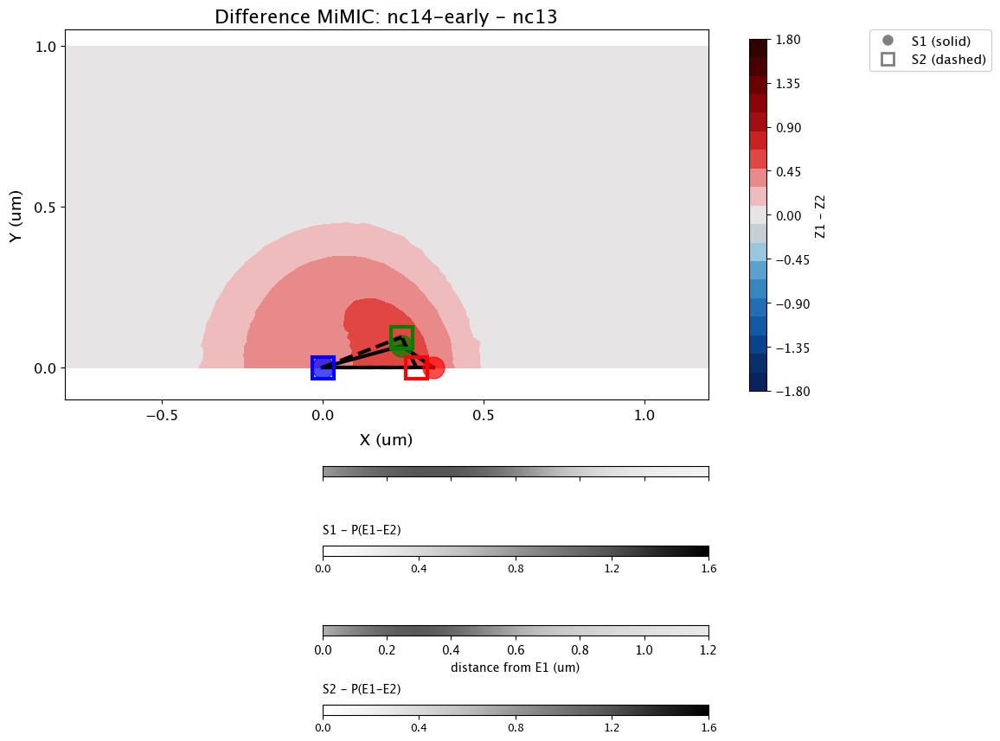


Comparison: MiMIC nc14-early vs nc13
Method: BH (FDR) (alpha = 0.05)

Distance            Raw p       Adj. p  Significant
--------------------------------------------------
E2-PPE         3.6649e-01   3.6649e-01           No
E1-PPE         3.6638e-03   1.0991e-02          Yes
E1-E2          2.0082e-01   3.0123e-01           No

Simes global p: 1.0991e-02
Bonferroni global p: 1.0991e-02
Any significant? True


In [78]:
# MiMIC: nc14-early vs nc13
plot_difference_contour_with_e1e2_pdf(
    Z_weighted_nc14_early_mimic, X_grid_nc14_early_mimic, Y_grid_nc14_early_mimic,
    Z_weighted_nc13_mimic, X_grid_nc13_mimic, Y_grid_nc13_mimic,
    E1_mimic_nc14_early, E2_mimic_nc14_early, PPE_mimic_nc14_early,
    E1_mimic_nc13, E2_mimic_nc13, PPE_mimic_nc13,
    mimic_kde_results_e1_e2['nc14-early']['x'], mimic_kde_results_e1_e2['nc14-early']['y'],
    mimic_kde_results_e1_e2['nc13']['x'], mimic_kde_results_e1_e2['nc13']['y'],    
    title="Difference MiMIC: nc14-early - nc13"
);

# KS test with FDR correction
res = ks_three_from_frames(
    dfA_d1=MiMIC_E2_PPE_nc14_early, dfA_d2=MiMIC_E1_PPE_nc14_early, dfA_d3=MiMIC_E1_E2_nc14_early,
    dfB_d1=MiMIC_E2_PPE_nc13, dfB_d2=MiMIC_E1_PPE_nc13, dfB_d3=MiMIC_E1_E2_nc13,
    col_d1="E2-PPE distance (um)", col_d2="E1-PPE distance (um)", col_d3="E1-E2 distance (um)",
    alpha=0.05, method="BH"
)
print_ks_three_results(res, "MiMIC nc14-early vs nc13")

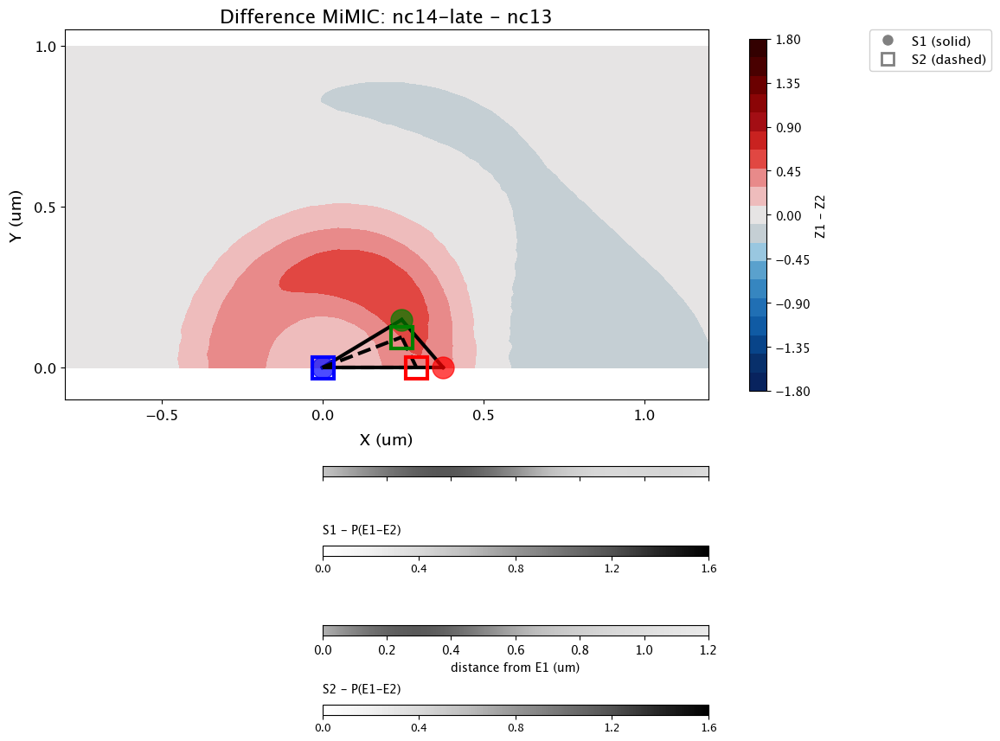

In [79]:
# MiMIC: nc14-late vs nc13
plot_difference_contour_with_e1e2_pdf(
    Z_weighted_nc14_late_mimic, X_grid_nc14_late_mimic, Y_grid_nc14_late_mimic,
    Z_weighted_nc13_mimic, X_grid_nc13_mimic, Y_grid_nc13_mimic,
    E1_mimic_nc14_late, E2_mimic_nc14_late, PPE_mimic_nc14_late,
    E1_mimic_nc13, E2_mimic_nc13, PPE_mimic_nc13,
    mimic_kde_results_e1_e2['nc14-late']['x'], mimic_kde_results_e1_e2['nc14-late']['y'],
    mimic_kde_results_e1_e2['nc13']['x'], mimic_kde_results_e1_e2['nc13']['y'],    
    title="Difference MiMIC: nc14-late - nc13"
);

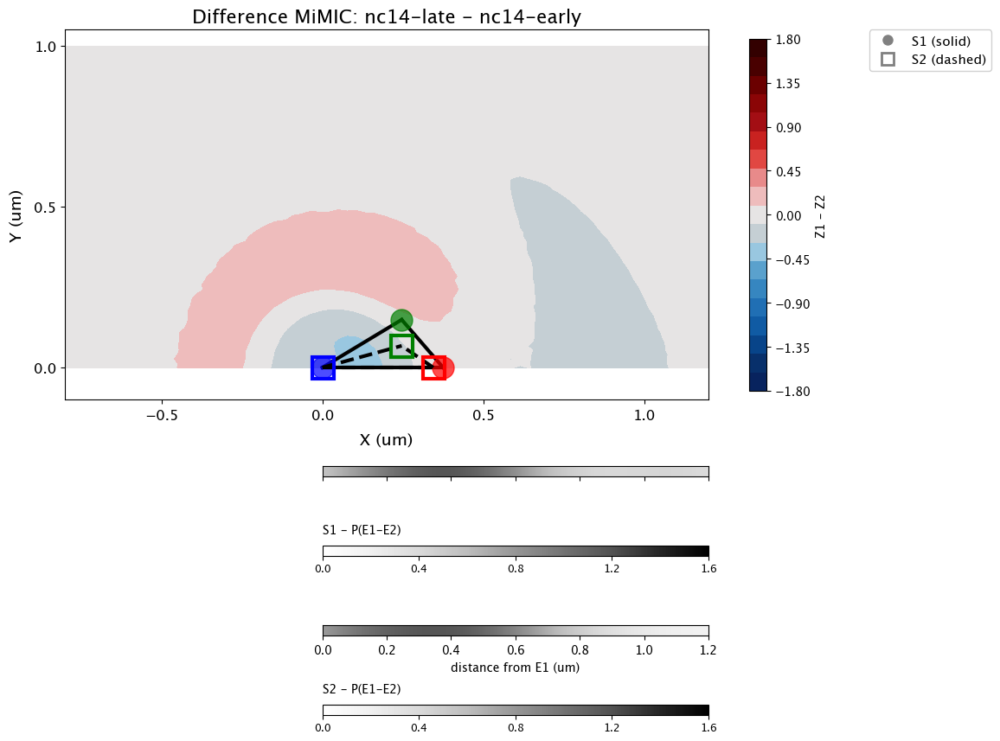


Comparison: MiMIC nc14-late vs nc14-early
Method: BH (FDR) (alpha = 0.05)

Distance            Raw p       Adj. p  Significant
--------------------------------------------------
E2-PPE         4.8736e-02   1.0821e-01           No
E1-PPE         7.2139e-02   1.0821e-01           No
E1-E2          2.7679e-01   2.7679e-01           No

Simes global p: 1.0821e-01
Bonferroni global p: 1.4621e-01
Any significant? False


In [80]:
# MiMIC: nc14-late vs nc14-early
plot_difference_contour_with_e1e2_pdf(
    Z_weighted_nc14_late_mimic, X_grid_nc14_late_mimic, Y_grid_nc14_late_mimic,
    Z_weighted_nc14_early_mimic, X_grid_nc14_early_mimic, Y_grid_nc14_early_mimic,
    E1_mimic_nc14_late, E2_mimic_nc14_late, PPE_mimic_nc14_late,
    E1_mimic_nc14_early, E2_mimic_nc14_early, PPE_mimic_nc14_early,
    mimic_kde_results_e1_e2['nc14-late']['x'], mimic_kde_results_e1_e2['nc14-late']['y'],
    mimic_kde_results_e1_e2['nc14-early']['x'], mimic_kde_results_e1_e2['nc14-early']['y'],    
    title="Difference MiMIC: nc14-late - nc14-early"
);

# KS test with FDR correction
res = ks_three_from_frames(
    dfA_d1=MiMIC_E2_PPE_nc14_late, dfA_d2=MiMIC_E1_PPE_nc14_late, dfA_d3=MiMIC_E1_E2_nc14_late,
    dfB_d1=MiMIC_E2_PPE_nc14_early, dfB_d2=MiMIC_E1_PPE_nc14_early, dfB_d3=MiMIC_E1_E2_nc14_early,
    col_d1="E2-PPE distance (um)", col_d2="E1-PPE distance (um)", col_d3="E1-E2 distance (um)",
    alpha=0.05, method="BH"
)
print_ks_three_results(res, "MiMIC nc14-late vs nc14-early")

## 9.7 Cross-Genotype Cross-Stage Comparisons

These plots compare specific stage-genotype combinations to test hypotheses about developmental timing effects.

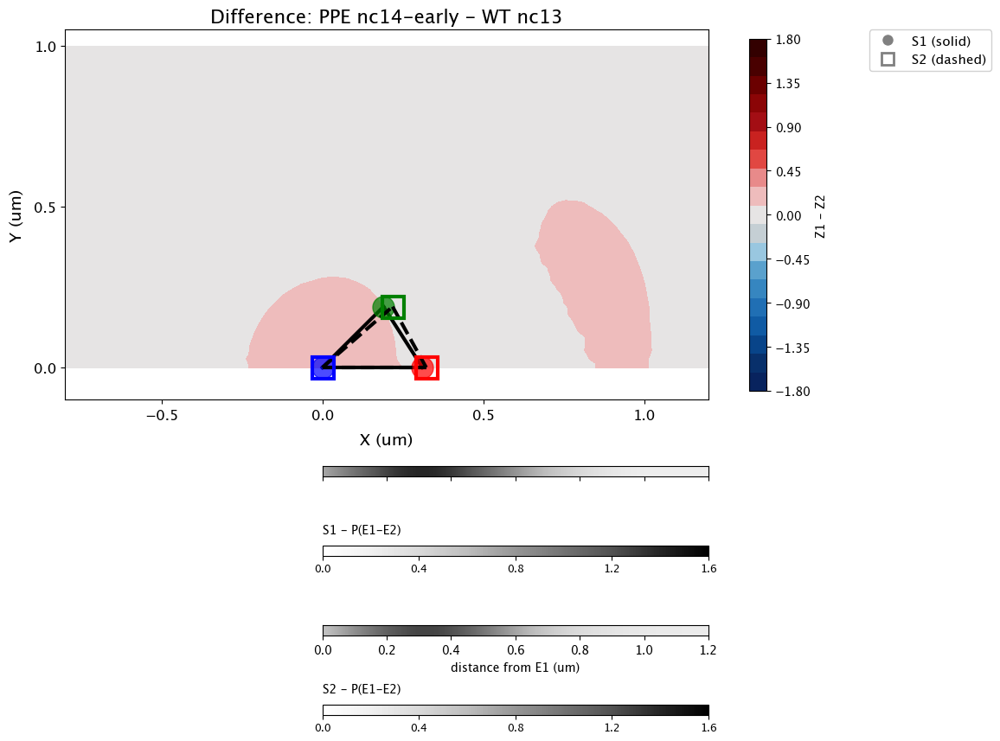

In [81]:
# PPE nc14-early vs WT nc13
# Tests if PPE nc14-early looks like WT nc13 (developmental delay hypothesis)
plot_difference_contour_with_e1e2_pdf(
    Z_weighted_nc14_early_ppe, X_grid_nc14_early_ppe, Y_grid_nc14_early_ppe,
    Z_weighted_nc13_yw, X_grid_nc13_yw, Y_grid_nc13_yw,
    E1_ppe_nc14_early, E2_ppe_nc14_early, PPE_ppe_nc14_early,
    E1_yw_nc13, E2_yw_nc13, PPE_yw_nc13,
    ppe_kde_results_e1_e2['nc14-early']['x'], ppe_kde_results_e1_e2['nc14-early']['y'],
    yw_kde_results_e1_e2['nc13']['x'], yw_kde_results_e1_e2['nc13']['y'],      
    title="Difference: PPE nc14-early - WT nc13"
);

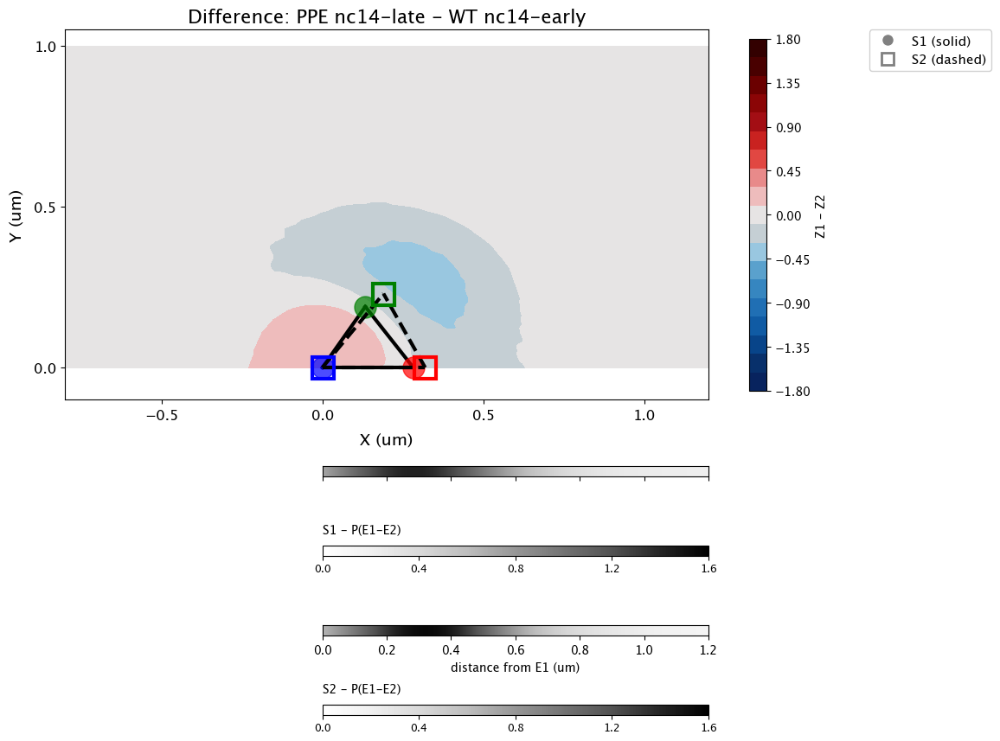

In [82]:
# PPE nc14-late vs WT nc14-early
# Tests if PPE nc14-late looks like WT nc14-early (developmental delay hypothesis)
plot_difference_contour_with_e1e2_pdf(
    Z_weighted_nc14_late_ppe, X_grid_nc14_late_ppe, Y_grid_nc14_late_ppe,
    Z_weighted_nc14_early_yw, X_grid_nc14_early_yw, Y_grid_nc14_early_yw,
    E1_ppe_nc14_late, E2_ppe_nc14_late, PPE_ppe_nc14_late,
    E1_yw_nc14_early, E2_yw_nc14_early, PPE_yw_nc14_early,
    ppe_kde_results_e1_e2['nc14-late']['x'], ppe_kde_results_e1_e2['nc14-late']['y'],
    yw_kde_results_e1_e2['nc14-early']['x'], yw_kde_results_e1_e2['nc14-early']['y'],                    
    title="Difference: PPE nc14-late - WT nc14-early"
);

---

# Section X: Anterior vs Posterior (A vs P) Regional Comparison

**Corresponds to Figure 7 in the paper.**

This section compares distance distributions between the **Anterior (A)** and
**Posterior (P)** regions of the embryo. Regional differences in E1-E2 promoter
organization can reveal spatially-varying regulatory mechanisms.

### Data Sources
- `10_03_SR_T3_A_P/YW_distances_A/` - Anterior region measurements
- `10_03_SR_T3_A_P/YW_distances_P/` - Posterior region measurements

### Analysis
1. PDFs for each region across all stages
2. 2D contour plots for each region at each stage
3. Subtraction contours (A - P) to visualize regional differences
4. KS tests with FDR correction comparing A vs P at each stage


## 10.1 Load Anterior and Posterior Data

This function loads distance data from CSV files organized by stage and applies resolution filtering.

In [83]:
def extract_distances_from_folders(base_path, stages):
    """
    Extracts distances (E2-PPE, E1-PPE, and E1-E2) from CSV files across multiple folders for different stages.
    
    Parameters:
        base_path (str): The base path where the stage folders are located.
        stages (list): A list of folder names (stages) to process (e.g., ['Nc12', 'Nc13']).
    
    Returns:
        dict: A dictionary containing DataFrames for each distance type for each stage.
    """
    result = {}
    
    for stage in stages:
        folder_path = os.path.join(base_path, stage)
        csv_files = sorted(glob.glob(os.path.join(folder_path, "*.csv")))
        li = []
        for f in csv_files:
            df = pd.read_csv(f)
            li.append(df)
        
        if not li:
            print(f"No CSV files found in {folder_path} for stage: {stage}")
            continue
        
        stage_distances = pd.concat(li, axis=0, ignore_index=True)
        
        # Extract E2-PPE distances
        left_dist = stage_distances.dropna(subset=['leftDist'])[
            ['Xleft', 'Yleft', 'Zleft', 'Xmiddle', 'Ymiddle', 'Zmiddle',
             'Xright', 'Yright', 'Zright', 'leftDist']
        ].rename(columns={'leftDist': "E2-PPE distance (um)"})
        
        # Extract E1-PPE distances
        right_dist = stage_distances.dropna(subset=['rightDist'])[
            ['Xleft', 'Yleft', 'Zleft', 'Xmiddle', 'Ymiddle', 'Zmiddle',
             'Xright', 'Yright', 'Zright', 'rightDist']
        ].rename(columns={'rightDist': "E1-PPE distance (um)"})
        
        # Extract E1-E2 distances
        left_right_dist = stage_distances.dropna(subset=['leftRightDist'])[
            ['Xleft', 'Yleft', 'Zleft', 'Xmiddle', 'Ymiddle', 'Zmiddle',
             'Xright', 'Yright', 'Zright', 'leftRightDist']
        ].rename(columns={'leftRightDist': "E1-E2 distance (um)"})
        
        result[f'{stage}_E2-PPE'] = left_dist
        result[f'{stage}_E1-PPE'] = right_dist
        result[f'{stage}_E1-E2'] = left_right_dist
    
    return result

def apply_resolution_filtering_AP(distance_data, res_squared):
    """
    Apply resolution filtering to distance data using ellipsoidal distance metric.
    Sets distances below resolution limit to 0.0.
    """
    for key, df in distance_data.items():
        if "E2-PPE" in key:
            for idx, row in df.iterrows():
                if row[["Xleft", "Yleft", "Zleft", "Xmiddle", "Ymiddle", "Zmiddle"]].notna().all():
                    p1 = [row["Xleft"], row["Yleft"], row["Zleft"]]
                    p2 = [row["Xmiddle"], row["Ymiddle"], row["Zmiddle"]]
                    if below_resolution_limit(p1, p2, res_squared):
                        df.at[idx, "E2-PPE distance (um)"] = 0.0
        elif "E1-PPE" in key:
            for idx, row in df.iterrows():
                if row[["Xright", "Yright", "Zright", "Xmiddle", "Ymiddle", "Zmiddle"]].notna().all():
                    p1 = [row["Xright"], row["Yright"], row["Zright"]]
                    p2 = [row["Xmiddle"], row["Ymiddle"], row["Zmiddle"]]
                    if below_resolution_limit(p1, p2, res_squared):
                        df.at[idx, "E1-PPE distance (um)"] = 0.0
        elif "E1-E2" in key:
            for idx, row in df.iterrows():
                if row[["Xleft", "Yleft", "Zleft", "Xright", "Yright", "Zright"]].notna().all():
                    p1 = [row["Xleft"], row["Yleft"], row["Zleft"]]
                    p2 = [row["Xright"], row["Yright"], row["Zright"]]
                    if below_resolution_limit(p1, p2, res_squared):
                        df.at[idx, "E1-E2 distance (um)"] = 0.0
    return distance_data

In [84]:
# Correct path (absolute)                                                                   

base_path_A = '/Volumes/stathopouloslab/nina/Spots_troubleshooting/10_03_SR_T3_A_P/YW_distances_A/'       
base_path_P = '/Volumes/stathopouloslab/nina/Spots_troubleshooting/10_03_SR_T3_A_P/YW_distances_P/'

stages = ['Nc12', 'Nc13', 'Nc14_early', 'Nc14_late']

# Define resolution limits (if not already defined)
res_squared = [0.12**2, 0.12**2, 0.35**2]  # XY: 120nm, Z: 350nm

# Load Anterior data
distance_data_A = extract_distances_from_folders(base_path_A, stages)
distance_data_A = apply_resolution_filtering_AP(distance_data_A, res_squared)

# Load Posterior data
distance_data_P = extract_distances_from_folders(base_path_P, stages)
distance_data_P = apply_resolution_filtering_AP(distance_data_P, res_squared)
distance_data_A = extract_distances_from_folders(base_path_A, stages)
distance_data_A = apply_resolution_filtering_AP(distance_data_A, res_squared)

# Extract individual DataFrames for Anterior
YW_E2_PPE_nc12_A = distance_data_A['Nc12_E2-PPE']
YW_E1_PPE_nc12_A = distance_data_A['Nc12_E1-PPE']
YW_E1_E2_nc12_A = distance_data_A['Nc12_E1-E2']

YW_E2_PPE_nc13_A = distance_data_A['Nc13_E2-PPE']
YW_E1_PPE_nc13_A = distance_data_A['Nc13_E1-PPE']
YW_E1_E2_nc13_A = distance_data_A['Nc13_E1-E2']

YW_E2_PPE_nc14_early_A = distance_data_A['Nc14_early_E2-PPE']
YW_E1_PPE_nc14_early_A = distance_data_A['Nc14_early_E1-PPE']
YW_E1_E2_nc14_early_A = distance_data_A['Nc14_early_E1-E2']

YW_E2_PPE_nc14_late_A = distance_data_A['Nc14_late_E2-PPE']
YW_E1_PPE_nc14_late_A = distance_data_A['Nc14_late_E1-PPE']
YW_E1_E2_nc14_late_A = distance_data_A['Nc14_late_E1-E2']

print("Anterior data loaded successfully")
print(f"  Pre-nc13: E2-PPE n={len(YW_E2_PPE_nc12_A)}, E1-PPE n={len(YW_E1_PPE_nc12_A)}, E1-E2 n={len(YW_E1_E2_nc12_A)}")
print(f"  nc13: E2-PPE n={len(YW_E2_PPE_nc13_A)}, E1-PPE n={len(YW_E1_PPE_nc13_A)}, E1-E2 n={len(YW_E1_E2_nc13_A)}")
print(f"  nc14-early: E2-PPE n={len(YW_E2_PPE_nc14_early_A)}, E1-PPE n={len(YW_E1_PPE_nc14_early_A)}, E1-E2 n={len(YW_E1_E2_nc14_early_A)}")
print(f"  nc14-late: E2-PPE n={len(YW_E2_PPE_nc14_late_A)}, E1-PPE n={len(YW_E1_PPE_nc14_late_A)}, E1-E2 n={len(YW_E1_E2_nc14_late_A)}")

Anterior data loaded successfully
  Pre-nc13: E2-PPE n=83, E1-PPE n=122, E1-E2 n=76
  nc13: E2-PPE n=111, E1-PPE n=248, E1-E2 n=117
  nc14-early: E2-PPE n=111, E1-PPE n=200, E1-E2 n=107
  nc14-late: E2-PPE n=160, E1-PPE n=316, E1-E2 n=171


In [85]:
distance_data_P = extract_distances_from_folders(base_path_P, stages)
distance_data_P = apply_resolution_filtering_AP(distance_data_P, res_squared)

# Extract individual DataFrames for Posterior
YW_E2_PPE_nc12_P = distance_data_P['Nc12_E2-PPE']
YW_E1_PPE_nc12_P = distance_data_P['Nc12_E1-PPE']
YW_E1_E2_nc12_P = distance_data_P['Nc12_E1-E2']

YW_E2_PPE_nc13_P = distance_data_P['Nc13_E2-PPE']
YW_E1_PPE_nc13_P = distance_data_P['Nc13_E1-PPE']
YW_E1_E2_nc13_P = distance_data_P['Nc13_E1-E2']

YW_E2_PPE_nc14_early_P = distance_data_P['Nc14_early_E2-PPE']
YW_E1_PPE_nc14_early_P = distance_data_P['Nc14_early_E1-PPE']
YW_E1_E2_nc14_early_P = distance_data_P['Nc14_early_E1-E2']

YW_E2_PPE_nc14_late_P = distance_data_P['Nc14_late_E2-PPE']
YW_E1_PPE_nc14_late_P = distance_data_P['Nc14_late_E1-PPE']
YW_E1_E2_nc14_late_P = distance_data_P['Nc14_late_E1-E2']

print("Posterior data loaded successfully")
print(f"  Pre-nc13: E2-PPE n={len(YW_E2_PPE_nc12_P)}, E1-PPE n={len(YW_E1_PPE_nc12_P)}, E1-E2 n={len(YW_E1_E2_nc12_P)}")
print(f"  nc13: E2-PPE n={len(YW_E2_PPE_nc13_P)}, E1-PPE n={len(YW_E1_PPE_nc13_P)}, E1-E2 n={len(YW_E1_E2_nc13_P)}")
print(f"  nc14-early: E2-PPE n={len(YW_E2_PPE_nc14_early_P)}, E1-PPE n={len(YW_E1_PPE_nc14_early_P)}, E1-E2 n={len(YW_E1_E2_nc14_early_P)}")
print(f"  nc14-late: E2-PPE n={len(YW_E2_PPE_nc14_late_P)}, E1-PPE n={len(YW_E1_PPE_nc14_late_P)}, E1-E2 n={len(YW_E1_E2_nc14_late_P)}")

Posterior data loaded successfully
  Pre-nc13: E2-PPE n=64, E1-PPE n=124, E1-E2 n=62
  nc13: E2-PPE n=149, E1-PPE n=258, E1-E2 n=139
  nc14-early: E2-PPE n=125, E1-PPE n=237, E1-E2 n=104
  nc14-late: E2-PPE n=197, E1-PPE n=359, E1-E2 n=197


## 10.2 Anterior Region PDFs

1D probability density functions for each distance type across developmental stages in the Anterior region.

In [86]:
# Anterior E1-PPE PDFs
pdf_peaks_e1_ppe_A, kde_results_e1_ppe_A = generate_plots(
    dataframes=[YW_E1_PPE_nc12_A, YW_E1_PPE_nc13_A, YW_E1_PPE_nc14_early_A, YW_E1_PPE_nc14_late_A],
    distance_column="E1-PPE distance (um)",
    phenotype_label="wild-type ANTERIOR",
    x_axis_label="E1-PPE (μm)"
)
pdf_peaks_e1_ppe_A

{'PDF_Pre-nc13': np.float64(0.250768524933996),
 'PDF_nc13': np.float64(0.2634752519505272),
 'PDF_nc14-early': np.float64(0.29018057929476176),
 'PDF_nc14-late': np.float64(0.24896117370536716)}

In [87]:
# Anterior E2-PPE PDFs
pdf_peaks_e2_ppe_A, kde_results_e2_ppe_A = generate_plots(
    dataframes=[YW_E2_PPE_nc12_A, YW_E2_PPE_nc13_A, YW_E2_PPE_nc14_early_A, YW_E2_PPE_nc14_late_A],
    distance_column="E2-PPE distance (um)",
    phenotype_label="wild-type ANTERIOR",
    x_axis_label="E2-PPE (μm)"
)
pdf_peaks_e2_ppe_A

{'PDF_Pre-nc13': np.float64(0.30753645548474173),
 'PDF_nc13': np.float64(0.3164290465475425),
 'PDF_nc14-early': np.float64(0.3186091233629584),
 'PDF_nc14-late': np.float64(0.3380055972617396)}

In [88]:
# Anterior E1-E2 PDFs
pdf_peaks_e1_e2_A, kde_results_e1_e2_A = generate_plots(
    dataframes=[YW_E1_E2_nc12_A, YW_E1_E2_nc13_A, YW_E1_E2_nc14_early_A, YW_E1_E2_nc14_late_A],
    distance_column="E1-E2 distance (um)",
    phenotype_label="wild-type ANTERIOR",
    x_axis_label="E1-E2 (μm)"
)
pdf_peaks_e1_e2_A

{'PDF_Pre-nc13': np.float64(0.30343771503674954),
 'PDF_nc13': np.float64(0.3176354209463884),
 'PDF_nc14-early': np.float64(0.35251570010678324),
 'PDF_nc14-late': np.float64(0.32013461514944735)}

## 10.3 Posterior Region PDFs

1D probability density functions for each distance type across developmental stages in the Posterior region.

In [89]:
# Posterior E1-PPE PDFs
pdf_peaks_e1_ppe_P, kde_results_e1_ppe_P = generate_plots(
    dataframes=[YW_E1_PPE_nc12_P, YW_E1_PPE_nc13_P, YW_E1_PPE_nc14_early_P, YW_E1_PPE_nc14_late_P],
    distance_column="E1-PPE distance (um)",
    phenotype_label="wild-type POSTERIOR",
    x_axis_label="E1-PPE (μm)"
)
pdf_peaks_e1_ppe_P

{'PDF_Pre-nc13': np.float64(0.36986806768901676),
 'PDF_nc13': np.float64(0.2759027963870705),
 'PDF_nc14-early': np.float64(0.2438591113339796),
 'PDF_nc14-late': np.float64(0.25219023640678156)}

In [90]:
# Posterior E2-PPE PDFs
pdf_peaks_e2_ppe_P, kde_results_e2_ppe_P = generate_plots(
    dataframes=[YW_E2_PPE_nc12_P, YW_E2_PPE_nc13_P, YW_E2_PPE_nc14_early_P, YW_E2_PPE_nc14_late_P],
    distance_column="E2-PPE distance (um)",
    phenotype_label="wild-type POSTERIOR",
    x_axis_label="E2-PPE (μm)"
)
pdf_peaks_e2_ppe_P

{'PDF_Pre-nc13': np.float64(0.9192545592464489),
 'PDF_nc13': np.float64(0.3237589025404643),
 'PDF_nc14-early': np.float64(0.3718304774043324),
 'PDF_nc14-late': np.float64(0.35096739357923307)}

In [91]:
# Posterior E1-E2 PDFs
pdf_peaks_e1_e2_P, kde_results_e1_e2_P = generate_plots(
    dataframes=[YW_E1_E2_nc12_P, YW_E1_E2_nc13_P, YW_E1_E2_nc14_early_P, YW_E1_E2_nc14_late_P],
    distance_column="E1-E2 distance (um)",
    phenotype_label="wild-type POSTERIOR",
    x_axis_label="E1-E2 (μm)"
)
pdf_peaks_e1_e2_P

{'PDF_Pre-nc13': np.float64(0.4094904446812824),
 'PDF_nc13': np.float64(0.3501955112609282),
 'PDF_nc14-early': np.float64(0.2718416179165434),
 'PDF_nc14-late': np.float64(0.32207049543781613)}

## 10.4 Anterior Region 2D Contour Plots

2D joint probability contours for the Anterior region at each developmental stage.

Surface integral: 1.0000


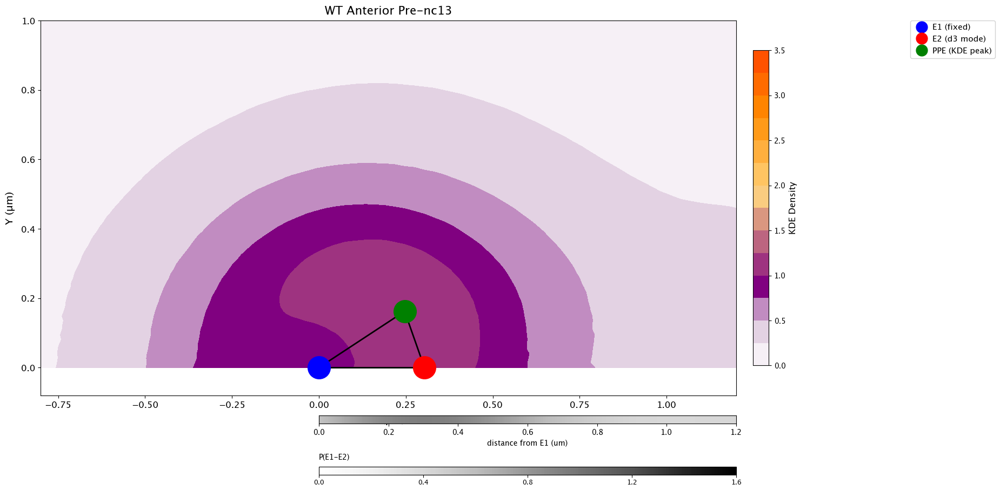

In [92]:
# Anterior Pre-nc13 contour
# NOTE: Argument order is d1=E2-PPE, d2=E1-PPE for correct triangle geometry
Z_weighted_pre_nc13_yw_A, X_grid_pre_nc13_yw_A, Y_grid_pre_nc13_yw_A, E1_yw_pre_nc13_A, E2_yw_pre_nc13_A, PPE_yw_pre_nc13_A = plot_contour_stage(
    kde_results_e2_ppe_A['Pre-nc13']['x'], kde_results_e1_ppe_A['Pre-nc13']['x'], 
    kde_results_e2_ppe_A['Pre-nc13']['y'], kde_results_e1_ppe_A['Pre-nc13']['y'], 
    kde_results_e1_e2_A['Pre-nc13']['x'], kde_results_e1_e2_A['Pre-nc13']['y'],
    title="WT Anterior Pre-nc13", show_legend=True, num_samples=10, vmin=0, vmax=3.5
)

Surface integral: 1.0000


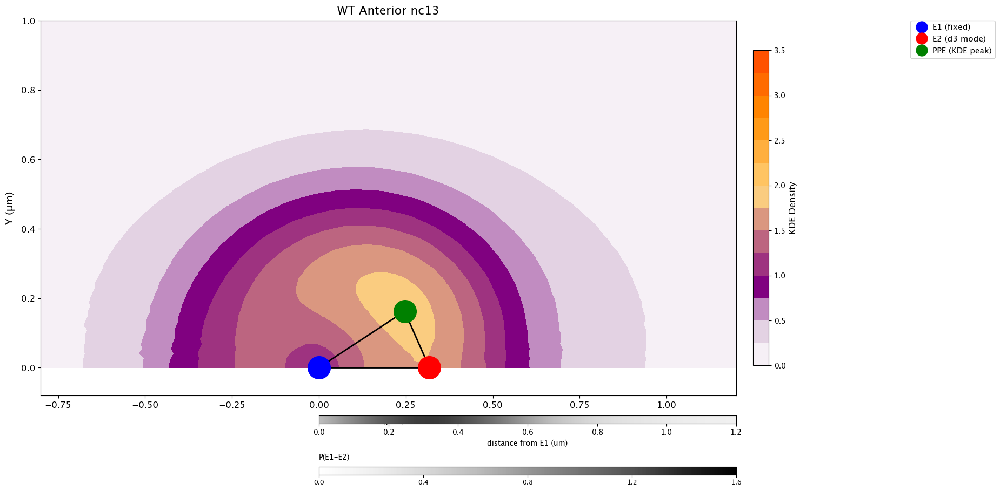

In [93]:
# Anterior nc13 contour
Z_weighted_nc13_yw_A, X_grid_nc13_yw_A, Y_grid_nc13_yw_A, E1_yw_nc13_A, E2_yw_nc13_A, PPE_yw_nc13_A = plot_contour_stage(
    kde_results_e2_ppe_A['nc13']['x'], kde_results_e1_ppe_A['nc13']['x'], 
    kde_results_e2_ppe_A['nc13']['y'], kde_results_e1_ppe_A['nc13']['y'], 
    kde_results_e1_e2_A['nc13']['x'], kde_results_e1_e2_A['nc13']['y'],
    title="WT Anterior nc13", show_legend=True, num_samples=10, vmin=0., vmax=3.5
)

Surface integral: 1.0000


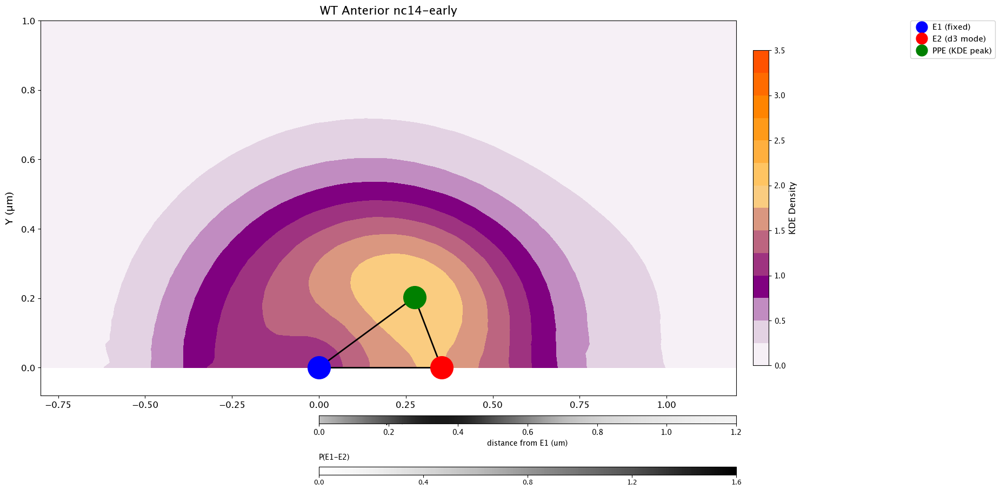

In [94]:
# Anterior nc14-early contour
Z_weighted_nc14_early_yw_A, X_grid_nc14_early_yw_A, Y_grid_nc14_early_yw_A, E1_yw_nc14_early_A, E2_yw_nc14_early_A, PPE_yw_nc14_early_A = plot_contour_stage(
    kde_results_e2_ppe_A['nc14-early']['x'], kde_results_e1_ppe_A['nc14-early']['x'], 
    kde_results_e2_ppe_A['nc14-early']['y'], kde_results_e1_ppe_A['nc14-early']['y'], 
    kde_results_e1_e2_A['nc14-early']['x'], kde_results_e1_e2_A['nc14-early']['y'],
    title="WT Anterior nc14-early", show_legend=True,num_samples=10, vmin=0, vmax=3.5
)

Surface integral: 1.0000


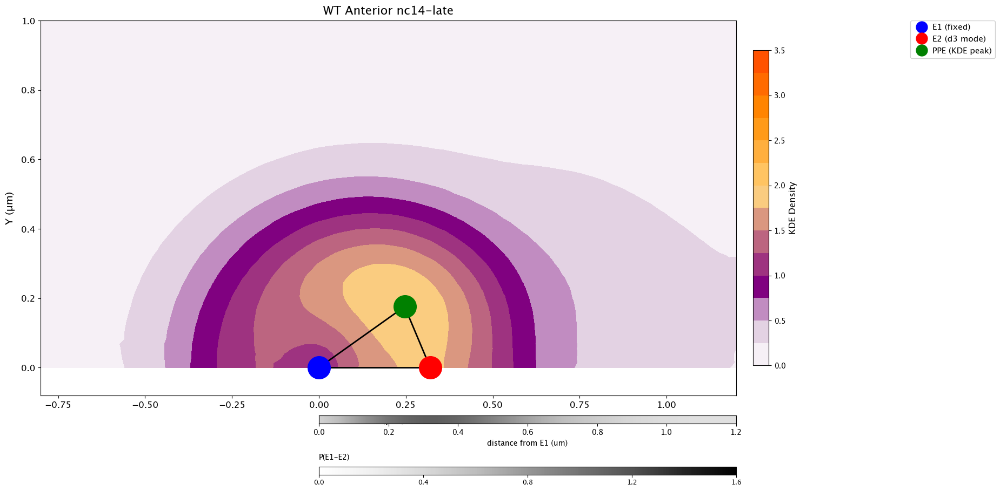

In [95]:
# Anterior nc14-late contour
Z_weighted_nc14_late_yw_A, X_grid_nc14_late_yw_A, Y_grid_nc14_late_yw_A, E1_yw_nc14_late_A, E2_yw_nc14_late_A, PPE_yw_nc14_late_A = plot_contour_stage(
    kde_results_e2_ppe_A['nc14-late']['x'], kde_results_e1_ppe_A['nc14-late']['x'], 
    kde_results_e2_ppe_A['nc14-late']['y'], kde_results_e1_ppe_A['nc14-late']['y'], 
    kde_results_e1_e2_A['nc14-late']['x'], kde_results_e1_e2_A['nc14-late']['y'],
    title="WT Anterior nc14-late", show_legend=True, num_samples=10, vmin=0, vmax=3.5
)

## 10.5 Posterior Region 2D Contour Plots

2D joint probability contours for the Posterior region at each developmental stage.

Surface integral: 1.0000


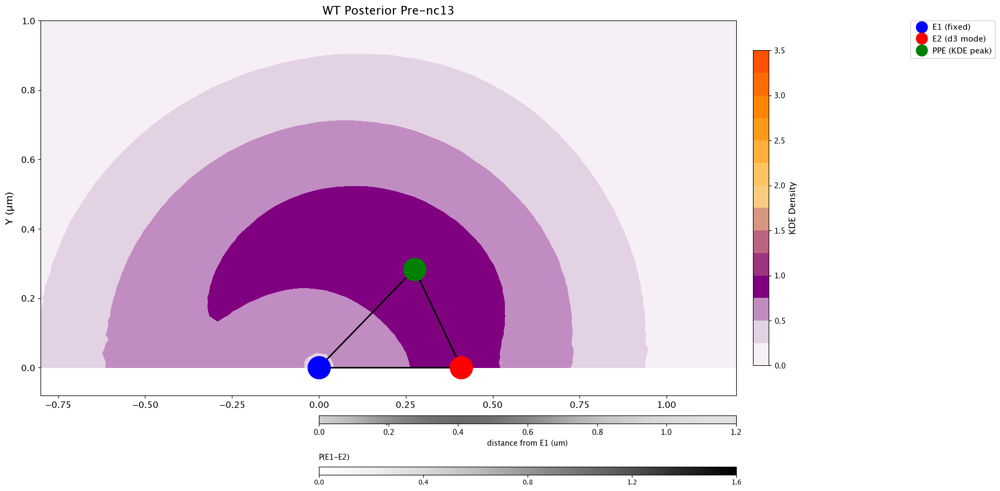

In [96]:
# Posterior Pre-nc13 contour
Z_weighted_pre_nc13_yw_P, X_grid_pre_nc13_yw_P, Y_grid_pre_nc13_yw_P, E1_yw_pre_nc13_P, E2_yw_pre_nc13_P, PPE_yw_pre_nc13_P = plot_contour_stage(
    kde_results_e2_ppe_P['Pre-nc13']['x'], kde_results_e1_ppe_P['Pre-nc13']['x'], 
    kde_results_e2_ppe_P['Pre-nc13']['y'], kde_results_e1_ppe_P['Pre-nc13']['y'], 
    kde_results_e1_e2_P['Pre-nc13']['x'], kde_results_e1_e2_P['Pre-nc13']['y'],
    title="WT Posterior Pre-nc13", show_legend=True, num_samples=10, vmin=0, vmax=3.5
)

Surface integral: 1.0000


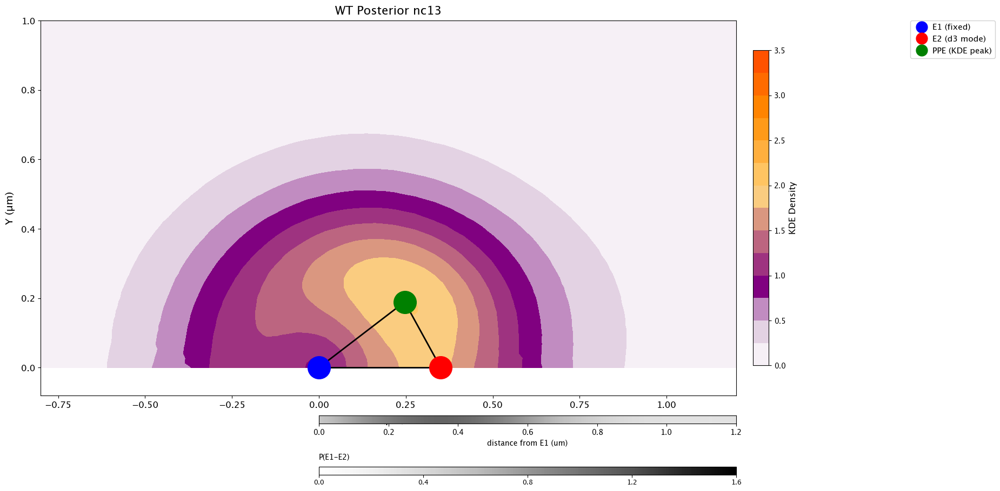

In [97]:
# Posterior nc13 contour
Z_weighted_nc13_yw_P, X_grid_nc13_yw_P, Y_grid_nc13_yw_P, E1_yw_nc13_P, E2_yw_nc13_P, PPE_yw_nc13_P = plot_contour_stage(
    kde_results_e2_ppe_P['nc13']['x'], kde_results_e1_ppe_P['nc13']['x'], 
    kde_results_e2_ppe_P['nc13']['y'], kde_results_e1_ppe_P['nc13']['y'], 
    kde_results_e1_e2_P['nc13']['x'], kde_results_e1_e2_P['nc13']['y'],
    title="WT Posterior nc13", show_legend=True, num_samples=10, vmin=0., vmax=3.5
)

Surface integral: 1.0000


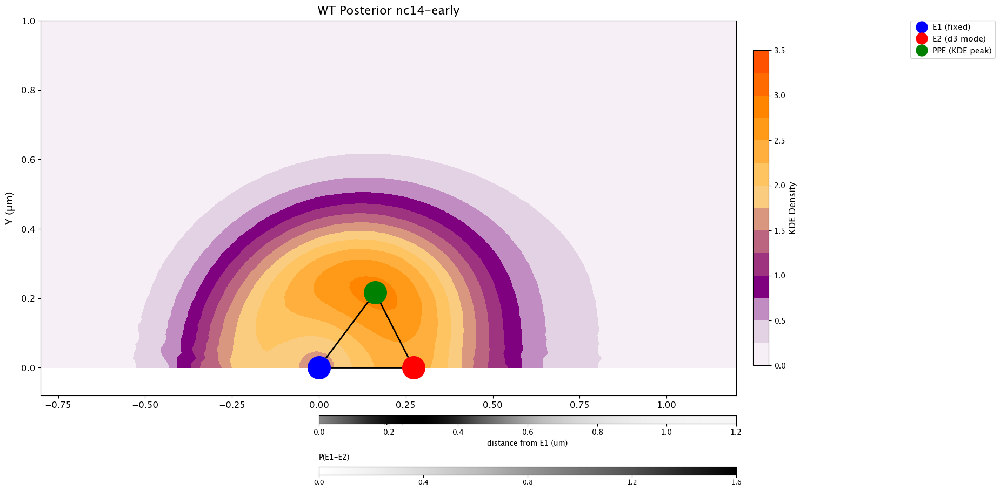

In [98]:
# Anterior nc14-early contour
Z_weighted_nc14_early_yw_P, X_grid_nc14_early_yw_P, Y_grid_nc14_early_yw_P, E1_yw_nc14_early_P, E2_yw_nc14_early_P, PPE_yw_nc14_early_P = plot_contour_stage(
    kde_results_e2_ppe_P['nc14-early']['x'], kde_results_e1_ppe_P['nc14-early']['x'], 
    kde_results_e2_ppe_P['nc14-early']['y'], kde_results_e1_ppe_P['nc14-early']['y'], 
    kde_results_e1_e2_P['nc14-early']['x'], kde_results_e1_e2_P['nc14-early']['y'],
    title="WT Posterior nc14-early", show_legend=True,num_samples=10, vmin=0, vmax=3.5
)

Surface integral: 1.0000


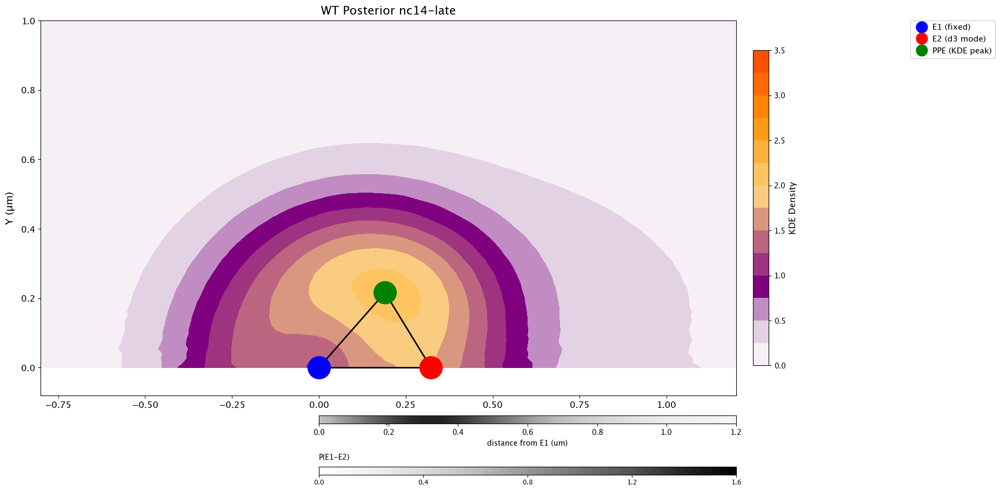

In [99]:
# Anterior nc14-late contour
Z_weighted_nc14_late_yw_P, X_grid_nc14_late_yw_P, Y_grid_nc14_late_yw_P, E1_yw_nc14_late_P, E2_yw_nc14_late_P, PPE_yw_nc14_late_P = plot_contour_stage(
    kde_results_e2_ppe_P['nc14-late']['x'], kde_results_e1_ppe_P['nc14-late']['x'], 
    kde_results_e2_ppe_P['nc14-late']['y'], kde_results_e1_ppe_P['nc14-late']['y'], 
    kde_results_e1_e2_P['nc14-late']['x'], kde_results_e1_e2_P['nc14-late']['y'],
    title="WT Posterior nc14-late", show_legend=True, num_samples=10, vmin=0, vmax=3.5
)

## 10.6 Anterior minus Posterior Subtraction Contours

**Corresponds to Figures 3G-J in the paper.**

These subtraction contours show the difference between Anterior and Posterior
joint probability surfaces at each developmental stage.

Color interpretation:
- **Red/Orange**: Anterior has higher probability density than Posterior
- **Blue**: Posterior has higher probability density than Anterior
- **Gray/White**: Similar probability between regions

This reveals spatial differences in chromatin configuration along the A-P axis,
showing where enhancer-promoter organization differs between regions that will
versus will not activate *sog* transcription.

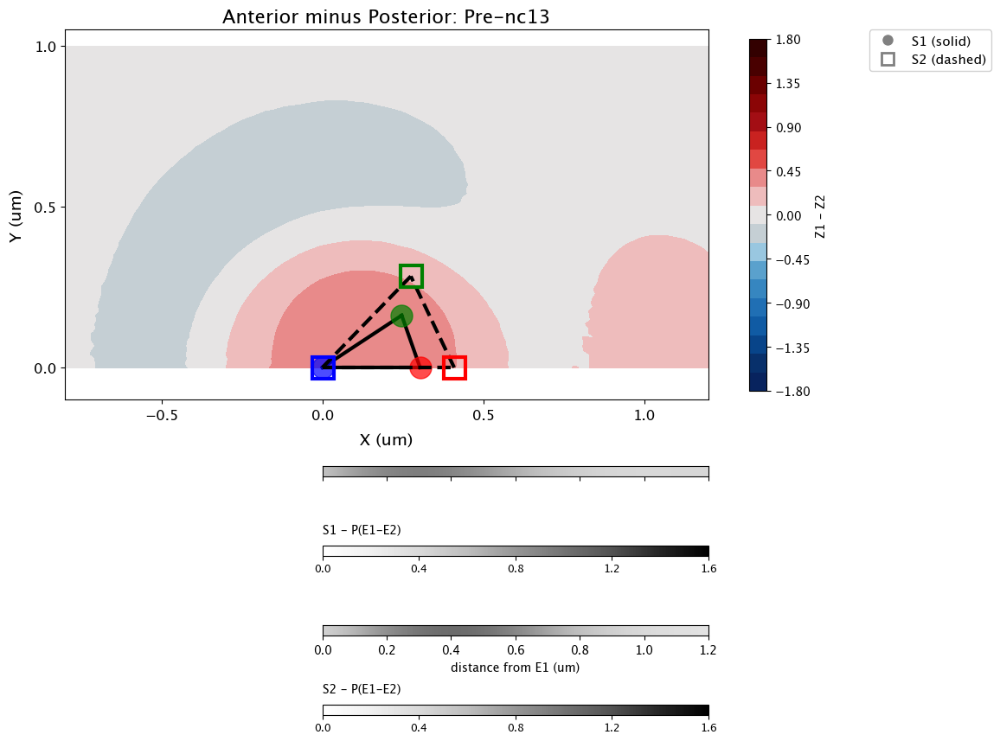


Comparison: Pre-nc13 A vs P
Method: BH (FDR) (alpha = 0.05)

Distance            Raw p       Adj. p  Significant
--------------------------------------------------
E2-PPE         1.2892e-01   1.9338e-01           No
E1-PPE         1.6005e-02   4.8016e-02          Yes
E1-E2          5.4800e-01   5.4800e-01           No

Simes global p: 4.8016e-02
Bonferroni global p: 4.8016e-02
Any significant? True


In [100]:
# A-P subtraction: Pre-nc13 (Anterior - Posterior)
Z_diff_pre_nc13 = plot_difference_contour_with_e1e2_pdf(
    Z_weighted_pre_nc13_yw_A, X_grid_pre_nc13_yw_A, Y_grid_pre_nc13_yw_A,
    Z_weighted_pre_nc13_yw_P, X_grid_pre_nc13_yw_P, Y_grid_pre_nc13_yw_P,
    E1_yw_pre_nc13_A, E2_yw_pre_nc13_A, PPE_yw_pre_nc13_A,
    E1_yw_pre_nc13_P, E2_yw_pre_nc13_P, PPE_yw_pre_nc13_P,
    kde_results_e1_e2_A['Pre-nc13']['x'], kde_results_e1_e2_A['Pre-nc13']['y'],
    kde_results_e1_e2_P['Pre-nc13']['x'], kde_results_e1_e2_P['Pre-nc13']['y'],
    title='Anterior minus Posterior: Pre-nc13',
    vmin=-1.8, vmax=1.8
)

# KS test with FDR correction
res = ks_three_from_frames(
    dfA_d1=YW_E2_PPE_nc12_A, dfA_d2=YW_E1_PPE_nc12_A, dfA_d3=YW_E1_E2_nc12_A,
    dfB_d1=YW_E2_PPE_nc12_P, dfB_d2=YW_E1_PPE_nc12_P, dfB_d3=YW_E1_E2_nc12_P,
    col_d1="E2-PPE distance (um)", col_d2="E1-PPE distance (um)", col_d3="E1-E2 distance (um)",
    alpha=0.05, method="BH"
)
print_ks_three_results(res, "Pre-nc13 A vs P")

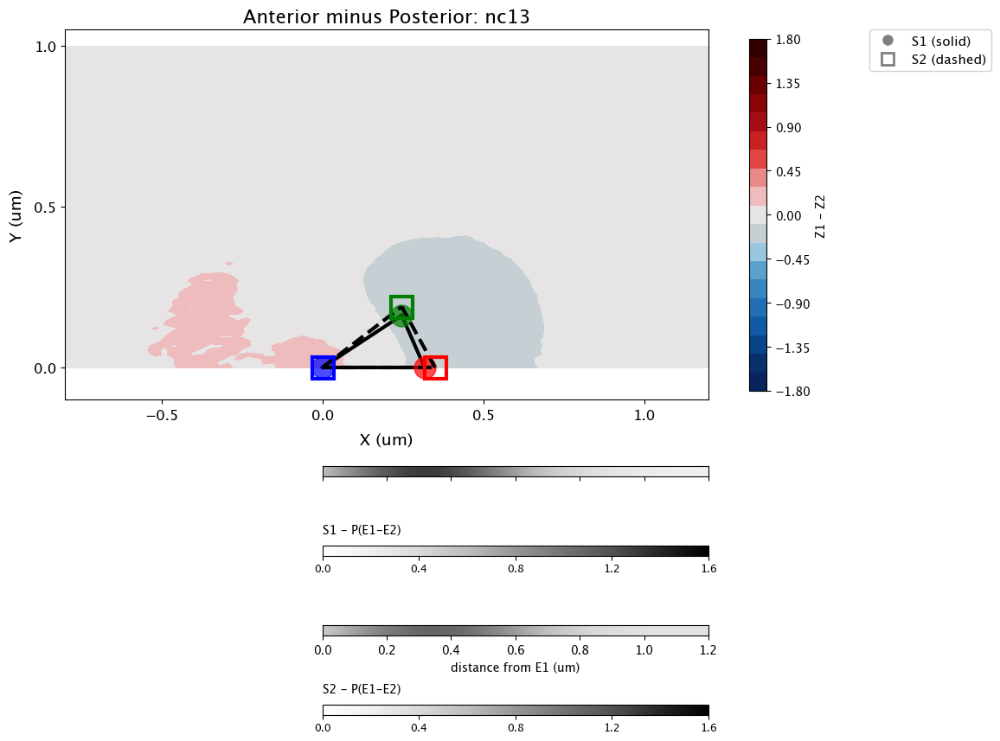


Comparison: nc13 WT vs PPE
Method: BH (FDR) (alpha = 0.05)

Distance            Raw p       Adj. p  Significant
--------------------------------------------------
E2-PPE         7.8401e-01   7.8401e-01           No
E1-PPE         6.3092e-01   7.8401e-01           No
E1-E2          1.9755e-01   5.9265e-01           No

Simes global p: 5.9265e-01
Bonferroni global p: 5.9265e-01
Any significant? False


In [101]:
# A-P subtraction: nc13 (Anterior - Posterior)
Z_diff_nc13 = plot_difference_contour_with_e1e2_pdf(
    Z_weighted_nc13_yw_A, X_grid_nc13_yw_A, Y_grid_nc13_yw_A,
    Z_weighted_nc13_yw_P, X_grid_nc13_yw_P, Y_grid_nc13_yw_P,
    E1_yw_nc13_A, E2_yw_nc13_A, PPE_yw_nc13_A,
    E1_yw_nc13_P, E2_yw_nc13_P, PPE_yw_nc13_P,
    kde_results_e1_e2_A['nc13']['x'], kde_results_e1_e2_A['nc13']['y'],
    kde_results_e1_e2_P['nc13']['x'], kde_results_e1_e2_P['nc13']['y'],
    title='Anterior minus Posterior: nc13',
    vmin=-1.8, vmax=1.8
)

# KS test with FDR correction
res = ks_three_from_frames(
    dfA_d1=YW_E2_PPE_nc13_A, dfA_d2=YW_E1_PPE_nc13_A, dfA_d3=YW_E1_E2_nc13_A,
    dfB_d1=YW_E2_PPE_nc13_P, dfB_d2=YW_E1_PPE_nc13_P, dfB_d3=YW_E1_E2_nc13_P,
    col_d1="E2-PPE distance (um)", col_d2="E1-PPE distance (um)", col_d3="E1-E2 distance (um)",
    alpha=0.05, method="BH"
)
print_ks_three_results(res, "nc13 WT vs PPE")

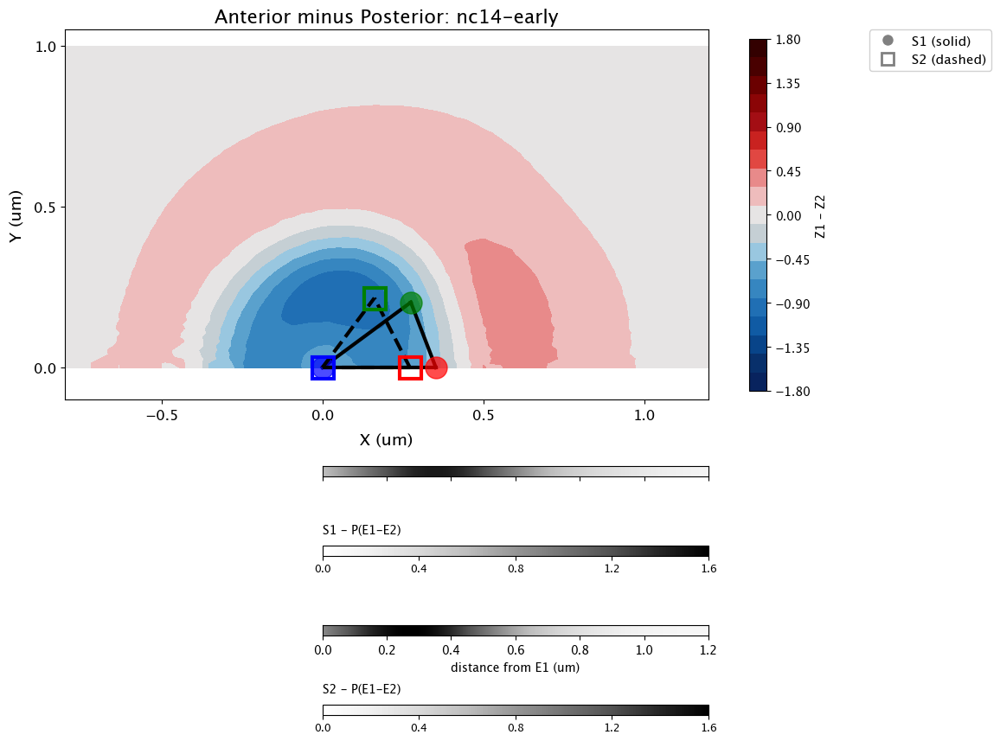


Comparison: nc14_early WT vs PPE
Method: BH (FDR) (alpha = 0.05)

Distance            Raw p       Adj. p  Significant
--------------------------------------------------
E2-PPE         3.6720e-01   3.6720e-01           No
E1-PPE         1.2019e-03   3.6056e-03          Yes
E1-E2          5.8452e-03   8.7679e-03          Yes

Simes global p: 3.6056e-03
Bonferroni global p: 3.6056e-03
Any significant? True


In [102]:
# A-P subtraction: nc14-early (Anterior - Posterior)
Z_diff_nc14_early = plot_difference_contour_with_e1e2_pdf(
    Z_weighted_nc14_early_yw_A, X_grid_nc14_early_yw_A, Y_grid_nc14_early_yw_A,
    Z_weighted_nc14_early_yw_P, X_grid_nc14_early_yw_P, Y_grid_nc14_early_yw_P,
    E1_yw_nc14_early_A, E2_yw_nc14_early_A, PPE_yw_nc14_early_A,
    E1_yw_nc14_early_P, E2_yw_nc14_early_P, PPE_yw_nc14_early_P,
    kde_results_e1_e2_A['nc14-early']['x'], kde_results_e1_e2_A['nc14-early']['y'],
    kde_results_e1_e2_P['nc14-early']['x'], kde_results_e1_e2_P['nc14-early']['y'],
    title='Anterior minus Posterior: nc14-early',
    vmin=-1.8, vmax=1.8
)

# KS test with FDR correction
res = ks_three_from_frames(
    dfA_d1=YW_E2_PPE_nc14_early_A, dfA_d2=YW_E1_PPE_nc14_early_A, dfA_d3=YW_E1_E2_nc14_early_A,
    dfB_d1=YW_E2_PPE_nc14_early_P, dfB_d2=YW_E1_PPE_nc14_early_P, dfB_d3=YW_E1_E2_nc14_early_P,
    col_d1="E2-PPE distance (um)", col_d2="E1-PPE distance (um)", col_d3="E1-E2 distance (um)",
    alpha=0.05, method="BH"
)
print_ks_three_results(res, "nc14_early WT vs PPE")

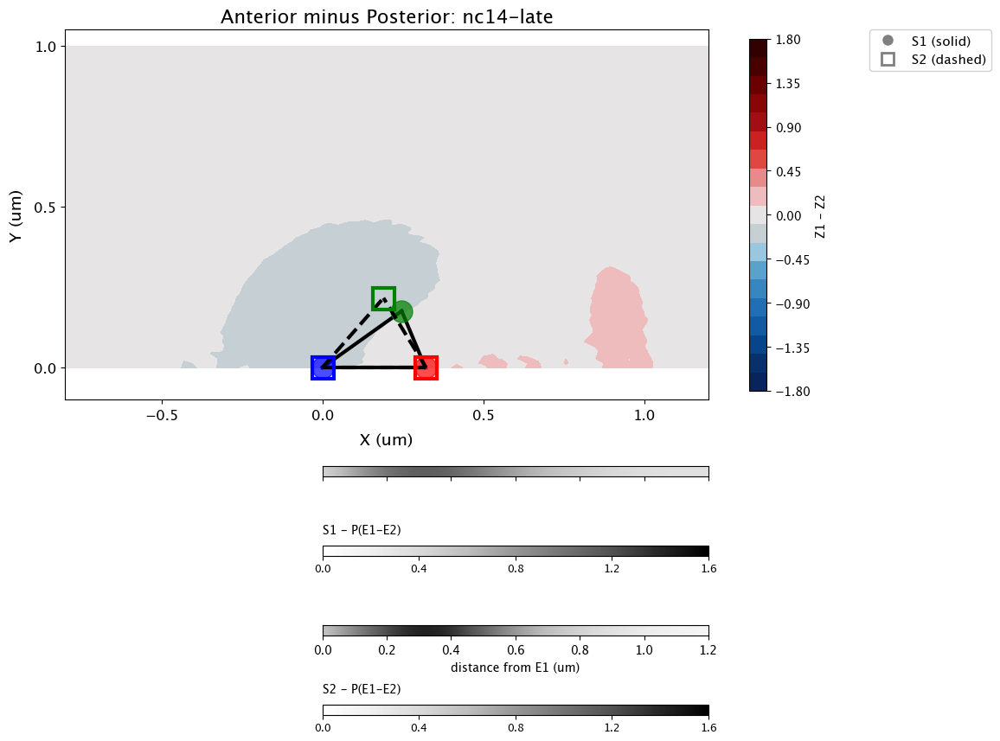


Comparison: nc14_early WT vs PPE
Method: BH (FDR) (alpha = 0.05)

Distance            Raw p       Adj. p  Significant
--------------------------------------------------
E2-PPE         3.3481e-01   5.0222e-01           No
E1-PPE         8.9012e-01   8.9012e-01           No
E1-E2          3.5259e-02   1.0578e-01           No

Simes global p: 1.0578e-01
Bonferroni global p: 1.0578e-01
Any significant? False


In [103]:
# A-P subtraction: nc14-late (Anterior - Posterior)
Z_diff_nc14_late = plot_difference_contour_with_e1e2_pdf(
    Z_weighted_nc14_late_yw_A, X_grid_nc14_late_yw_A, Y_grid_nc14_late_yw_A,
    Z_weighted_nc14_late_yw_P, X_grid_nc14_late_yw_P, Y_grid_nc14_late_yw_P,
    E1_yw_nc14_late_A, E2_yw_nc14_late_A, PPE_yw_nc14_late_A,
    E1_yw_nc14_late_P, E2_yw_nc14_late_P, PPE_yw_nc14_late_P,
    kde_results_e1_e2_A['nc14-late']['x'], kde_results_e1_e2_A['nc14-late']['y'],
    kde_results_e1_e2_P['nc14-late']['x'], kde_results_e1_e2_P['nc14-late']['y'],
    title='Anterior minus Posterior: nc14-late',
    vmin=-1.8, vmax=1.8
)

# KS test with FDR correction
res = ks_three_from_frames(
    dfA_d1=YW_E2_PPE_nc14_late_A, dfA_d2=YW_E1_PPE_nc14_late_A, dfA_d3=YW_E1_E2_nc14_late_A,
    dfB_d1=YW_E2_PPE_nc14_late_P, dfB_d2=YW_E1_PPE_nc14_late_P, dfB_d3=YW_E1_E2_nc14_late_P,
    col_d1="E2-PPE distance (um)", col_d2="E1-PPE distance (um)", col_d3="E1-E2 distance (um)",
    alpha=0.05, method="BH"
)
print_ks_three_results(res, "nc14_early WT vs PPE")

---

# Section XI: Power Analysis

**Corresponds to Methods section of the paper.**

Simulation-based power analysis validates that observed differences are well-powered
at 80% statistical power. This analysis:

1. Fits log-normal distributions to each sample
2. Simulates data from fitted distributions
3. Computes KS test power at varying sample sizes
4. Identifies minimum sample size needed for 80% power

This ensures that statistically significant differences reflect true biological effects,
not sampling artifacts.


In [104]:
# =============================================================================
# COMPLETE POWER ANALYSIS
# =============================================================================
# Includes:
# 1. Within-genotype stage comparisons (WT, PPE, MiMIC)
# 2. Cross-genotype comparisons at each stage (WT vs PPE, WT vs MiMIC, PPE vs MiMIC)

# =============================================================================
# COMPUTE STATISTICS FOR ALL GENOTYPES
# =============================================================================

# WILD-TYPE STATISTICS
# E1-PPE
YW_nc12_median_E1_PPE = np.median(YW_E1_PPE_nc12["E1-PPE distance (um)"].dropna())
YW_nc13_median_E1_PPE = np.median(YW_E1_PPE_nc13["E1-PPE distance (um)"].dropna())
YW_nc14_early_median_E1_PPE = np.median(YW_E1_PPE_nc14_early["E1-PPE distance (um)"].dropna())
YW_nc14_late_median_E1_PPE = np.median(YW_E1_PPE_nc14_late["E1-PPE distance (um)"].dropna())

YW_nc12_std_E1_PPE = np.std(YW_E1_PPE_nc12["E1-PPE distance (um)"].dropna())
YW_nc13_std_E1_PPE = np.std(YW_E1_PPE_nc13["E1-PPE distance (um)"].dropna())
YW_nc14_early_std_E1_PPE = np.std(YW_E1_PPE_nc14_early["E1-PPE distance (um)"].dropna())
YW_nc14_late_std_E1_PPE = np.std(YW_E1_PPE_nc14_late["E1-PPE distance (um)"].dropna())

# E2-PPE
YW_nc12_median_E2_PPE = np.median(YW_E2_PPE_nc12["E2-PPE distance (um)"].dropna())
YW_nc13_median_E2_PPE = np.median(YW_E2_PPE_nc13["E2-PPE distance (um)"].dropna())
YW_nc14_early_median_E2_PPE = np.median(YW_E2_PPE_nc14_early["E2-PPE distance (um)"].dropna())
YW_nc14_late_median_E2_PPE = np.median(YW_E2_PPE_nc14_late["E2-PPE distance (um)"].dropna())

YW_nc12_std_E2_PPE = np.std(YW_E2_PPE_nc12["E2-PPE distance (um)"].dropna())
YW_nc13_std_E2_PPE = np.std(YW_E2_PPE_nc13["E2-PPE distance (um)"].dropna())
YW_nc14_early_std_E2_PPE = np.std(YW_E2_PPE_nc14_early["E2-PPE distance (um)"].dropna())
YW_nc14_late_std_E2_PPE = np.std(YW_E2_PPE_nc14_late["E2-PPE distance (um)"].dropna())

# E1-E2
YW_nc12_median_E1_E2 = np.median(YW_E1_E2_nc12["E1-E2 distance (um)"].dropna())
YW_nc13_median_E1_E2 = np.median(YW_E1_E2_nc13["E1-E2 distance (um)"].dropna())
YW_nc14_early_median_E1_E2 = np.median(YW_E1_E2_nc14_early["E1-E2 distance (um)"].dropna())
YW_nc14_late_median_E1_E2 = np.median(YW_E1_E2_nc14_late["E1-E2 distance (um)"].dropna())

YW_nc12_std_E1_E2 = np.std(YW_E1_E2_nc12["E1-E2 distance (um)"].dropna())
YW_nc13_std_E1_E2 = np.std(YW_E1_E2_nc13["E1-E2 distance (um)"].dropna())
YW_nc14_early_std_E1_E2 = np.std(YW_E1_E2_nc14_early["E1-E2 distance (um)"].dropna())
YW_nc14_late_std_E1_E2 = np.std(YW_E1_E2_nc14_late["E1-E2 distance (um)"].dropna())

# Δ800PPE STATISTICS
# E1-PPE
PPE_nc12_median_E1_PPE = np.median(PPE_E1_PPE_nc12["E1-PPE distance (um)"].dropna())
PPE_nc13_median_E1_PPE = np.median(PPE_E1_PPE_nc13["E1-PPE distance (um)"].dropna())
PPE_nc14_early_median_E1_PPE = np.median(PPE_E1_PPE_nc14_early["E1-PPE distance (um)"].dropna())
PPE_nc14_late_median_E1_PPE = np.median(PPE_E1_PPE_nc14_late["E1-PPE distance (um)"].dropna())

PPE_nc12_std_E1_PPE = np.std(PPE_E1_PPE_nc12["E1-PPE distance (um)"].dropna())
PPE_nc13_std_E1_PPE = np.std(PPE_E1_PPE_nc13["E1-PPE distance (um)"].dropna())
PPE_nc14_early_std_E1_PPE = np.std(PPE_E1_PPE_nc14_early["E1-PPE distance (um)"].dropna())
PPE_nc14_late_std_E1_PPE = np.std(PPE_E1_PPE_nc14_late["E1-PPE distance (um)"].dropna())

# E2-PPE
PPE_nc12_median_E2_PPE = np.median(PPE_E2_PPE_nc12["E2-PPE distance (um)"].dropna())
PPE_nc13_median_E2_PPE = np.median(PPE_E2_PPE_nc13["E2-PPE distance (um)"].dropna())
PPE_nc14_early_median_E2_PPE = np.median(PPE_E2_PPE_nc14_early["E2-PPE distance (um)"].dropna())
PPE_nc14_late_median_E2_PPE = np.median(PPE_E2_PPE_nc14_late["E2-PPE distance (um)"].dropna())

PPE_nc12_std_E2_PPE = np.std(PPE_E2_PPE_nc12["E2-PPE distance (um)"].dropna())
PPE_nc13_std_E2_PPE = np.std(PPE_E2_PPE_nc13["E2-PPE distance (um)"].dropna())
PPE_nc14_early_std_E2_PPE = np.std(PPE_E2_PPE_nc14_early["E2-PPE distance (um)"].dropna())
PPE_nc14_late_std_E2_PPE = np.std(PPE_E2_PPE_nc14_late["E2-PPE distance (um)"].dropna())

# E1-E2
PPE_nc12_median_E1_E2 = np.median(PPE_E1_E2_nc12["E1-E2 distance (um)"].dropna())
PPE_nc13_median_E1_E2 = np.median(PPE_E1_E2_nc13["E1-E2 distance (um)"].dropna())
PPE_nc14_early_median_E1_E2 = np.median(PPE_E1_E2_nc14_early["E1-E2 distance (um)"].dropna())
PPE_nc14_late_median_E1_E2 = np.median(PPE_E1_E2_nc14_late["E1-E2 distance (um)"].dropna())

PPE_nc12_std_E1_E2 = np.std(PPE_E1_E2_nc12["E1-E2 distance (um)"].dropna())
PPE_nc13_std_E1_E2 = np.std(PPE_E1_E2_nc13["E1-E2 distance (um)"].dropna())
PPE_nc14_early_std_E1_E2 = np.std(PPE_E1_E2_nc14_early["E1-E2 distance (um)"].dropna())
PPE_nc14_late_std_E1_E2 = np.std(PPE_E1_E2_nc14_late["E1-E2 distance (um)"].dropna())

# MiMIC STATISTICS
# E1-PPE
MiMIC_nc12_median_E1_PPE = np.median(MiMIC_E1_PPE_nc12["E1-PPE distance (um)"].dropna())
MiMIC_nc13_median_E1_PPE = np.median(MiMIC_E1_PPE_nc13["E1-PPE distance (um)"].dropna())
MiMIC_nc14_early_median_E1_PPE = np.median(MiMIC_E1_PPE_nc14_early["E1-PPE distance (um)"].dropna())
MiMIC_nc14_late_median_E1_PPE = np.median(MiMIC_E1_PPE_nc14_late["E1-PPE distance (um)"].dropna())

MiMIC_nc12_std_E1_PPE = np.std(MiMIC_E1_PPE_nc12["E1-PPE distance (um)"].dropna())
MiMIC_nc13_std_E1_PPE = np.std(MiMIC_E1_PPE_nc13["E1-PPE distance (um)"].dropna())
MiMIC_nc14_early_std_E1_PPE = np.std(MiMIC_E1_PPE_nc14_early["E1-PPE distance (um)"].dropna())
MiMIC_nc14_late_std_E1_PPE = np.std(MiMIC_E1_PPE_nc14_late["E1-PPE distance (um)"].dropna())

# E2-PPE
MiMIC_nc12_median_E2_PPE = np.median(MiMIC_E2_PPE_nc12["E2-PPE distance (um)"].dropna())
MiMIC_nc13_median_E2_PPE = np.median(MiMIC_E2_PPE_nc13["E2-PPE distance (um)"].dropna())
MiMIC_nc14_early_median_E2_PPE = np.median(MiMIC_E2_PPE_nc14_early["E2-PPE distance (um)"].dropna())
MiMIC_nc14_late_median_E2_PPE = np.median(MiMIC_E2_PPE_nc14_late["E2-PPE distance (um)"].dropna())

MiMIC_nc12_std_E2_PPE = np.std(MiMIC_E2_PPE_nc12["E2-PPE distance (um)"].dropna())
MiMIC_nc13_std_E2_PPE = np.std(MiMIC_E2_PPE_nc13["E2-PPE distance (um)"].dropna())
MiMIC_nc14_early_std_E2_PPE = np.std(MiMIC_E2_PPE_nc14_early["E2-PPE distance (um)"].dropna())
MiMIC_nc14_late_std_E2_PPE = np.std(MiMIC_E2_PPE_nc14_late["E2-PPE distance (um)"].dropna())

# E1-E2
MiMIC_nc12_median_E1_E2 = np.median(MiMIC_E1_E2_nc12["E1-E2 distance (um)"].dropna())
MiMIC_nc13_median_E1_E2 = np.median(MiMIC_E1_E2_nc13["E1-E2 distance (um)"].dropna())
MiMIC_nc14_early_median_E1_E2 = np.median(MiMIC_E1_E2_nc14_early["E1-E2 distance (um)"].dropna())
MiMIC_nc14_late_median_E1_E2 = np.median(MiMIC_E1_E2_nc14_late["E1-E2 distance (um)"].dropna())

MiMIC_nc12_std_E1_E2 = np.std(MiMIC_E1_E2_nc12["E1-E2 distance (um)"].dropna())
MiMIC_nc13_std_E1_E2 = np.std(MiMIC_E1_E2_nc13["E1-E2 distance (um)"].dropna())
MiMIC_nc14_early_std_E1_E2 = np.std(MiMIC_E1_E2_nc14_early["E1-E2 distance (um)"].dropna())
MiMIC_nc14_late_std_E1_E2 = np.std(MiMIC_E1_E2_nc14_late["E1-E2 distance (um)"].dropna())


# =============================================================================
# PART 1: WITHIN-GENOTYPE STAGE COMPARISONS
# =============================================================================

print("=" * 70)
print("PART 1: WITHIN-GENOTYPE STAGE COMPARISONS")
print("=" * 70)

# -----------------------------------------------------------------------------
# WILD-TYPE
# -----------------------------------------------------------------------------
print("\n" + "=" * 60)
print("WILD-TYPE POWER ANALYSIS")
print("=" * 60)

print("\n--- E1-PPE ---")
analyses_yw_e1_ppe = [
    ("Pre-nc13", YW_nc12_median_E1_PPE, YW_nc12_std_E1_PPE,
     "nc13", YW_nc13_median_E1_PPE, YW_nc13_std_E1_PPE, "E1-PPE", 0.05, 0.8, 1000, 500),
    ("nc13", YW_nc13_median_E1_PPE, YW_nc13_std_E1_PPE,
     "nc14-early", YW_nc14_early_median_E1_PPE, YW_nc14_early_std_E1_PPE, "E1-PPE", 0.05, 0.8, 1000, 500),
    ("nc14-early", YW_nc14_early_median_E1_PPE, YW_nc14_early_std_E1_PPE,
     "nc14-late", YW_nc14_late_median_E1_PPE, YW_nc14_late_std_E1_PPE, "E1-PPE", 0.05, 0.8, 1000, 500),
]
combined_power_analysis(analyses_yw_e1_ppe)

print("\n--- E2-PPE ---")
analyses_yw_e2_ppe = [
    ("Pre-nc13", YW_nc12_median_E2_PPE, YW_nc12_std_E2_PPE,
     "nc13", YW_nc13_median_E2_PPE, YW_nc13_std_E2_PPE, "E2-PPE", 0.05, 0.8, 1000, 500),
    ("nc13", YW_nc13_median_E2_PPE, YW_nc13_std_E2_PPE,
     "nc14-early", YW_nc14_early_median_E2_PPE, YW_nc14_early_std_E2_PPE, "E2-PPE", 0.05, 0.8, 1000, 500),
    ("nc14-early", YW_nc14_early_median_E2_PPE, YW_nc14_early_std_E2_PPE,
     "nc14-late", YW_nc14_late_median_E2_PPE, YW_nc14_late_std_E2_PPE, "E2-PPE", 0.05, 0.8, 1000, 500),
]
combined_power_analysis(analyses_yw_e2_ppe)

print("\n--- E1-E2 ---")
analyses_yw_e1_e2 = [
    ("Pre-nc13", YW_nc12_median_E1_E2, YW_nc12_std_E1_E2,
     "nc13", YW_nc13_median_E1_E2, YW_nc13_std_E1_E2, "E1-E2", 0.05, 0.8, 1000, 500),
    ("nc13", YW_nc13_median_E1_E2, YW_nc13_std_E1_E2,
     "nc14-early", YW_nc14_early_median_E1_E2, YW_nc14_early_std_E1_E2, "E1-E2", 0.05, 0.8, 1000, 500),
    ("nc14-early", YW_nc14_early_median_E1_E2, YW_nc14_early_std_E1_E2,
     "nc14-late", YW_nc14_late_median_E1_E2, YW_nc14_late_std_E1_E2, "E1-E2", 0.05, 0.8, 1000, 500),
]
combined_power_analysis(analyses_yw_e1_e2)

# -----------------------------------------------------------------------------
# Δ800PPE
# -----------------------------------------------------------------------------
print("\n" + "=" * 60)
print("Δ800PPE POWER ANALYSIS")
print("=" * 60)

print("\n--- E1-PPE ---")
analyses_ppe_e1_ppe = [
    ("Pre-nc13", PPE_nc12_median_E1_PPE, PPE_nc12_std_E1_PPE,
     "nc13", PPE_nc13_median_E1_PPE, PPE_nc13_std_E1_PPE, "E1-PPE", 0.05, 0.8, 1000, 500),
    ("nc13", PPE_nc13_median_E1_PPE, PPE_nc13_std_E1_PPE,
     "nc14-early", PPE_nc14_early_median_E1_PPE, PPE_nc14_early_std_E1_PPE, "E1-PPE", 0.05, 0.8, 1000, 500),
    ("nc14-early", PPE_nc14_early_median_E1_PPE, PPE_nc14_early_std_E1_PPE,
     "nc14-late", PPE_nc14_late_median_E1_PPE, PPE_nc14_late_std_E1_PPE, "E1-PPE", 0.05, 0.8, 1000, 500),
]
combined_power_analysis(analyses_ppe_e1_ppe)

print("\n--- E2-PPE ---")
analyses_ppe_e2_ppe = [
    ("Pre-nc13", PPE_nc12_median_E2_PPE, PPE_nc12_std_E2_PPE,
     "nc13", PPE_nc13_median_E2_PPE, PPE_nc13_std_E2_PPE, "E2-PPE", 0.05, 0.8, 1000, 500),
    ("nc13", PPE_nc13_median_E2_PPE, PPE_nc13_std_E2_PPE,
     "nc14-early", PPE_nc14_early_median_E2_PPE, PPE_nc14_early_std_E2_PPE, "E2-PPE", 0.05, 0.8, 1000, 500),
    ("nc14-early", PPE_nc14_early_median_E2_PPE, PPE_nc14_early_std_E2_PPE,
     "nc14-late", PPE_nc14_late_median_E2_PPE, PPE_nc14_late_std_E2_PPE, "E2-PPE", 0.05, 0.8, 1000, 500),
]
combined_power_analysis(analyses_ppe_e2_ppe)

print("\n--- E1-E2 ---")
analyses_ppe_e1_e2 = [
    ("Pre-nc13", PPE_nc12_median_E1_E2, PPE_nc12_std_E1_E2,
     "nc13", PPE_nc13_median_E1_E2, PPE_nc13_std_E1_E2, "E1-E2", 0.05, 0.8, 1000, 500),
    ("nc13", PPE_nc13_median_E1_E2, PPE_nc13_std_E1_E2,
     "nc14-early", PPE_nc14_early_median_E1_E2, PPE_nc14_early_std_E1_E2, "E1-E2", 0.05, 0.8, 1000, 500),
    ("nc14-early", PPE_nc14_early_median_E1_E2, PPE_nc14_early_std_E1_E2,
     "nc14-late", PPE_nc14_late_median_E1_E2, PPE_nc14_late_std_E1_E2, "E1-E2", 0.05, 0.8, 1000, 500),
]
combined_power_analysis(analyses_ppe_e1_e2)

# -----------------------------------------------------------------------------
# MiMIC
# -----------------------------------------------------------------------------
print("\n" + "=" * 60)
print("MiMIC POWER ANALYSIS")
print("=" * 60)

print("\n--- E1-PPE ---")
analyses_mimic_e1_ppe = [
    ("Pre-nc13", MiMIC_nc12_median_E1_PPE, MiMIC_nc12_std_E1_PPE,
     "nc13", MiMIC_nc13_median_E1_PPE, MiMIC_nc13_std_E1_PPE, "E1-PPE", 0.05, 0.8, 1000, 500),
    ("nc13", MiMIC_nc13_median_E1_PPE, MiMIC_nc13_std_E1_PPE,
     "nc14-early", MiMIC_nc14_early_median_E1_PPE, MiMIC_nc14_early_std_E1_PPE, "E1-PPE", 0.05, 0.8, 1000, 500),
    ("nc14-early", MiMIC_nc14_early_median_E1_PPE, MiMIC_nc14_early_std_E1_PPE,
     "nc14-late", MiMIC_nc14_late_median_E1_PPE, MiMIC_nc14_late_std_E1_PPE, "E1-PPE", 0.05, 0.8, 1000, 500),
]
combined_power_analysis(analyses_mimic_e1_ppe)

print("\n--- E2-PPE ---")
analyses_mimic_e2_ppe = [
    ("Pre-nc13", MiMIC_nc12_median_E2_PPE, MiMIC_nc12_std_E2_PPE,
     "nc13", MiMIC_nc13_median_E2_PPE, MiMIC_nc13_std_E2_PPE, "E2-PPE", 0.05, 0.8, 1000, 500),
    ("nc13", MiMIC_nc13_median_E2_PPE, MiMIC_nc13_std_E2_PPE,
     "nc14-early", MiMIC_nc14_early_median_E2_PPE, MiMIC_nc14_early_std_E2_PPE, "E2-PPE", 0.05, 0.8, 1000, 500),
    ("nc14-early", MiMIC_nc14_early_median_E2_PPE, MiMIC_nc14_early_std_E2_PPE,
     "nc14-late", MiMIC_nc14_late_median_E2_PPE, MiMIC_nc14_late_std_E2_PPE, "E2-PPE", 0.05, 0.8, 1000, 500),
]
combined_power_analysis(analyses_mimic_e2_ppe)

print("\n--- E1-E2 ---")
analyses_mimic_e1_e2 = [
    ("Pre-nc13", MiMIC_nc12_median_E1_E2, MiMIC_nc12_std_E1_E2,
     "nc13", MiMIC_nc13_median_E1_E2, MiMIC_nc13_std_E1_E2, "E1-E2", 0.05, 0.8, 1000, 500),
    ("nc13", MiMIC_nc13_median_E1_E2, MiMIC_nc13_std_E1_E2,
     "nc14-early", MiMIC_nc14_early_median_E1_E2, MiMIC_nc14_early_std_E1_E2, "E1-E2", 0.05, 0.8, 1000, 500),
    ("nc14-early", MiMIC_nc14_early_median_E1_E2, MiMIC_nc14_early_std_E1_E2,
     "nc14-late", MiMIC_nc14_late_median_E1_E2, MiMIC_nc14_late_std_E1_E2, "E1-E2", 0.05, 0.8, 1000, 500),
]
combined_power_analysis(analyses_mimic_e1_e2)


# =============================================================================
# PART 2: CROSS-GENOTYPE COMPARISONS AT EACH STAGE
# =============================================================================

print("\n" + "=" * 70)
print("PART 2: CROSS-GENOTYPE COMPARISONS AT EACH STAGE")
print("=" * 70)

# -----------------------------------------------------------------------------
# WT vs Δ800PPE at each stage
# -----------------------------------------------------------------------------
print("\n" + "=" * 60)
print("WT vs Δ800PPE POWER ANALYSIS")
print("=" * 60)

print("\n--- E1-PPE ---")
analyses_yw_vs_ppe_e1_ppe = [
    ("WT Pre-nc13", YW_nc12_median_E1_PPE, YW_nc12_std_E1_PPE,
     "PPE Pre-nc13", PPE_nc12_median_E1_PPE, PPE_nc12_std_E1_PPE, "E1-PPE", 0.05, 0.8, 1000, 500),
    ("WT nc13", YW_nc13_median_E1_PPE, YW_nc13_std_E1_PPE,
     "PPE nc13", PPE_nc13_median_E1_PPE, PPE_nc13_std_E1_PPE, "E1-PPE", 0.05, 0.8, 1000, 500),
    ("WT nc14-early", YW_nc14_early_median_E1_PPE, YW_nc14_early_std_E1_PPE,
     "PPE nc14-early", PPE_nc14_early_median_E1_PPE, PPE_nc14_early_std_E1_PPE, "E1-PPE", 0.05, 0.8, 1000, 500),
    ("WT nc14-late", YW_nc14_late_median_E1_PPE, YW_nc14_late_std_E1_PPE,
     "PPE nc14-late", PPE_nc14_late_median_E1_PPE, PPE_nc14_late_std_E1_PPE, "E1-PPE", 0.05, 0.8, 1000, 500),
]
combined_power_analysis(analyses_yw_vs_ppe_e1_ppe)

print("\n--- E2-PPE ---")
analyses_yw_vs_ppe_e2_ppe = [
    ("WT Pre-nc13", YW_nc12_median_E2_PPE, YW_nc12_std_E2_PPE,
     "PPE Pre-nc13", PPE_nc12_median_E2_PPE, PPE_nc12_std_E2_PPE, "E2-PPE", 0.05, 0.8, 1000, 500),
    ("WT nc13", YW_nc13_median_E2_PPE, YW_nc13_std_E2_PPE,
     "PPE nc13", PPE_nc13_median_E2_PPE, PPE_nc13_std_E2_PPE, "E2-PPE", 0.05, 0.8, 1000, 500),
    ("WT nc14-early", YW_nc14_early_median_E2_PPE, YW_nc14_early_std_E2_PPE,
     "PPE nc14-early", PPE_nc14_early_median_E2_PPE, PPE_nc14_early_std_E2_PPE, "E2-PPE", 0.05, 0.8, 1000, 500),
    ("WT nc14-late", YW_nc14_late_median_E2_PPE, YW_nc14_late_std_E2_PPE,
     "PPE nc14-late", PPE_nc14_late_median_E2_PPE, PPE_nc14_late_std_E2_PPE, "E2-PPE", 0.05, 0.8, 1000, 500),
]
combined_power_analysis(analyses_yw_vs_ppe_e2_ppe)

print("\n--- E1-E2 ---")
analyses_yw_vs_ppe_e1_e2 = [
    ("WT Pre-nc13", YW_nc12_median_E1_E2, YW_nc12_std_E1_E2,
     "PPE Pre-nc13", PPE_nc12_median_E1_E2, PPE_nc12_std_E1_E2, "E1-E2", 0.05, 0.8, 1000, 500),
    ("WT nc13", YW_nc13_median_E1_E2, YW_nc13_std_E1_E2,
     "PPE nc13", PPE_nc13_median_E1_E2, PPE_nc13_std_E1_E2, "E1-E2", 0.05, 0.8, 1000, 500),
    ("WT nc14-early", YW_nc14_early_median_E1_E2, YW_nc14_early_std_E1_E2,
     "PPE nc14-early", PPE_nc14_early_median_E1_E2, PPE_nc14_early_std_E1_E2, "E1-E2", 0.05, 0.8, 1000, 500),
    ("WT nc14-late", YW_nc14_late_median_E1_E2, YW_nc14_late_std_E1_E2,
     "PPE nc14-late", PPE_nc14_late_median_E1_E2, PPE_nc14_late_std_E1_E2, "E1-E2", 0.05, 0.8, 1000, 500),
]
combined_power_analysis(analyses_yw_vs_ppe_e1_e2)

# -----------------------------------------------------------------------------
# WT vs MiMIC at each stage
# -----------------------------------------------------------------------------
print("\n" + "=" * 60)
print("WT vs MiMIC POWER ANALYSIS")
print("=" * 60)

print("\n--- E1-PPE ---")
analyses_yw_vs_mimic_e1_ppe = [
    ("WT Pre-nc13", YW_nc12_median_E1_PPE, YW_nc12_std_E1_PPE,
     "MiMIC Pre-nc13", MiMIC_nc12_median_E1_PPE, MiMIC_nc12_std_E1_PPE, "E1-PPE", 0.05, 0.8, 1000, 500),
    ("WT nc13", YW_nc13_median_E1_PPE, YW_nc13_std_E1_PPE,
     "MiMIC nc13", MiMIC_nc13_median_E1_PPE, MiMIC_nc13_std_E1_PPE, "E1-PPE", 0.05, 0.8, 1000, 500),
    ("WT nc14-early", YW_nc14_early_median_E1_PPE, YW_nc14_early_std_E1_PPE,
     "MiMIC nc14-early", MiMIC_nc14_early_median_E1_PPE, MiMIC_nc14_early_std_E1_PPE, "E1-PPE", 0.05, 0.8, 1000, 500),
    ("WT nc14-late", YW_nc14_late_median_E1_PPE, YW_nc14_late_std_E1_PPE,
     "MiMIC nc14-late", MiMIC_nc14_late_median_E1_PPE, MiMIC_nc14_late_std_E1_PPE, "E1-PPE", 0.05, 0.8, 1000, 500),
]
combined_power_analysis(analyses_yw_vs_mimic_e1_ppe)

print("\n--- E2-PPE ---")
analyses_yw_vs_mimic_e2_ppe = [
    ("WT Pre-nc13", YW_nc12_median_E2_PPE, YW_nc12_std_E2_PPE,
     "MiMIC Pre-nc13", MiMIC_nc12_median_E2_PPE, MiMIC_nc12_std_E2_PPE, "E2-PPE", 0.05, 0.8, 1000, 500),
    ("WT nc13", YW_nc13_median_E2_PPE, YW_nc13_std_E2_PPE,
     "MiMIC nc13", MiMIC_nc13_median_E2_PPE, MiMIC_nc13_std_E2_PPE, "E2-PPE", 0.05, 0.8, 1000, 500),
    ("WT nc14-early", YW_nc14_early_median_E2_PPE, YW_nc14_early_std_E2_PPE,
     "MiMIC nc14-early", MiMIC_nc14_early_median_E2_PPE, MiMIC_nc14_early_std_E2_PPE, "E2-PPE", 0.05, 0.8, 1000, 500),
    ("WT nc14-late", YW_nc14_late_median_E2_PPE, YW_nc14_late_std_E2_PPE,
     "MiMIC nc14-late", MiMIC_nc14_late_median_E2_PPE, MiMIC_nc14_late_std_E2_PPE, "E2-PPE", 0.05, 0.8, 1000, 500),
]
combined_power_analysis(analyses_yw_vs_mimic_e2_ppe)

print("\n--- E1-E2 ---")
analyses_yw_vs_mimic_e1_e2 = [
    ("WT Pre-nc13", YW_nc12_median_E1_E2, YW_nc12_std_E1_E2,
     "MiMIC Pre-nc13", MiMIC_nc12_median_E1_E2, MiMIC_nc12_std_E1_E2, "E1-E2", 0.05, 0.8, 1000, 500),
    ("WT nc13", YW_nc13_median_E1_E2, YW_nc13_std_E1_E2,
     "MiMIC nc13", MiMIC_nc13_median_E1_E2, MiMIC_nc13_std_E1_E2, "E1-E2", 0.05, 0.8, 1000, 500),
    ("WT nc14-early", YW_nc14_early_median_E1_E2, YW_nc14_early_std_E1_E2,
     "MiMIC nc14-early", MiMIC_nc14_early_median_E1_E2, MiMIC_nc14_early_std_E1_E2, "E1-E2", 0.05, 0.8, 1000, 500),
    ("WT nc14-late", YW_nc14_late_median_E1_E2, YW_nc14_late_std_E1_E2,
     "MiMIC nc14-late", MiMIC_nc14_late_median_E1_E2, MiMIC_nc14_late_std_E1_E2, "E1-E2", 0.05, 0.8, 1000, 500),
]
combined_power_analysis(analyses_yw_vs_mimic_e1_e2)

# -----------------------------------------------------------------------------
# Δ800PPE vs MiMIC at each stage
# -----------------------------------------------------------------------------
print("\n" + "=" * 60)
print("Δ800PPE vs MiMIC POWER ANALYSIS")
print("=" * 60)

print("\n--- E1-PPE ---")
analyses_ppe_vs_mimic_e1_ppe = [
    ("PPE Pre-nc13", PPE_nc12_median_E1_PPE, PPE_nc12_std_E1_PPE,
     "MiMIC Pre-nc13", MiMIC_nc12_median_E1_PPE, MiMIC_nc12_std_E1_PPE, "E1-PPE", 0.05, 0.8, 1000, 500),
    ("PPE nc13", PPE_nc13_median_E1_PPE, PPE_nc13_std_E1_PPE,
     "MiMIC nc13", MiMIC_nc13_median_E1_PPE, MiMIC_nc13_std_E1_PPE, "E1-PPE", 0.05, 0.8, 1000, 500),
    ("PPE nc14-early", PPE_nc14_early_median_E1_PPE, PPE_nc14_early_std_E1_PPE,
     "MiMIC nc14-early", MiMIC_nc14_early_median_E1_PPE, MiMIC_nc14_early_std_E1_PPE, "E1-PPE", 0.05, 0.8, 1000, 500),
    ("PPE nc14-late", PPE_nc14_late_median_E1_PPE, PPE_nc14_late_std_E1_PPE,
     "MiMIC nc14-late", MiMIC_nc14_late_median_E1_PPE, MiMIC_nc14_late_std_E1_PPE, "E1-PPE", 0.05, 0.8, 1000, 500),
]
combined_power_analysis(analyses_ppe_vs_mimic_e1_ppe)

print("\n--- E2-PPE ---")
analyses_ppe_vs_mimic_e2_ppe = [
    ("PPE Pre-nc13", PPE_nc12_median_E2_PPE, PPE_nc12_std_E2_PPE,
     "MiMIC Pre-nc13", MiMIC_nc12_median_E2_PPE, MiMIC_nc12_std_E2_PPE, "E2-PPE", 0.05, 0.8, 1000, 500),
    ("PPE nc13", PPE_nc13_median_E2_PPE, PPE_nc13_std_E2_PPE,
     "MiMIC nc13", MiMIC_nc13_median_E2_PPE, MiMIC_nc13_std_E2_PPE, "E2-PPE", 0.05, 0.8, 1000, 500),
    ("PPE nc14-early", PPE_nc14_early_median_E2_PPE, PPE_nc14_early_std_E2_PPE,
     "MiMIC nc14-early", MiMIC_nc14_early_median_E2_PPE, MiMIC_nc14_early_std_E2_PPE, "E2-PPE", 0.05, 0.8, 1000, 500),
    ("PPE nc14-late", PPE_nc14_late_median_E2_PPE, PPE_nc14_late_std_E2_PPE,
     "MiMIC nc14-late", MiMIC_nc14_late_median_E2_PPE, MiMIC_nc14_late_std_E2_PPE, "E2-PPE", 0.05, 0.8, 1000, 500),
]
combined_power_analysis(analyses_ppe_vs_mimic_e2_ppe)

print("\n--- E1-E2 ---")
analyses_ppe_vs_mimic_e1_e2 = [
    ("PPE Pre-nc13", PPE_nc12_median_E1_E2, PPE_nc12_std_E1_E2,
     "MiMIC Pre-nc13", MiMIC_nc12_median_E1_E2, MiMIC_nc12_std_E1_E2, "E1-E2", 0.05, 0.8, 1000, 500),
    ("PPE nc13", PPE_nc13_median_E1_E2, PPE_nc13_std_E1_E2,
     "MiMIC nc13", MiMIC_nc13_median_E1_E2, MiMIC_nc13_std_E1_E2, "E1-E2", 0.05, 0.8, 1000, 500),
    ("PPE nc14-early", PPE_nc14_early_median_E1_E2, PPE_nc14_early_std_E1_E2,
     "MiMIC nc14-early", MiMIC_nc14_early_median_E1_E2, MiMIC_nc14_early_std_E1_E2, "E1-E2", 0.05, 0.8, 1000, 500),
    ("PPE nc14-late", PPE_nc14_late_median_E1_E2, PPE_nc14_late_std_E1_E2,
     "MiMIC nc14-late", MiMIC_nc14_late_median_E1_E2, MiMIC_nc14_late_std_E1_E2, "E1-E2", 0.05, 0.8, 1000, 500),
]
combined_power_analysis(analyses_ppe_vs_mimic_e1_e2)


print("\n" + "=" * 70)
print("POWER ANALYSIS COMPLETE")
print("=" * 70)


PART 1: WITHIN-GENOTYPE STAGE COMPARISONS

WILD-TYPE POWER ANALYSIS

--- E1-PPE ---
Desired power of 0.8 between Pre-nc13 and nc13 for E1-PPE achieved at sample size n=130.
Power 0.8 not achieved for nc13 vs nc14-early (E1-PPE) within max_n=1000
Desired power of 0.8 between nc14-early and nc14-late for E1-PPE achieved at sample size n=970.

--- E2-PPE ---
Desired power of 0.8 between Pre-nc13 and nc13 for E2-PPE achieved at sample size n=30.
Desired power of 0.8 between nc13 and nc14-early for E2-PPE achieved at sample size n=900.
Desired power of 0.8 between nc14-early and nc14-late for E2-PPE achieved at sample size n=680.

--- E1-E2 ---
Desired power of 0.8 between Pre-nc13 and nc13 for E1-E2 achieved at sample size n=130.
Desired power of 0.8 between nc13 and nc14-early for E1-E2 achieved at sample size n=200.
Desired power of 0.8 between nc14-early and nc14-late for E1-E2 achieved at sample size n=120.

Δ800PPE POWER ANALYSIS

--- E1-PPE ---
Power 0.8 not achieved for Pre-nc13 vs 

---

# Section XII: Random Split Bias Control

**Supplementary Analysis**

To verify that observed differences are not due to systematic sampling bias,
we randomly split wild-type data into two halves and compare them.

If the method is robust:
- Random splits should show **no significant difference** (null hypothesis)
- Real biological comparisons should show **significant differences**

This control validates that significant p-values in other comparisons reflect
true biological effects rather than technical artifacts.


Wild-type Random 50/50 Split - Bias Control
Expectation: No significant differences between random halves
(Diagonal should show p=1, off-diagonal should match real stage comparisons)



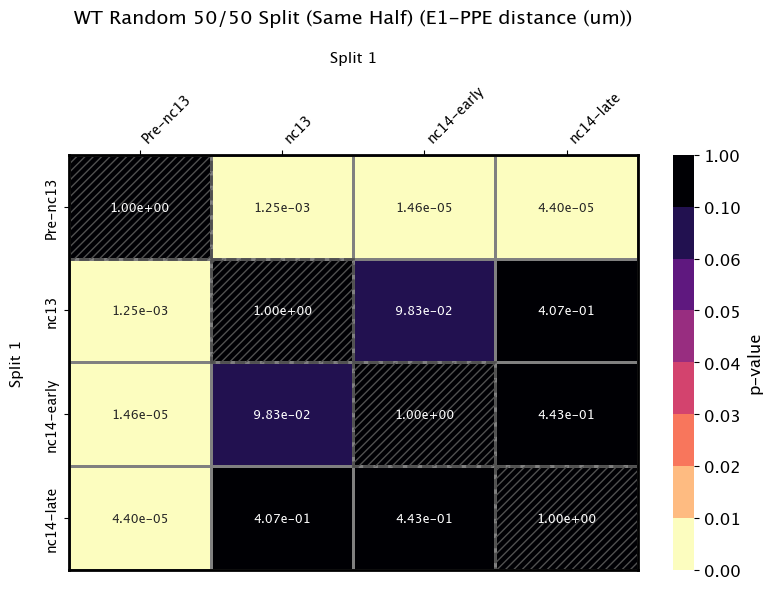

In [105]:
# =============================================================================
# WILD-TYPE RANDOM SPLIT BIAS CONTROL
# =============================================================================
# If our sampling is unbiased, random halves of the same data should show
# no significant differences (high p-values, especially on the diagonal)

print("Wild-type Random 50/50 Split - Bias Control")
print("=" * 60)
print("Expectation: No significant differences between random halves")
print("(Diagonal should show p=1, off-diagonal should match real stage comparisons)\n")

# E1-PPE random split
split_1_e1ppe, split_2_e1ppe = split_dataframes_randomly(
    [YW_E1_PPE_nc12, YW_E1_PPE_nc13, YW_E1_PPE_nc14_early, YW_E1_PPE_nc14_late],
    base_seed=19
)
generate_pvalue_heatmap_split_comparison(
    dataframes_1=split_1_e1ppe,
    dataframes_2=split_1_e1ppe,
    stages_labels=["Pre-nc13", "nc13", "nc14-early", "nc14-late"],
    distance_column="E1-PPE distance (um)",
    title="WT Random 50/50 Split (Same Half)",
    x_axis_label="Split 1",
    y_axis_label="Split 1"
)

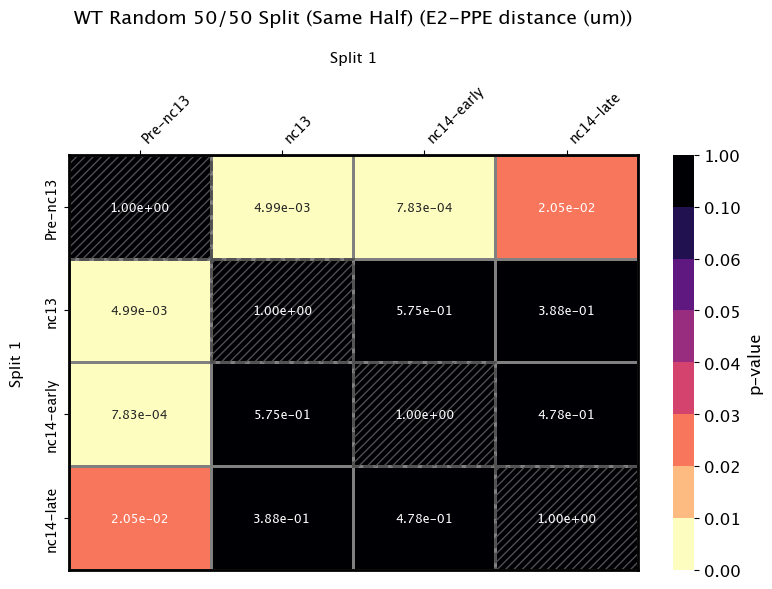

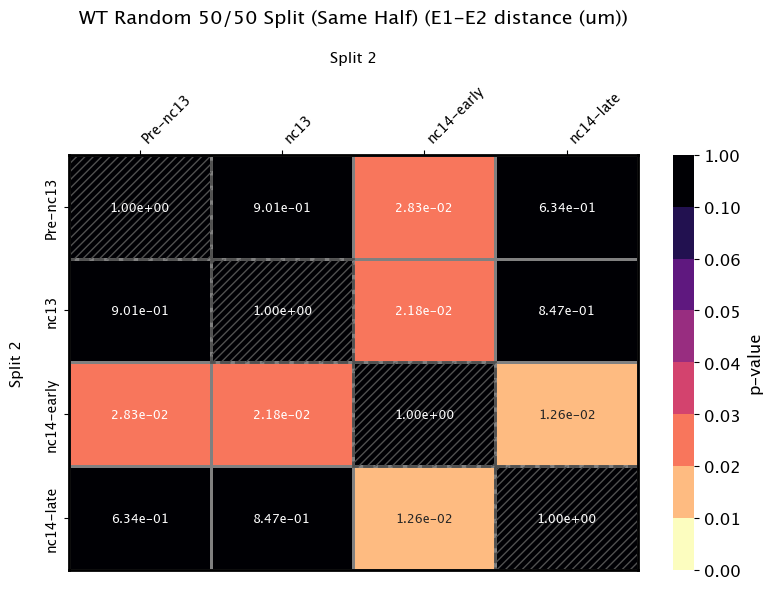

In [106]:
# E2-PPE random split
split_1_e2ppe, split_2_e2ppe = split_dataframes_randomly(
    [YW_E2_PPE_nc12, YW_E2_PPE_nc13, YW_E2_PPE_nc14_early, YW_E2_PPE_nc14_late],
    base_seed=19
)
generate_pvalue_heatmap_split_comparison(
    dataframes_1=split_1_e2ppe,
    dataframes_2=split_1_e2ppe,
    stages_labels=["Pre-nc13", "nc13", "nc14-early", "nc14-late"],
    distance_column="E2-PPE distance (um)",
    title="WT Random 50/50 Split (Same Half)",
    x_axis_label="Split 1",
    y_axis_label="Split 1"
)

# E1-E2 random split
split_1_e1e2, split_2_e1e2 = split_dataframes_randomly(
    [YW_E1_E2_nc12, YW_E1_E2_nc13, YW_E1_E2_nc14_early, YW_E1_E2_nc14_late],
    base_seed=19
)
generate_pvalue_heatmap_split_comparison(
    dataframes_1=split_2_e1e2,
    dataframes_2=split_2_e1e2,
    stages_labels=["Pre-nc13", "nc13", "nc14-early", "nc14-late"],
    distance_column="E1-E2 distance (um)",
    title="WT Random 50/50 Split (Same Half)",
    x_axis_label="Split 2",
    y_axis_label="Split 2"
)

---

# Section XIII: Summary and Outputs

## Files Generated by This Notebook

| File | Description |
|------|-------------|
| `YW_distance_data.xlsx` | Wild-type distances by stage |
| `PPE_distance_data.xlsx` | Δ800PPE distances by stage |
| `MiMIC_distance_data.xlsx` | MiMIC distances by stage |

## Analyses Completed

### Core Analyses (Figures 3-6)
- [x] Wild-type time-course PDFs and KS tests (Figure 3A-B)
- [x] Δ800PPE time-course PDFs and KS tests (Figure 4A)
- [x] MiMIC time-course PDFs and KS tests (Figure 5A)
- [x] Cross-genotype comparisons (Figure 6)

### Extended Analyses
- [x] Anchor PPE visualizations (Figure S3)
- [x] Subtraction contour plots (all comparisons)
- [x] Anterior vs Posterior regional comparison (Figure 7 and S4)
- [x] Anterior minus Posterior subtraction contours (Figures S4)
- [x] Power analysis validation
- [x] Random split bias control

## Key Findings

1. **Wild-type dynamics**: CRM configurations shift at nc13, with progressive
   compaction through nc14.

2. **Mutant phenotypes**: Both Δ800PPE and MiMIC show delayed chromatin dynamics,
   with the compaction seen in WT nc13 not appearing until nc14-early or later.

3. **Regional variation**: Anterior and posterior regions show distinct
   distance distributions, suggesting spatially-varying regulation.

---

*For Figure 7 twist vs no-twist analyses, see `Figure7_twist_vs_no_twist_cleaned.ipynb`*


In [107]:
print("=" * 60)
print("ANALYSIS COMPLETE")
print("=" * 60)
print()
print("This notebook has reproduced the analyses for Figures 3-6 from:")
print("Le MT et al. (2026) Nature Communications")
print("DOI: 10.1038/s41467-026-68460-x")
print()
print("For Figure 7 analyses, see: Figure7_twist_vs_no_twist_cleaned.ipynb")


ANALYSIS COMPLETE

This notebook has reproduced the analyses for Figures 3-6 from:
Le MT et al. (2026) Nature Communications
DOI: 10.1038/s41467-026-68460-x

For Figure 7 analyses, see: Figure7_twist_vs_no_twist_cleaned.ipynb
